###回帰モデルの構築(Target Encoding, 外れ値除去, PCA, UMAP, isoforest)

In [61]:
# from google.colab import drive
# drive.mount('/content/drive')

In [62]:
# %%shell
# pip install optuna
# pip install tensorflow
# pip install umap-learn
# pip install category_encoders
# pip install pandas-profiling
# pip install pydantic-settings
# pip install --upgrade pandas_profiling

### ライブラリインポート

In [63]:
# ライブラリのインポート
import numpy as np
import pandas as pd
import random
import optuna
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import BayesianRidge, Ridge, Lasso, ElasticNet, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.ensemble import IsolationForest
from xgboost import XGBRegressor
from category_encoders import TargetEncoder
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import statsmodels.formula.api as smf
import umap.umap_ as umap
import joblib
import warnings
warnings.simplefilter('ignore')

# データフレームで全ての列を表示するように設定
pd.set_option('display.max_columns', None)

### シード値の固定

In [64]:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

### データ読み込み

In [65]:
# 必要に応じて変更してください
# データの読み込み　
data_path = "/Users/shimomurakouma/Documents/研究/align/msk_met_2021_clinical_data.xlsx"
df = pd.read_excel(data_path, na_values=0)
display(df.head())

,Study ID,Patient ID,Sample ID,Age at Death,Age at First Mets Dx,Age at Last Contact,Age at Sequencing,Age at Surgical Procedure,Cancer Type,Cancer Type Detailed,Distant Mets: Adrenal Gland,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Metastatic Site,Met Count,Met Site Count,MSI Score,MSI Type,Mutation Count,Oncotree Code,Organ System,Overall Survival (Months),Overall Survival Status,Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sample Type,Sex,Subtype,Subtype Abbreviation,TMB (nonsynonymous),Tumor Purity
0,msk_met_2021,P-0000004,P-0000004-T01-IM3,40.06,39.66,NaN,39.74,37.03,Breast Cancer,Breast Invasive Ductal Carcinoma,No,No,No,Yes,No,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,No,0.278,0.2782,IMPACT341,1.0,NaN,2,2,2.50,Stable,4.0,IDC,Breast,3.78,1:DECEASED,Breast,White,1,428,Primary,Female,Breast Ductal HR+HER2-,IDC HR+HER2-,4.436621,50.0
1,msk_met_2021,P-0000015,P-0000015-T01-IM3,45.60,44.25,NaN,44.44,44.42,Breast Cancer,Breast Invasive Ductal Carcinoma,No,No,No,Yes,No,No,Yes,Yes,No,No,No,No,Yes,Yes,No,No,Yes,Yes,No,No,Yes,0.350,0.3503,IMPACT341,1.0,Liver,8,8,2.55,Stable,7.0,IDC,Breast,13.90,1:DECEASED,Breast,White,1,281,Metastasis,Female,Breast Ductal HR+HER2-,IDC HR+HER2-,7.764087,40.0
2,msk_met_2021,P-0000024,P-0000024-T01-IM3,64.25,59.44,NaN,61.33,61.00,Endometrial Cancer,Uterine Endometrioid Carcinoma,No,No,No,Yes,No,No,No,No,No,No,Yes,No,Yes,Yes,No,No,No,No,No,No,Yes,0.388,0.3878,IMPACT341,1.0,Lung,8,5,0.72,Stable,6.0,UEC,Gynecologic,35.06,1:DECEASED,Uterus,White,1,1016,Metastasis,Female,Uterine Endometrioid,UCEC ENDO,6.654932,40.0
3,msk_met_2021,P-0000025,P-0000025-T02-IM5,76.53,69.65,NaN,74.81,74.64,Endometrial Cancer,Uterine Serous Carcinoma/Uterine Papillary Ser...,Yes,Yes,No,No,Yes,No,No,No,Yes,No,Yes,No,Yes,No,No,No,Yes,No,No,No,Yes,0.102,0.1020,IMPACT410,1.0,Intra-Abdominal,13,8,0.15,Stable,2.0,USC,Gynecologic,46.00,1:DECEASED,Uterus,White,1,1147,Metastasis,Female,Uterine Serous,UCEC SEROUS,1.957439,30.0
4,msk_met_2021,P-0000026,P-0000026-T01-IM3,NaN,68.41,78.43,71.72,71.58,Endometrial Cancer,Uterine Endometrioid Carcinoma,No,No,No,No,Yes,No,No,Yes,Yes,No,Yes,No,Yes,Yes,No,No,No,No,No,No,Yes,0.420,0.4196,IMPACT341,1.0,Unspecified,11,7,1.23,Stable,4.0,UEC,Gynecologic,80.59,0:LIVING,Uterus,Asian-far east/indian subcont,1,1222,Metastasis,Female,Uterine Endometrioid,UCEC ENDO,4.436621,10.0


 ### 特徴量・データ数の確認

In [66]:
df.columns

Index(['Study ID', 'Patient ID', 'Sample ID', 'Age at Death',
       'Age at First Mets Dx', 'Age at Last Contact', 'Age at Sequencing',
       'Age at Surgical Procedure', 'Cancer Type', 'Cancer Type Detailed',
       'Distant Mets: Adrenal Gland', 'Distant Mets: Biliary tract',
       'Distant Mets: Bladder/UT', 'Distant Mets: Bone', 'Distant Mets: Bowel',
       'Distant Mets: Breast', 'Distant Mets: CNS/Brain',
       'Distant Mets: Distant LN', 'Distant Mets: Female Genital',
       'Distant Mets: Head and Neck', 'Distant Mets: Intra-Abdominal',
       'Distant Mets: Kidney', 'Distant Mets: Liver', 'Distant Mets: Lung',
       'Distant Mets: Male Genital', 'Distant Mets: Mediastinum',
       'Distant Mets: Ovary', 'Distant Mets: Pleura', 'Distant Mets: PNS',
       'Distant Mets: Skin', 'Distant Mets: Unspecified', 'FGA',
       'Fraction Genome Altered', 'Gene Panel', 'Metastatic patient',
       'Metastatic Site', 'Met Count', 'Met Site Count', 'MSI Score',
       'MSI Type', 'M

In [67]:
print(df.shape)

(25775, 55)


### 探索的データ分析(EDA)

In [68]:
# 基本統計量の出力
df.describe()

,Age at Death,Age at First Mets Dx,Age at Last Contact,Age at Sequencing,Age at Surgical Procedure,FGA,Fraction Genome Altered,Metastatic patient,Met Count,Met Site Count,MSI Score,Mutation Count,Overall Survival (Months),Number of Samples Per Patient,Sample coverage,TMB (nonsynonymous),Tumor Purity
count,10023.000000,19638.000000,15646.000000,25517.000000,24953.000000,24152.000000,24668.000000,21546.0,25775.000000,25775.000000,18824.000000,24753.000000,24561.000000,25775.0,25775.000000,24716.000000,25365.000000
mean,64.897442,61.014257,63.576261,62.302248,61.513569,0.207702,0.203466,1.0,3.857187,3.011988,1.759463,9.208217,23.101461,1.0,660.395267,8.295839,39.740075
std,12.564958,12.859221,12.942135,12.862323,12.943476,0.190911,0.191272,0.0,3.736549,2.579182,5.347137,22.262670,17.443618,0.0,212.485348,19.787962,20.676877
min,19.020000,12.570000,18.410000,18.290000,17.160000,0.001000,0.000100,1.0,0.000000,0.000000,-1.000000,1.000000,0.030000,1.0,100.000000,0.864698,5.000000
25%,57.160000,53.072500,55.552500,54.390000,53.560000,0.047000,0.041400,1.0,1.000000,1.000000,0.170000,3.000000,10.020000,1.0,526.000000,2.594094,20.000000
50%,66.210000,62.280000,65.075000,63.700000,62.880000,0.161000,0.155000,1.0,3.000000,2.000000,0.480000,5.000000,18.370000,1.0,653.000000,4.323490,40.000000
75%,73.865000,70.130000,72.887500,71.460000,70.660000,0.319000,0.314225,1.0,6.000000,5.000000,1.220000,8.000000,34.170000,1.0,790.000000,7.764087,50.000000
max,90.000000,90.000000,90.000000,90.000000,90.000000,1.000000,1.000000,1.0,31.000000,15.000000,53.440000,758.000000,80.890000,1.0,2778.000000,654.576458,100.000000


In [69]:
# 状態(LIVING or DECEASED)の確認
df['Overall Survival Status'].value_counts()

Overall Survival Status
0:LIVING      15606
1:DECEASED    10169
Name: count, dtype: int64

In [70]:
# 各がん種のデータ数を確認(LIVING & DECEASED)
df['Cancer Type Detailed'].value_counts()[0:10]

Cancer Type Detailed
Lung Adenocarcinoma                 4064
Colon Adenocarcinoma                2312
Breast Invasive Ductal Carcinoma    2236
Prostate Adenocarcinoma             2172
Pancreatic Adenocarcinoma           1779
High-Grade Serous Ovarian Cancer     997
Bladder Urothelial Carcinoma         961
Uterine Endometrioid Carcinoma       835
Rectal Adenocarcinoma                781
Cutaneous Melanoma                   699
Name: count, dtype: int64

In [71]:
# DECEASEDのみを抽出
filtered_df = df.query("`Overall Survival Status` == '1:DECEASED'")
display(filtered_df.head(1))
print(filtered_df.shape)

,Study ID,Patient ID,Sample ID,Age at Death,Age at First Mets Dx,Age at Last Contact,Age at Sequencing,Age at Surgical Procedure,Cancer Type,Cancer Type Detailed,Distant Mets: Adrenal Gland,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Metastatic Site,Met Count,Met Site Count,MSI Score,MSI Type,Mutation Count,Oncotree Code,Organ System,Overall Survival (Months),Overall Survival Status,Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sample Type,Sex,Subtype,Subtype Abbreviation,TMB (nonsynonymous),Tumor Purity
0,msk_met_2021,P-0000004,P-0000004-T01-IM3,40.06,39.66,NaN,39.74,37.03,Breast Cancer,Breast Invasive Ductal Carcinoma,No,No,No,Yes,No,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,No,0.278,0.2782,IMPACT341,1.0,NaN,2,2,2.5,Stable,4.0,IDC,Breast,3.78,1:DECEASED,Breast,White,1,428,Primary,Female,Breast Ductal HR+HER2-,IDC HR+HER2-,4.436621,50.0


(10169, 55)


In [72]:
# 各がん種のデータ数を確認(DECEASED only)
filtered_df['Cancer Type Detailed'].value_counts()[0:10]

Cancer Type Detailed
Lung Adenocarcinoma                 1704
Pancreatic Adenocarcinoma           1125
Colon Adenocarcinoma                 829
Breast Invasive Ductal Carcinoma     789
Prostate Adenocarcinoma              573
High-Grade Serous Ovarian Cancer     360
Bladder Urothelial Carcinoma         292
Lung Squamous Cell Carcinoma         285
Intrahepatic Cholangiocarcinoma      260
Rectal Adenocarcinoma                245
Name: count, dtype: int64

In [73]:
# 各がん種ごとのデータ抽出
lung   = filtered_df.query("`Cancer Type Detailed` == 'Lung Adenocarcinoma'")
pan    = filtered_df.query("`Cancer Type Detailed` == 'Pancreatic Adenocarcinoma'")
colon  = filtered_df.query("`Cancer Type Detailed` == 'Colon Adenocarcinoma'")
breast = filtered_df.query("`Cancer Type Detailed` == 'Breast Invasive Ductal Carcinoma'")
prosta = filtered_df.query("`Cancer Type Detailed` == 'Prostate Adenocarcinoma'")
ovary  = filtered_df.query("`Cancer Type Detailed` == 'High-Grade Serous Ovarian Cancer'")

print(lung.shape)
print(pan.shape)
print(colon.shape)
print(breast.shape)
print(prosta.shape)
print(ovary.shape)

(1704, 55)
(1125, 55)
(829, 55)
(789, 55)
(573, 55)
(360, 55)


In [74]:
# 欠損値の検出(あるものだけ表示)
def detect_null(data, data_name):
  print("="*10, data_name, "="*10)
  for idx, count in zip(data.isnull().sum().index, data.isnull().sum()):
    if count == 0:
      continue
    else:
      print(f"{idx}  :  Count = {count} Ratio = {round((count/len(data))*100)}%")
  print("")

In [75]:
# 欠損値確認
detect_null(lung, "Lung")
detect_null(pan, "Pancrea")
detect_null(colon, "Colon")
detect_null(breast, "Breast")
detect_null(prosta, "Prostate")
detect_null(ovary, "Ovary")

========== Lung ==========
Age at Death  :  Count = 27 Ratio = 2%
Age at First Mets Dx  :  Count = 75 Ratio = 4%
Age at Last Contact  :  Count = 1677 Ratio = 98%
Age at Sequencing  :  Count = 17 Ratio = 1%
Age at Surgical Procedure  :  Count = 62 Ratio = 4%
FGA  :  Count = 99 Ratio = 6%
Fraction Genome Altered  :  Count = 69 Ratio = 4%
Metastatic patient  :  Count = 75 Ratio = 4%
Metastatic Site  :  Count = 795 Ratio = 47%
MSI Score  :  Count = 467 Ratio = 27%
Mutation Count  :  Count = 36 Ratio = 2%
Overall Survival (Months)  :  Count = 12 Ratio = 1%
Race Category  :  Count = 3 Ratio = 0%
TMB (nonsynonymous)  :  Count = 36 Ratio = 2%
Tumor Purity  :  Count = 91 Ratio = 5%

========== Pancrea ==========
Age at Death  :  Count = 18 Ratio = 2%
Age at First Mets Dx  :  Count = 63 Ratio = 6%
Age at Last Contact  :  Count = 1107 Ratio = 98%
Age at Sequencing  :  Count = 2 Ratio = 0%
Age at Surgical Procedure  :  Count = 3 Ratio = 0%
FGA  :  Count = 130 Ratio = 12%
Fraction Genome Altered  :

### データ前処理

In [76]:
def preprocessing(data, target):
    # 各データの特徴を確認する場合は下記のdrop関数の記述をコメントアウトした上で実行 → check_value関数を実行
    data = data.drop(['Study ID', 'Patient ID', 'Sample ID', 'Age at Death',
                      'Age at First Mets Dx', 'Age at Last Contact', 'Age at Sequencing',
                      'Age at Surgical Procedure', 'Metastatic Site', 'MSI Score',
                      'Overall Survival Status','Subtype Abbreviation', 'Cancer Type',
                      'Distant Mets: Adrenal Gland', 'Subtype','Sample Type', 'MSI Type',
                      'Organ System', 'Oncotree Code', 'Cancer Type Detailed'], axis=1)

    # "Yes"と"No"をそれぞれ1と0に置換
    data.replace({'Yes': 1, 'No': 0}, inplace=True)
    data.replace({'Male': 1, 'Female': 0}, inplace=True)
    data.replace({'Primary': 1, 'Metastasis': 0}, inplace=True)

    # ターゲットエンコーディングを行う
    categorical_features = data.select_dtypes(include=['object', 'category']).columns
    encoder = TargetEncoder(cols=categorical_features)
    data[categorical_features] = encoder.fit_transform(data[categorical_features], data[target])

    # data["Metastatic patient"] = data["Metastatic patient"].fillna(0)
    print(data.mean())
    # data.fillna(data.mean(), inplace=True)
    data.dropna(inplace=True)

    return data

In [77]:
# 前処理後データ
lung2 = preprocessing(lung, "Overall Survival (Months)")
pan2 = preprocessing(pan, "Overall Survival (Months)")
colon2 = preprocessing(colon, "Overall Survival (Months)")
breast2 = preprocessing(breast, "Overall Survival (Months)")
prosta2 = preprocessing(prosta, "Overall Survival (Months)")
ovary2 = preprocessing(ovary, "Overall Survival (Months)")

Distant Mets: Biliary tract        0.082746
Distant Mets: Bladder/UT           0.012911
Distant Mets: Bone                 0.612676
Distant Mets: Bowel                0.026995
Distant Mets: Breast               0.008803
Distant Mets: CNS/Brain            0.435446
Distant Mets: Distant LN           0.235329
Distant Mets: Female Genital       0.008216
Distant Mets: Head and Neck        0.019953
Distant Mets: Intra-Abdominal      0.117371
Distant Mets: Kidney               0.044014
Distant Mets: Liver                0.319836
Distant Mets: Lung                 0.583920
Distant Mets: Male Genital         0.003521
Distant Mets: Mediastinum          0.117371
Distant Mets: Ovary                0.004108
Distant Mets: Pleura               0.449531
Distant Mets: PNS                  0.204812
Distant Mets: Skin                 0.035211
Distant Mets: Unspecified          0.586854
FGA                                0.218903
Fraction Genome Altered            0.215188
Gene Panel                      

In [78]:
# 各説明変数のuniqueな値を確認
def check_value(data):
  print(data['Cancer Type'].value_counts())
  print("=="*30)
  print("")
  print(data['Distant Mets: Adrenal Gland'].value_counts())
  print("=="*30)
  print("")
  print(data['Gene Panel'].value_counts())
  print("=="*30)
  print("")
  print(data['Race Category'].value_counts())
  print("=="*30)
  print("")
  print(data['Subtype'].value_counts())
  print("=="*30)
  print("")
  print(data['Subtype Abbreviation'].value_counts())
  print("=="*30)
  print("")
  print(data['Sample Type'].value_counts())
  print("=="*30)
  print("")
  print(data['MSI Type'].value_counts())
  print("=="*30)
  print("")
  print(data['Organ System'].value_counts())
  print("=="*30)
  print("")
  print(data['Oncotree Code'].value_counts())
  print("=="*30)
  print("")
  print(data['Metastatic patient'].value_counts())

### 未処理の欠損値が無いことを確認

In [79]:
# 欠損値確認
detect_null(lung2, "Lung")
detect_null(pan2, "Pancrea")
detect_null(colon2, "Colon")
detect_null(breast2, "Breast")
detect_null(prosta2, "Prostate")
detect_null(ovary2, "Ovary")

========== Lung ==========

========== Pancrea ==========

========== Colon ==========

========== Breast ==========

========== Prostate ==========

========== Ovary ==========



###各がん種における目的変数の分布等の把握

###1:Lung

In [80]:
lung2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
44,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.247,0.2474,16.733835,1.0,4,4,15.0,47.9,15.309474,14.613387,1,866,1,16.63733,50.0


###2:Pancrea

In [81]:
pan2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
63,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.268,0.2681,11.677684,1.0,2,2,4.0,8.81,12.940942,13.036884,1,639,0,4.436621,40.0


###3:Colon

In [82]:
colon2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
50,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0.231,0.2312,19.852028,1.0,4,4,9.0,1.45,16.530835,17.148843,1,610,0,9.982398,70.0


###4:Breast

In [83]:
breast2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.278,0.2782,21.506327,1.0,2,2,4.0,3.78,20.188601,20.63582,1,428,0,4.436621,50.0


###5:Prosta

In [84]:
prosta2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
98,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.06,0.0604,23.888539,1.0,2,2,3.0,4.67,18.785404,19.068712,1,1188,1,3.327466,30.0


###6:Ovary

In [85]:
ovary2.head(1)

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
22,1,1,0,1,0,0,0,1,0,1,0,1,1,0,0,0,0,0,1,1,0.724,0.7238,20.518465,1.0,17,9,4.0,24.48,15.119914,15.54449,1,952,0,3.914879,80.0


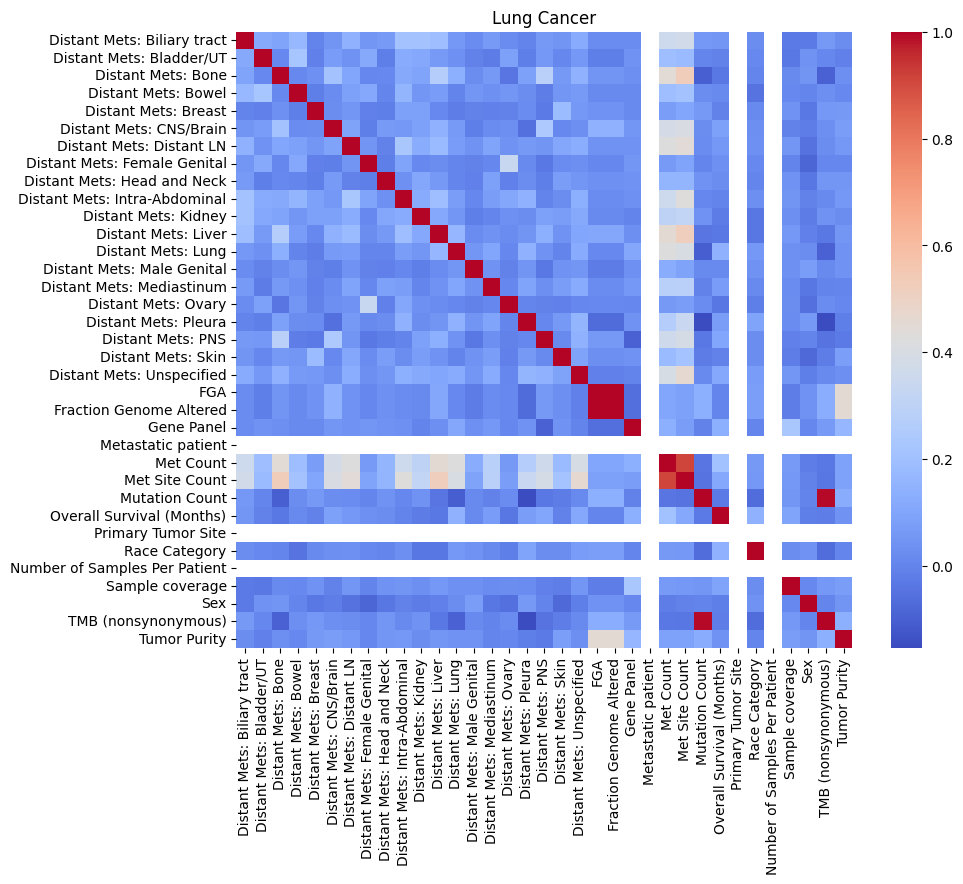

Correlation matrix for Lung Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.114866,0.096103,0.169084,-0.000117,0.049397,0.143411,0.051020,0.064199,0.209149,0.210560,0.191267,0.056048,0.019507,0.065396,0.019507,-0.001608,0.059807,0.047790,0.118885,0.020935,0.020918,0.019005,NaN,0.359157,0.370700,0.054740,0.050408,NaN,0.025512,NaN,-0.030585,-0.028444,0.058877,0.026625
Distant Mets: Bladder/UT,0.114866,1.000000,0.013421,0.223023,-0.011018,0.070402,0.039645,0.114019,-0.017233,0.117776,0.109715,0.063777,0.034994,-0.007775,-0.026374,0.084356,-0.015527,0.054520,0.008026,0.057610,-0.013294,-0.013561,0.042348,NaN,0.191223,0.179156,0.004258,-0.007265,NaN,0.009899,NaN,-0.034863,0.040207,0.008397,-0.012721
Distant Mets: Bone,0.096103,0.013421,1.000000,0.010395,0.036093,0.208382,0.102559,0.009248,0.013092,0.114101,0.095317,0.266013,0.133297,0.025467,0.060809,-0.042605,0.082021,0.287994,0.060156,0.146657,0.047043,0.047742,0.030592,NaN,0.448628,0.523924,-0.099245,-0.032569,NaN,0.001203,NaN,0.017422,0.047183,-0.095023,0.028010
Distant Mets: Bowel,0.169084,0.223023,0.010395,1.000000,-0.016290,0.019580,0.084985,0.112481,0.003576,0.157334,0.053794,0.070120,-0.000810,0.051860,0.034316,0.051860,0.024799,-0.021687,0.051972,0.063651,0.016826,0.016547,0.018078,NaN,0.191536,0.208221,0.026071,0.017495,NaN,-0.044977,NaN,0.011575,0.003089,0.027596,0.012340
Distant Mets: Breast,-0.000117,-0.011018,0.036093,-0.016290,1.000000,0.023510,0.051780,-0.008861,-0.013311,0.081655,0.084744,0.013706,-0.020189,-0.006005,-0.010987,-0.006005,0.021917,-0.029231,0.184771,0.057139,0.043068,0.042892,0.013937,NaN,0.072994,0.103351,0.060657,-0.006746,NaN,0.015436,NaN,0.040557,-0.034106,0.056394,0.061844
Distant Mets: CNS/Brain,0.049397,0.070402,0.208382,0.019580,0.023510,1.000000,0.091725,-0.013843,0.067568,0.056527,0.081649,0.146772,0.066850,-0.016083,0.019760,0.027479,-0.055708,0.240355,0.013497,0.028005,0.148297,0.148254,0.053055,NaN,0.384670,0.403468,0.023234,0.082459,NaN,0.031096,NaN,-0.006198,-0.020349,0.029416,0.072623
Distant Mets: Distant LN,0.143411,0.039645,0.102559,0.084985,0.051780,0.091725,1.000000,0.045440,-0.004598,0.228731,0.124968,0.177684,0.071649,0.036536,0.096378,0.036536,0.059060,0.049833,0.106180,0.128080,0.040917,0.041174,0.038588,NaN,0.427253,0.445639,0.020845,0.057580,NaN,0.032922,NaN,0.052784,-0.049634,0.025182,0.055477
Distant Mets: Female Genital,0.051020,0.114019,0.009248,0.112481,-0.008861,-0.013843,0.045440,1.000000,-0.013859,0.098075,0.011905,0.023332,0.001670,-0.006253,0.009228,0.335716,0.014179,-0.031939,0.020107,0.030385,0.006479,0.006332,0.052363,NaN,0.066957,0.095140,0.003715,0.034625,NaN,0.012069,NaN,-0.003130,-0.083973,0.007780,0.006990
Distant Mets: Head and Neck,0.064199,-0.017233,0.013092,0.003576,-0.013311,0.067568,-0.004598,-0.013859,1.000000,0.036025,0.103986,0.062403,0.004076,-0.009392,0.082767,-0.009392,0.025135,-0.014329,0.076672,0.052722,0.032301,0.032044,0.038339,NaN,0.156797,0.157444,0.041796,0.026906,NaN,0.004286,NaN,0.040650,-0.035771,0.051942,0.053604
Distant Mets: Intra-Abdominal,0.209149,0.117776,0.114101,0.157334,0.081655,0.056527,0.228731,0.098075,0.036025,1.000000,0.118958,0.191486,0.076673,0.008320,0.073727,0.106912,0.148307,-0.003721,0.027023,0.136114,0.019037,0.019618,0.036221,NaN,0.359718,0.428701,0.009169,-0.003908,NaN,0.031551,NaN,0.049294,-0.007201,0.0

削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
44,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.247,16.733835,1.0,4,4,15.0,47.90,15.309474,14.613387,1,866,1,50.0
60,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0.003,16.733835,1.0,7,7,4.0,19.58,15.309474,14.613387,1,529,0,30.0
69,1,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0.450,16.733835,1.0,8,8,5.0,18.73,15.309474,16.680078,1,164,0,50.0
105,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0.404,17.601753,1.0,7,7,3.0,13.21,15.309474,14.613387,1,442,0,40.0
128,0,0,1,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,0.002,16.733835,1.0,12,7,4.0,39.92,15.309474,14.613387,1,970,1,30.0


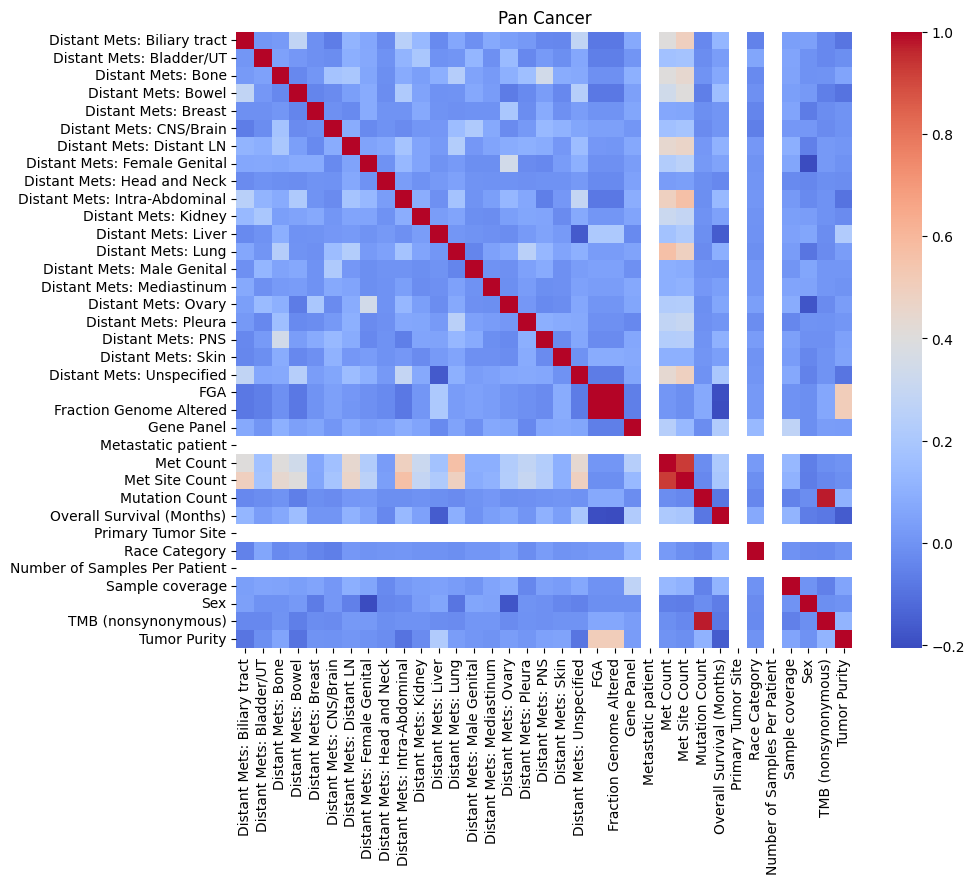

Correlation matrix for Pan Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.007941,0.023775,0.282901,-0.007662,-0.064930,0.114463,0.066470,-0.021406,0.250478,0.137337,-0.027220,0.067517,-0.007662,0.076504,0.039154,0.019639,-0.031265,-0.038414,0.281530,-0.078863,-0.079252,0.075457,NaN,0.406042,0.493219,-0.031287,0.123827,NaN,-0.050492,NaN,0.036562,0.040198,-0.030907,-0.087928
Distant Mets: Bladder/UT,0.007941,1.000000,0.049516,0.016148,-0.008184,-0.018456,0.095375,0.070096,-0.004086,0.113439,0.199478,-0.005799,0.003586,0.122213,-0.010843,0.141148,-0.033249,0.024406,-0.014824,0.066374,-0.063137,-0.063329,0.003988,NaN,0.167776,0.180884,-0.019088,0.032989,NaN,0.060199,NaN,0.057627,-0.003484,-0.031344,-0.014114
Distant Mets: Bone,0.023775,0.049516,1.000000,-0.030622,0.011422,0.177294,0.198934,0.062936,-0.015264,0.079905,0.037960,0.094019,0.234221,0.053420,0.023083,0.097592,0.161991,0.342181,0.085060,0.076849,-0.007830,-0.007389,0.097446,NaN,0.403533,0.441397,0.000597,0.068741,NaN,-0.028247,NaN,0.050066,-0.006483,0.000931,0.055523
Distant Mets: Bowel,0.282901,0.016148,-0.030622,1.000000,-0.040037,-0.024897,0.037046,0.080167,-0.019987,0.216017,0.054001,-0.004495,0.002497,0.068700,0.029279,-0.069206,-0.029654,0.032220,-0.032119,0.239503,-0.078781,-0.079009,0.040468,NaN,0.339979,0.406012,-0.062282,0.156837,NaN,-0.008776,NaN,0.036168,0.016795,-0.061587,-0.095255
Distant Mets: Breast,-0.007662,-0.008184,0.011422,-0.040037,1.000000,-0.009475,-0.030146,0.078032,-0.002098,0.002035,0.073651,-0.000472,-0.009738,-0.004202,-0.005567,0.196768,-0.017070,0.079620,-0.007611,0.034077,0.001974,0.001987,0.060094,NaN,0.064717,0.059734,-0.012024,0.002513,NaN,-0.044262,NaN,0.054883,-0.071239,-0.017914,0.001961
Distant Mets: CNS/Brain,-0.064930,-0.018456,0.177294,-0.024897,-0.009475,1.000000,0.084937,-0.027203,-0.004730,-0.024660,0.010421,0.015887,0.150378,0.216982,0.073174,-0.023457,0.020862,0.138289,0.109051,0.059101,0.042571,0.042459,0.010732,NaN,0.166283,0.181706,-0.022817,0.006817,NaN,-0.062626,NaN,0.015553,0.015543,-0.025127,-0.004477
Distant Mets: Distant LN,0.114463,0.095375,0.198934,0.037046,-0.030146,0.084937,1.000000,0.050337,0.069580,0.184297,0.055006,0.025166,0.232137,0.012236,0.056321,0.082751,0.099698,0.084750,0.016258,0.151501,0.012065,0.011789,0.069566,NaN,0.441963,0.465109,0.016310,0.106101,NaN,0.013957,NaN,0.094756,-0.054969,0.017876,0.008238
Distant Mets: Female Genital,0.066470,0.070096,0.062936,0.080167,0.078032,-0.027203,0.050337,1.000000,-0.006022,0.133847,0.056620,-0.001354,0.021907,-0.012063,-0.015983,0.341872,-0.025393,-0.034068,0.028363,0.097833,-0.008835,-0.008973,0.035042,NaN,0.228282,0.257795,0.020209,0.049827,NaN,-0.000407,NaN,0.061565,-0.204525,0.018822,-0.003222
Distant Mets: Head and Neck,-0.021406,-0.004086,-0.015264,-0.019987,-0.002098,-0.004730,0.069580,-0.006022,1.000000,0.033391,-0.006308,0.018526,0.047162,-0.002098,-0.002779,-0.005193,-0.008522,-0.005924,-0.003799,0.017011,-0.027723,-0.027655,0.047386,NaN,0.029494,0.037823,-0.013140,-0.034511,NaN,0.003881,NaN,-0.029188,-0.035564,-0.013552,-0.018719
Distant Mets: Intra-Abdominal,0.250478,0.113439,0.079905,0.216017,0.002035,-0.024660,0.184297,0.133847,0.033391,1.000000,0.089708,-0.008266,0.178576,0.002035,0.039522,0.125451,0.067763,-0.059244,0.012723,0.290944,-0.081431,-0.080998,0.088347,NaN,0.490857,0.563292,

削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
63,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.268,11.677684,1.0,2,2,4.0,8.81,12.940942,13.036884,1,639,0,40.0
480,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.414,11.677684,1.0,4,4,5.0,3.06,12.940942,13.036884,1,399,1,80.0
794,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.003,11.677684,1.0,4,4,2.0,1.94,12.940942,13.036884,1,619,0,25.0
934,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0.004,11.677684,1.0,4,2,2.0,16.23,12.940942,13.036884,1,765,1,30.0
954,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.627,11.677684,1.0,3,3,2.0,3.94,12.940942,11.308880,1,886,0,60.0


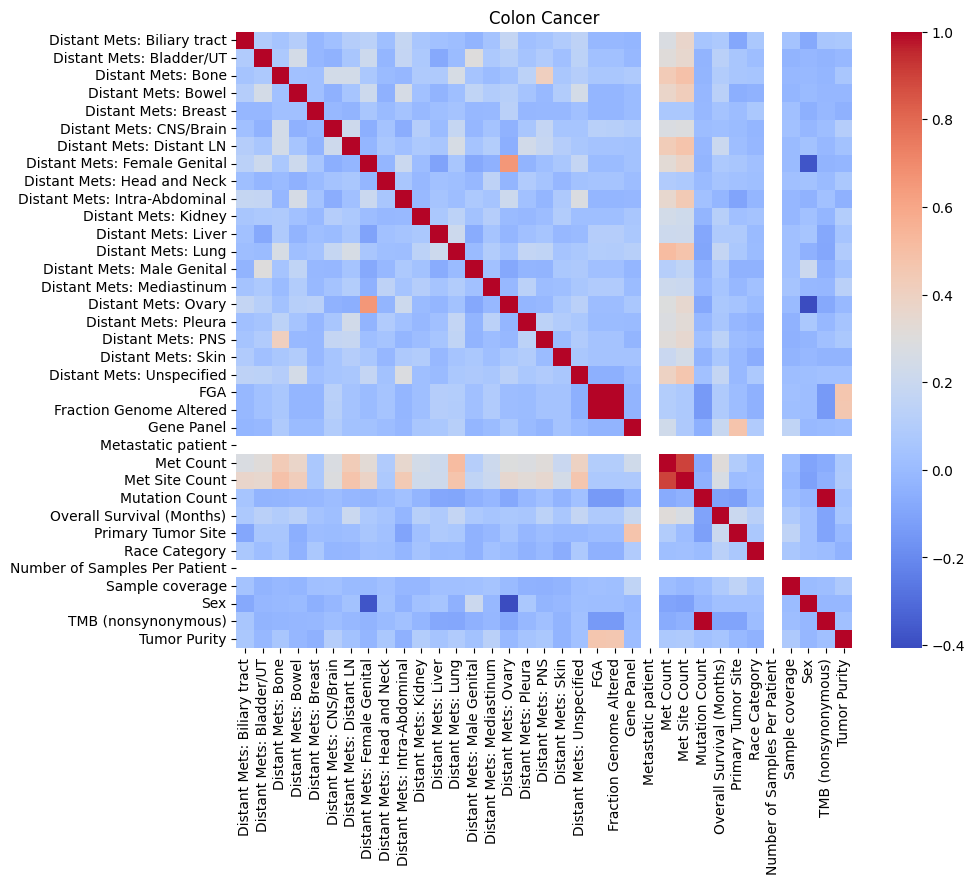

Correlation matrix for Colon Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.089482,0.045206,0.109535,-0.021234,0.026400,0.109106,0.135526,0.021209,0.176307,0.056919,0.032128,0.015968,-0.033452,0.043100,0.174594,0.025551,0.048864,0.088821,0.145583,-0.010871,-0.011213,-0.024873,NaN,0.276898,0.364230,0.055233,0.076580,-0.087992,0.067677,NaN,0.039507,-0.080762,0.056771,0.067498
Distant Mets: Bladder/UT,0.089482,1.000000,0.074604,0.244442,-0.016778,-0.040196,0.057487,0.209799,-0.023758,0.171781,0.071798,-0.079635,0.004333,0.300491,0.071869,0.118669,0.045344,0.089928,0.024581,0.139614,0.030818,0.032033,-0.011330,NaN,0.309874,0.354499,-0.034752,0.127036,0.056797,0.016682,NaN,-0.032897,-0.020007,-0.036646,-0.010794
Distant Mets: Bone,0.045206,0.074604,1.000000,0.029759,0.027369,0.239946,0.239180,0.066326,-0.002368,-0.019107,0.085436,0.086987,0.260669,0.047811,0.002283,0.035179,0.140594,0.410851,0.063224,0.105490,0.065738,0.065863,0.083279,NaN,0.438503,0.488842,-0.030023,0.096129,0.060013,0.054849,NaN,-0.013404,-0.008536,-0.026482,0.059376
Distant Mets: Bowel,0.109535,0.244442,0.029759,1.000000,0.025835,-0.048300,0.050817,0.211554,-0.044666,0.253579,0.028791,-0.034163,0.016941,0.157618,0.097865,0.120362,0.045097,-0.010432,0.096976,0.244762,-0.026643,-0.025751,0.001886,NaN,0.372840,0.419960,-0.017507,0.129734,-0.058929,-0.040298,NaN,-0.025411,-0.003364,-0.016940,-0.016814
Distant Mets: Breast,-0.021234,-0.016778,0.027369,0.025835,1.000000,-0.016014,-0.035411,0.060739,-0.003717,0.039739,-0.009026,0.020110,0.040519,-0.010885,-0.006192,0.130517,-0.017643,-0.014684,-0.011882,0.026888,-0.022910,-0.022985,0.004307,NaN,0.069490,0.070867,-0.013550,0.039257,0.010642,0.067220,NaN,0.023084,-0.053006,-0.013657,-0.047197
Distant Mets: CNS/Brain,0.026400,-0.040196,0.239946,-0.048300,-0.016014,1.000000,0.216358,-0.057185,0.041018,-0.061272,0.106335,0.001061,0.181083,-0.021190,0.039395,-0.041605,0.056596,0.170731,0.052814,0.052344,0.121299,0.121159,0.095586,NaN,0.278277,0.288742,0.011015,0.017181,0.001838,-0.023479,NaN,0.030284,-0.019842,0.013403,0.109196
Distant Mets: Distant LN,0.109106,0.057487,0.239180,0.050817,-0.035411,0.216358,1.000000,-0.026883,0.066183,0.027659,0.074746,0.057399,0.259101,0.045854,0.104388,-0.057399,0.234629,0.182238,0.106692,0.063546,0.043323,0.042807,0.034881,NaN,0.432797,0.473400,-0.019346,0.202257,0.013824,-0.020330,NaN,-0.004009,0.035264,-0.015447,0.035562
Distant Mets: Female Genital,0.135526,0.209799,0.066326,0.211554,0.060739,-0.057185,-0.026883,1.000000,-0.026510,0.199610,0.006904,-0.107250,0.055356,-0.077641,-0.044166,0.656375,-0.033523,0.017898,0.062828,0.172053,0.004277,0.005231,0.036877,NaN,0.328790,0.382081,-0.031924,0.074907,0.059261,0.027679,NaN,-0.004038,-0.378074,-0.034097,-0.025463
Distant Mets: Head and Neck,0.021209,-0.023758,-0.002368,-0.044666,-0.003717,0.041018,0.066183,-0.026510,1.000000,0.056274,-0.012781,0.028477,0.020102,-0.015414,0.143483,-0.028477,0.092840,0.047682,-0.016826,0.038076,0.047922,0.047848,0.008599,NaN,0.093531,0.077063,-0.003345,0.049631,0.028247,0.017777,NaN,0.027676,0.033825,-0.003028,0.068524
Distant Mets: Intra-Abdominal,0.176307,0.171781,-0.019107,0.253579,0.039739,-0.061272,0.027659,0.199610,0.056274,1.000000,-0.005693,0.045161,0.014207,0.071746,0.048376,0.209120,0.030094,-0.022572,0.081667,0.282539,-0.026692,-0.026678,-0.

削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
50,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0.231,19.852028,1.0,4,4,9.0,1.45,16.530835,17.148843,1,610,0,70.0
130,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0.198,19.852028,1.0,5,5,8.0,4.37,13.147336,17.148843,1,902,0,60.0
336,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0.274,19.852028,1.0,2,2,6.0,3.38,19.659664,12.456769,1,756,1,70.0
372,1,0,1,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,1,1,0.698,19.852028,1.0,9,9,7.0,3.81,13.147336,17.148843,1,851,0,80.0
379,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,1,0.111,19.852028,1.0,6,6,9.0,5.22,16.530835,12.456769,1,605,0,30.0


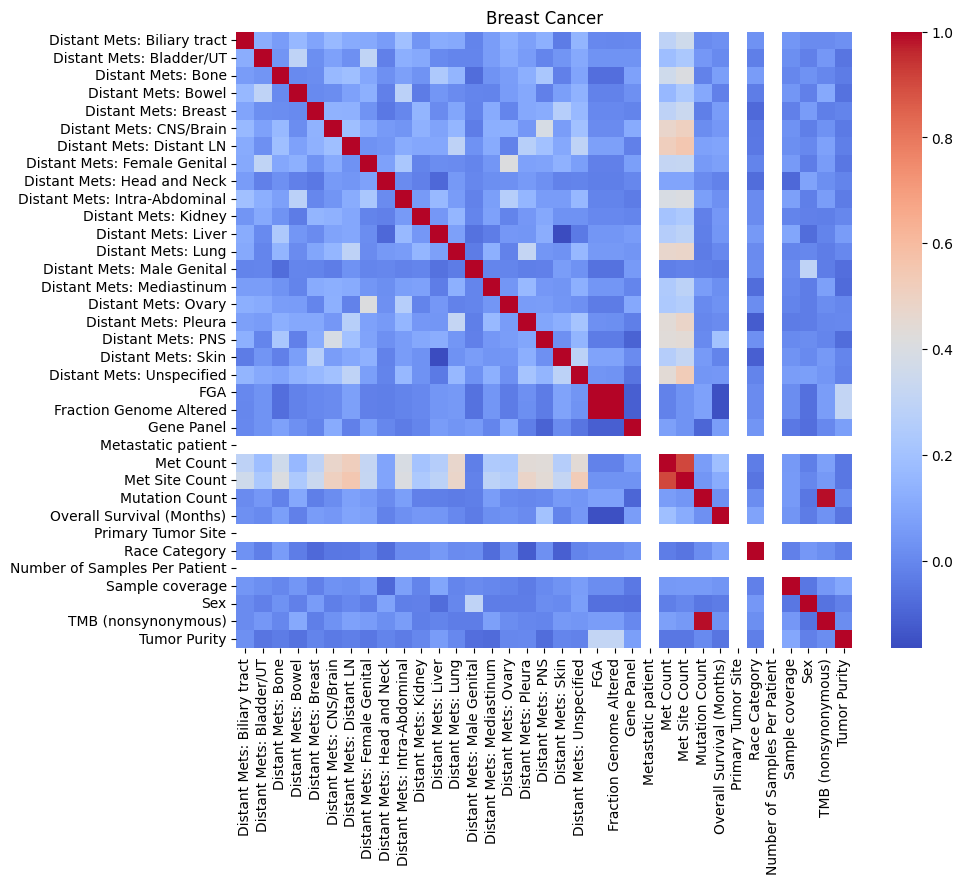

Correlation matrix for Breast Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.118711,0.060956,0.160540,0.088294,0.163535,0.111187,0.105273,0.060245,0.191125,0.037172,0.117011,0.105569,-0.010122,0.066245,0.126217,0.072769,0.127920,-0.036471,0.146392,-0.000507,-0.000812,-0.000321,NaN,0.291976,0.356787,0.010375,0.024807,NaN,0.030253,NaN,0.041459,0.010303,0.012826,0.023244
Distant Mets: Bladder/UT,0.118711,1.000000,0.036485,0.298549,0.019353,0.077101,0.025283,0.300741,-0.019725,0.125376,0.106903,0.006722,-0.008070,-0.006199,0.063384,0.109491,0.058675,-0.007535,0.036920,0.106495,0.034906,0.034796,0.032196,NaN,0.181923,0.228829,0.045439,0.004826,NaN,-0.023673,NaN,0.021300,-0.020702,0.048450,-0.055226
Distant Mets: Bone,0.060956,0.036485,1.000000,0.008431,0.014524,0.166451,0.186846,0.095396,0.025619,0.073893,0.031238,0.237480,0.148114,-0.077779,0.031340,0.065757,0.126274,0.225933,-0.021819,0.090122,-0.072488,-0.072017,0.078383,NaN,0.356040,0.406130,-0.014742,0.070248,NaN,0.061128,NaN,-0.004140,0.029784,-0.001436,-0.034806
Distant Mets: Bowel,0.160540,0.298549,0.008431,1.000000,0.006743,0.015050,0.078538,0.129814,-0.021668,0.284981,-0.034622,0.042035,0.009571,-0.006810,-0.014286,0.058796,0.101614,-0.023127,0.068752,0.136241,-0.014340,-0.014455,0.022322,NaN,0.159321,0.233859,0.101798,-0.022063,NaN,-0.028156,NaN,0.044292,-0.022741,0.104372,-0.060270
Distant Mets: Breast,0.088294,0.019353,0.014524,0.006743,1.000000,0.139620,0.133244,0.032846,-0.042087,-0.000690,0.146260,0.011911,0.091935,-0.013227,0.108961,-0.008098,0.102906,0.113198,0.266323,0.165508,0.001567,0.001610,-0.012767,NaN,0.292686,0.338630,-0.025629,0.058522,NaN,-0.084137,NaN,-0.019163,0.062073,-0.025517,-0.010463
Distant Mets: CNS/Brain,0.163535,0.077101,0.166451,0.015050,0.139620,1.000000,0.186143,0.110187,0.054140,0.039421,0.133066,0.082131,0.153346,-0.028775,0.123452,0.129213,0.047714,0.386532,0.063898,0.198405,0.010054,0.009600,0.112135,NaN,0.472543,0.507572,0.014376,0.048726,NaN,-0.046935,NaN,0.028789,-0.026588,0.029864,-0.040243
Distant Mets: Distant LN,0.111187,0.025283,0.186846,0.078538,0.133244,0.186143,1.000000,0.027659,0.042090,0.114819,0.098360,0.095071,0.290877,0.028524,0.111837,-0.018301,0.270162,0.195986,0.099727,0.297799,0.076588,0.076237,-0.021045,NaN,0.517106,0.550882,0.080122,0.085842,NaN,-0.043995,NaN,0.021979,0.002379,0.079330,-0.023857
Distant Mets: Female Genital,0.105273,0.300741,0.095396,0.129814,0.032846,0.110187,0.027659,1.000000,0.078558,0.222653,-0.010097,0.016339,0.012164,-0.008655,0.044453,0.410600,0.080565,0.084840,0.132170,0.070127,-0.023135,-0.023335,0.069082,NaN,0.314562,0.318312,0.056261,0.075757,NaN,-0.013368,NaN,0.057989,-0.028903,0.058973,-0.048536
Distant Mets: Head and Neck,0.060245,-0.019725,0.025619,-0.021668,-0.042087,0.054140,0.042090,0.078558,1.000000,0.009601,-0.022131,-0.088305,0.053256,-0.004353,0.019751,0.024483,0.054156,0.023186,-0.014624,-0.011365,-0.025233,-0.025308,-0.002053,NaN,0.089834,0.086778,0.012695,-0.018328,NaN,-0.074913,NaN,-0.091355,0.082197,0.019042,-0.012851
Distant Mets: Intra-Abdominal,0.191125,0.125376,0.073893,0.284981,-0.000690,0.039421,0.114819,0.222653,0.009601,1.000000,0.055446,0.166164,0.059945,-0.016703,0.069663,0.265840,0.151688,0.060771,0.062673,0.158994,-0.011515,-0.011958,-0.032930,NaN,0.394308,0.408676,0.069780,0.022540,NaN,0.012723,NaN,0.07

削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.278,21.506327,1.0,2,2,4.0,3.78,20.188601,20.63582,1,428,0,50.0
1,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,1,0.350,21.506327,1.0,8,8,7.0,13.90,20.188601,20.63582,1,281,0,40.0
9,0,0,1,0,1,1,1,0,0,0,0,1,1,0,0,0,1,0,1,1,0.404,21.506327,1.0,9,9,10.0,13.60,20.188601,20.63582,1,401,0,30.0
15,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0.532,21.506327,1.0,8,5,1.0,60.72,20.188601,20.63582,1,799,0,50.0
28,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.324,19.095472,1.0,3,2,6.0,34.89,20.188601,20.63582,1,761,0,60.0


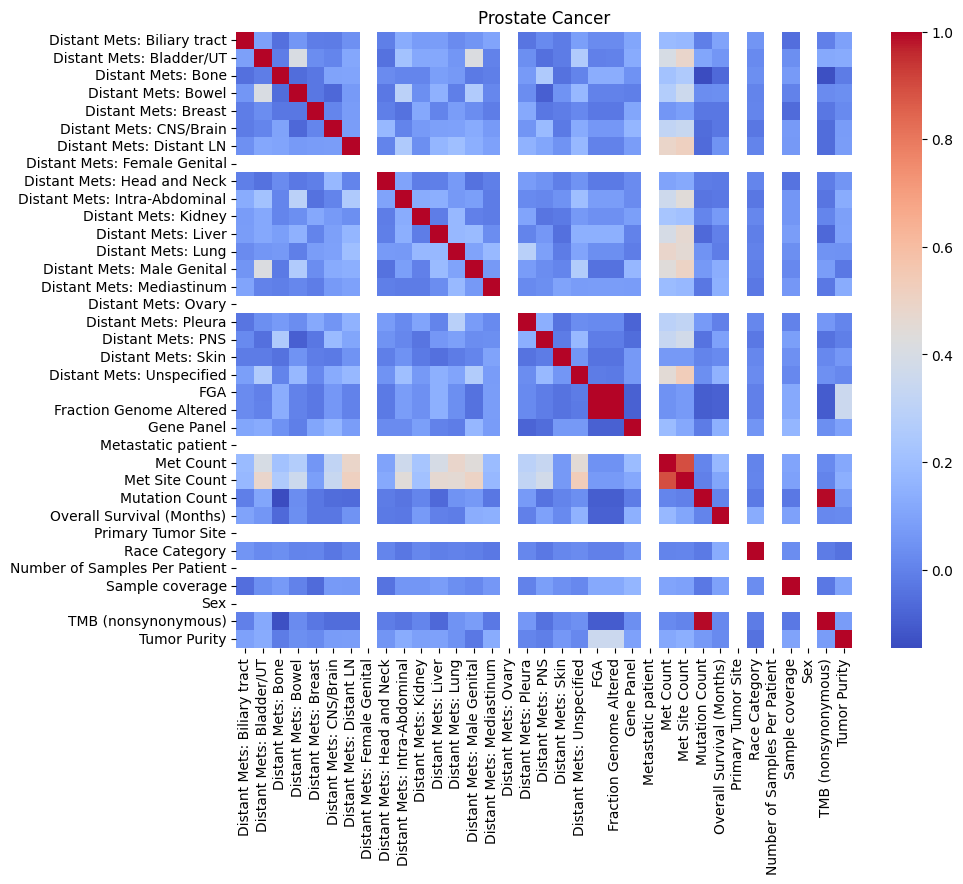

Correlation matrix for Prostate Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.091773,-0.050654,0.057131,-0.012950,-0.017612,0.038868,NaN,-0.010012,0.132119,0.077990,0.078892,0.024933,0.053785,0.103362,NaN,-0.037412,0.024339,-0.018403,0.083137,0.028370,0.028235,0.106119,NaN,0.182787,0.174789,-0.009324,0.096836,NaN,0.052868,NaN,-0.051562,NaN,-0.005456,0.093901
Distant Mets: Bladder/UT,0.091773,1.000000,-0.015254,0.407804,0.033068,0.008601,0.112760,NaN,-0.044158,0.215347,0.116048,0.116024,0.056128,0.414789,-0.000953,NaN,0.035406,-0.049142,-0.017088,0.259820,-0.002114,-0.001797,0.124515,NaN,0.397656,0.482220,0.107206,0.059992,NaN,0.022607,NaN,0.035758,NaN,0.122146,0.125227
Distant Mets: Bone,-0.050654,-0.015254,1.000000,-0.058520,-0.030495,0.098401,0.103303,NaN,0.025933,0.010439,0.010702,0.086530,0.069225,-0.020273,-0.008221,NaN,0.073187,0.254446,-0.043335,0.005387,0.134161,0.133804,0.045903,NaN,0.216013,0.255845,-0.145183,-0.067041,NaN,0.035121,NaN,0.071159,NaN,-0.132014,-0.017272
Distant Mets: Bowel,0.057131,0.407804,-0.058520,1.000000,-0.031814,-0.070799,0.070008,NaN,-0.024596,0.294225,0.037216,0.149182,-0.008547,0.261226,0.012612,NaN,0.031814,-0.092271,0.049731,0.175453,0.000037,-0.000072,-0.008053,NaN,0.268208,0.357527,0.029424,0.036263,NaN,0.005792,NaN,0.000226,NaN,0.024831,0.035352
Distant Mets: Breast,-0.012950,0.033068,-0.030495,-0.031814,1.000000,0.010699,0.074153,NaN,-0.007434,-0.045199,0.116230,0.004624,0.078786,0.030057,-0.012198,NaN,0.121795,-0.031983,-0.013664,0.018228,-0.027064,-0.027124,0.105338,NaN,0.059130,0.084805,-0.033076,-0.031695,NaN,0.010161,NaN,-0.061576,NaN,-0.030213,0.024063
Distant Mets: CNS/Brain,-0.017612,0.008601,0.098401,-0.070799,0.010699,1.000000,0.081645,NaN,0.173702,0.003827,0.072313,0.089190,0.094372,0.126710,0.072952,NaN,0.054684,0.185314,-0.022806,0.124923,0.062775,0.063470,0.163816,NaN,0.317683,0.339578,-0.060030,-0.030062,NaN,-0.032831,NaN,0.070994,NaN,-0.055906,0.078239
Distant Mets: Distant LN,0.038868,0.112760,0.103303,0.070008,0.074153,0.081645,1.000000,NaN,0.004802,0.254844,0.036181,0.163658,0.200983,0.139715,0.094068,NaN,0.153827,0.107749,0.047447,0.173812,-0.000727,-0.000502,0.080803,NaN,0.487907,0.514997,-0.060880,0.047721,NaN,0.003261,NaN,0.065837,NaN,-0.055719,0.078921
Distant Mets: Female Genital,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Distant Mets: Head and Neck,-0.010012,-0.044158,0.025933,-0.024596,-0.007434,0.173702,0.004802,NaN,1.000000,0.097996,-0.011595,-0.006852,0.072560,-0.045492,-0.009430,NaN,0.074888,0.049151,-0.010564,0.047723,-0.020237,-0.020278,0.024873,NaN,0.098196,0.118827,-0.015843,-0.022645,NaN,0.007855,NaN,-0.039203,NaN,-0.014839,0.051849
Distant Mets: Intra-Abdominal,0.132119,0.215347,0.010439,0.294225,-0.045199,0.003827,0.254844,NaN,0.097996,1.000000,0.130653,0.137518,0.067775,0.086780,-0.016438,NaN,0.022272,0.012874,0.045730,0.201263,0.080067,0.080736,0.026636,NaN,0.362268,0.440890,-0.036008,-0.025774,NaN,-0.028897,NaN,0.059864,NaN,-0.033475,0.130937


削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
98,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.060,23.888539,1.0,2,2,3.0,4.67,18.785404,19.068712,1,1188,1,30.0
175,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0.559,23.888539,1.0,4,4,3.0,1.31,18.785404,22.960609,1,782,1,60.0
212,0,0,1,0,0,0,1,0,0,0,0,1,1,1,1,0,0,1,0,1,0.629,20.759786,1.0,15,9,1.0,34.07,18.785404,19.068712,1,865,1,30.0
215,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0.425,23.888539,1.0,8,5,9.0,30.46,18.785404,19.068712,1,805,1,80.0
259,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0.224,23.888539,1.0,10,5,6.0,25.99,18.785404,19.068712,1,734,1,70.0


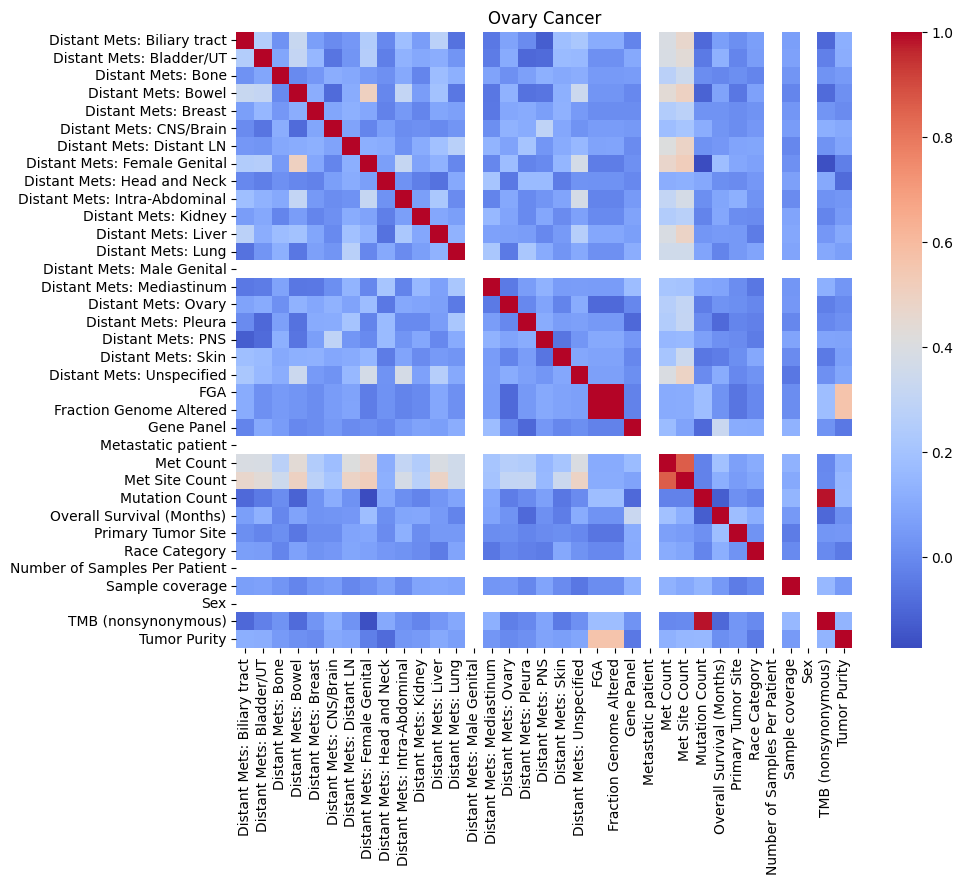

Correlation matrix for Ovary Cancer:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Fraction Genome Altered,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,TMB (nonsynonymous),Tumor Purity
Distant Mets: Biliary tract,1.000000,0.248476,0.019517,0.324590,0.060563,0.004106,0.040461,0.244961,-0.005889,0.180761,0.057805,0.277449,-0.068660,NaN,-0.051846,0.077076,0.002763,-0.125677,0.180183,0.216368,0.110632,0.110259,-0.018248,NaN,0.391925,0.464077,-0.090904,0.062316,0.012092,0.063534,NaN,0.063416,NaN,-0.098080,0.115741
Distant Mets: Bladder/UT,0.248476,1.000000,0.084765,0.311189,0.147683,-0.063184,0.029241,0.255105,-0.033358,0.131882,0.095982,0.111475,0.030365,NaN,-0.041509,0.103363,-0.098295,-0.087331,0.161577,0.160288,0.018646,0.018979,0.097669,NaN,0.385916,0.435077,-0.047648,0.125363,-0.016068,0.059850,NaN,0.071203,NaN,-0.029864,0.115227
Distant Mets: Bone,0.019517,0.084765,1.000000,-0.001750,0.041943,0.113911,0.094587,0.049374,0.016639,0.097314,-0.014137,0.174320,0.123953,NaN,0.078128,0.015177,0.068702,0.123103,0.098554,0.111979,0.049473,0.049422,0.053734,NaN,0.271950,0.340057,0.009800,-0.011355,0.012424,-0.014281,NaN,0.030358,NaN,0.024996,0.047015
Distant Mets: Bowel,0.324590,0.311189,-0.001750,1.000000,0.113888,-0.088130,0.106396,0.501473,-0.008714,0.305947,0.059125,0.193536,-0.058139,NaN,-0.058493,0.129336,-0.068764,-0.059737,0.122415,0.339386,0.030866,0.030902,-0.006202,NaN,0.437492,0.496185,-0.110644,0.078101,-0.054191,0.073272,NaN,-0.013014,NaN,-0.089870,0.017328
Distant Mets: Breast,0.060563,0.147683,0.041943,0.113888,1.000000,0.083930,0.124590,0.090400,-0.023728,0.043367,-0.015121,0.083578,0.068772,NaN,-0.052922,0.089620,0.104653,0.060768,0.126565,0.049902,0.008203,0.008230,0.007547,NaN,0.248243,0.278983,0.024109,0.027498,0.005537,0.024866,NaN,0.036590,NaN,0.029528,0.002724
Distant Mets: CNS/Brain,0.004106,-0.063184,0.113911,-0.088130,0.083930,1.000000,0.076063,-0.014261,0.061863,0.008698,0.015265,-0.003104,0.032404,NaN,0.013717,0.129811,0.106432,0.293399,0.091389,0.024661,0.055019,0.054903,0.046321,NaN,0.179346,0.211034,0.111846,0.031214,0.008020,0.041933,NaN,0.053953,NaN,0.117202,0.100130
Distant Mets: Distant LN,0.040461,0.029241,0.094587,0.106396,0.124590,0.076063,1.000000,0.117183,0.107181,0.020215,0.109293,0.190065,0.271279,NaN,0.135947,0.075078,0.203002,0.035335,0.104270,0.154914,0.078767,0.079121,0.001211,NaN,0.411585,0.484485,0.019825,0.041065,0.079594,0.084421,NaN,-0.012342,NaN,0.026475,0.080629
Distant Mets: Female Genital,0.244961,0.255105,0.049374,0.501473,0.090400,-0.014261,0.117183,1.000000,0.062869,0.314479,0.077744,0.131009,-0.008420,NaN,-0.009159,0.173654,-0.019548,-0.001078,0.144187,0.371556,-0.037423,-0.037366,0.016244,NaN,0.471131,0.517558,-0.173277,0.178944,0.090343,0.072982,NaN,0.019171,NaN,-0.163019,-0.033573
Distant Mets: Head and Neck,-0.005889,-0.033358,0.016639,-0.008714,-0.023728,0.061863,0.107181,0.062869,1.000000,0.022021,-0.033736,-0.070731,0.101676,NaN,0.210737,-0.050658,0.163941,0.162852,-0.043164,0.025339,0.022706,0.022593,-0.006548,NaN,0.115384,0.121500,0.096691,0.012856,0.002811,0.040816,NaN,0.069033,NaN,0.100744,-0.089747
Distant Mets: Intra-Abdominal,0.180761,0.131882,0.097314,0.305947,0.043367,0.008698,0.020215,0.314479,0.022021,1.000000,0.061660,0.221069,0.004634,NaN,-0.017697,0.092588,0.000795,0.031331,0.078891,0.376159,-0.020692,-0.020828,0.048651,NaN,0.306492,0.373148,0.010352,0.086568,0.121694,0.024656,NaN,0.001468,NaN,0.021801,0.033347


削除する変数： ['Fraction Genome Altered', 'TMB (nonsynonymous)']
削除する変数の数： 2


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
22,1,1,0,1,0,0,0,1,0,1,0,1,1,0,0,0,0,0,1,1,0.724,20.518465,1.0,17,9,4.0,24.48,15.119914,15.544490,1,952,0,80.0
184,0,0,0,1,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,1,0.596,21.587253,1.0,11,9,7.0,2.83,15.119914,15.544490,1,994,0,80.0
208,1,1,0,1,0,0,1,1,0,1,1,1,0,0,0,1,0,1,0,1,0.615,21.587253,1.0,20,12,3.0,41.56,15.119914,15.017905,1,899,0,60.0
231,1,1,0,1,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0.572,21.587253,1.0,9,8,3.0,8.77,15.119914,15.544490,1,232,0,70.0
387,0,1,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0.362,21.587253,1.0,9,7,3.0,16.53,15.119914,15.017905,1,880,0,75.0


In [86]:
# 各がん種での相関関係の確認
def visualize_correlation(data, title):
    # 相関行列の計算
    corr_matrix = data.corr()

    # ヒートマップの描画
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap='coolwarm', square=True)
    plt.title(title)
    plt.show()

    # 相関行列の表示
    print(f"Correlation matrix for {title}:")
    display(pd.DataFrame(corr_matrix))

    # 相関係数のしきい値を設定
    threshold = 0.95
    corr_matrix = corr_matrix.abs()
    # 上三角行列に変換
    mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    upper = corr_matrix.where(mask)

    # 相関係数がしきい値以上の変数を抽出
    to_drop = [column for column in upper.columns if column != 'Overall Survival (Months)' if any(upper[column] > threshold)]

    print('削除する変数：', to_drop)
    print('削除する変数の数：', len(to_drop))

    # 相関係数がしきい値以上の変数をdataから削除
    data_dropped = data.drop(columns = to_drop)
    display(data_dropped.head())

    return data_dropped

# 各がん種データに関数を適用
datasets = {
    'Lung Cancer': lung2,
    'Pan Cancer': pan2,
    'Colon Cancer': colon2,
    'Breast Cancer': breast2,
    'Prostate Cancer': prosta2,
    'Ovary Cancer': ovary2,
}

for title, data in datasets.items():
  if title == 'Lung Cancer':
    lung2 = visualize_correlation(data, title)
  elif title == 'Pan Cancer':
    pan2 = visualize_correlation(data, title)
  elif title == 'Colon Cancer':
    colon2 = visualize_correlation(data, title)
  elif title == 'Breast Cancer':
    breast2 = visualize_correlation(data, title)
  elif title == 'Prostate Cancer':
    prosta2 = visualize_correlation(data, title)
  elif title == 'Ovary Cancer':
    ovary2 = visualize_correlation(data, title)

###データの標準化

In [87]:
def normalization(X, type):
  scaler_X = StandardScaler()
  # 訓練データに基づいてフィットさせ、そのパラメータで訓練データとテストデータを変換
  X = scaler_X.fit_transform(X)
  # モデルの保存
  joblib.dump(scaler_X, f'{type}_scaler.pkl')
  return X

### 各がん種データ分割

In [88]:
# 特徴量と目的変数に分割 関数準備
def split_data(data, type):
  data = data.rename(columns={'Overall Survival (Months)': 'Overall_Survival_Months'})
  X = data.drop(['Overall_Survival_Months'], axis=1)
  y = data.loc[:,'Overall_Survival_Months']

  # 外れ値の検出と処理（IQRを使用）
  Q1_y = y.quantile(0.25)
  Q3_y = y.quantile(0.75)
  IQR_y = Q3_y - Q1_y

  # 外れ値の削除
  # outlier_mask = ~((y < (Q1_y - 1.5 * IQR_y)) | (y > (Q3_y + 1.5 * IQR_y)))
  outlier_mask = ~((y > (Q3_y + 1.5 * IQR_y)))
  print(outlier_mask)
  X = X[outlier_mask]
  y = y[outlier_mask]
  # データの標準化
  # X = normalization(X, type)
  return X,y

In [89]:
# 各がん種ごとのデータ分割
lung_X, lung_y = split_data(lung2, "Lung")
pan_X, pan_y = split_data(pan2, "Pan")
colon_X, colon_y = split_data(colon2, "Colon")
breast_X, breast_y = split_data(breast2, "Breast")
prosta_X, prosta_y = split_data(prosta2, "Prosta")
ovary_X, ovary_y = split_data(ovary2, "Ovary")

44       False
60        True
69        True
105       True
128       True
         ...  
25485     True
25508     True
25535     True
25536     True
25620     True
Name: Overall_Survival_Months, Length: 1422, dtype: bool
63       True
480      True
794      True
934      True
954      True
         ... 
25666    True
25694    True
25697    True
25725    True
25741    True
Name: Overall_Survival_Months, Length: 956, dtype: bool
50       True
130      True
336      True
372      True
379      True
         ... 
25310    True
25325    True
25557    True
25629    True
25732    True
Name: Overall_Survival_Months, Length: 764, dtype: bool
0        True
1        True
9        True
15       True
28       True
         ... 
18898    True
19208    True
19683    True
20143    True
20798    True
Name: Overall_Survival_Months, Length: 732, dtype: bool
98       True
175      True
212      True
215      True
259      True
         ... 
25257    True
25264    True
25434    True
25604    True
25661   

In [90]:
# データ数確認
print(lung_X.shape, lung_y.shape)
print(pan_X.shape, pan_y.shape)
print(colon_X.shape, colon_y.shape)
print(breast_X.shape, breast_y.shape)
print(prosta_X.shape, prosta_y.shape)
print(ovary_X.shape, ovary_y.shape)

(1361, 32) (1361,)
(917, 32) (917,)
(747, 32) (747,)
(724, 32) (724,)
(515, 32) (515,)
(313, 32) (313,)


### 訓練データとテストデータに分割

In [91]:
lung_X, lung_test_X, lung_y, lung_test_y = train_test_split(lung_X, lung_y, test_size=0.1, random_state=42)
pan_X, pan_test_X, pan_y, pan_test_y = train_test_split(pan_X, pan_y, test_size=0.1, random_state=42)
colon_X, colon_test_X, colon_y, colon_test_y = train_test_split(colon_X, colon_y, test_size=0.1, random_state=42)
breast_X, breast_test_X, breast_y, breast_test_y = train_test_split(breast_X, breast_y, test_size=0.1, random_state=42)
prosta_X, prosta_test_X, prosta_y, prosta_test_y = train_test_split(prosta_X, prosta_y, test_size=0.1, random_state=42)
ovary_X, ovary_test_X, ovary_y, ovary_test_y = train_test_split(ovary_X, ovary_y, test_size=0.1, random_state=42)

In [92]:
# データ数確認
print(lung_X.shape, lung_y.shape, lung_test_X.shape, lung_test_y.shape)
print(pan_X.shape, pan_y.shape, pan_test_X.shape, pan_test_y.shape)
print(colon_X.shape, colon_y.shape, colon_test_X.shape, colon_test_y.shape)
print(breast_X.shape, breast_y.shape, breast_test_X.shape, breast_test_y.shape)
print(prosta_X.shape, prosta_y.shape, prosta_test_X.shape, prosta_test_y.shape)
print(ovary_X.shape, ovary_y.shape, ovary_test_X.shape, ovary_test_y.shape)

(1224, 32) (1224,) (137, 32) (137,)
(825, 32) (825,) (92, 32) (92,)
(672, 32) (672,) (75, 32) (75,)
(651, 32) (651,) (73, 32) (73,)
(463, 32) (463,) (52, 32) (52,)
(281, 32) (281,) (32, 32) (32,)


In [93]:
# 特徴量と目的変数に分割 関数準備
def normalize(train, test, type):
  scaler_X = StandardScaler()
  # データの標準化
  train = scaler_X.fit_transform(train)
  test = scaler_X.transform(test)
  return train,test

In [94]:
lung_X, lung_test_X = normalize(lung_X, lung_test_X, "Lung")
pan_X, pan_test_X = normalize(pan_X, pan_test_X, "Pan")
colon_X, colon_test_X = normalize(colon_X, colon_test_X, "Colon")
breast_X, breast_test_X = normalize(breast_X, breast_test_X, "Breast")
prosta_X, prosta_test_X = normalize(prosta_X, prosta_test_X, "Prosta")
ovary_X, ovary_test_X = normalize(ovary_X, ovary_test_X, "Ovary")

In [95]:
lung2

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,FGA,Gene Panel,Metastatic patient,Met Count,Met Site Count,Mutation Count,Overall Survival (Months),Primary Tumor Site,Race Category,Number of Samples Per Patient,Sample coverage,Sex,Tumor Purity
44,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0.247,16.733835,1.0,4,4,15.0,47.90,15.309474,14.613387,1,866,1,50.0
60,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0.003,16.733835,1.0,7,7,4.0,19.58,15.309474,14.613387,1,529,0,30.0
69,1,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0.450,16.733835,1.0,8,8,5.0,18.73,15.309474,16.680078,1,164,0,50.0
105,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0.404,17.601753,1.0,7,7,3.0,13.21,15.309474,14.613387,1,442,0,40.0
128,0,0,1,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,0.002,16.733835,1.0,12,7,4.0,39.92,15.309474,14.613387,1,970,1,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25485,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0.265,13.536099,1.0,4,4,10.0,1.31,15.309474,14.130863,1,373,0,20.0
25508,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.572,13.536099,1.0,1,1,19.0,0.66,15.309474,14.613387,1,536,0,50.0
25535,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0.111,13.536099,1.0,11,8,4.0,8.51,15.309474,14.130863,1,371,1,30.0
25536,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.103,13.536099,1.0,3,3,1.0,10.87,15.309474,14.613387,1,527,1,30.0


In [96]:
# 重複行を特定する列
columns_to_check = lung2.drop(['Overall Survival (Months)', "FGA", "Met Count", "Mutation Count", "Sample coverage"], axis=1).columns

# 重複行を特定
duplicated_rows = lung2[lung2.duplicated(subset=columns_to_check, keep=False)]

# 結果の表示
print("重複行:")
print(duplicated_rows.shape)

重複行:
(169, 33)


In [97]:
lun = lung2.drop(['Overall Survival (Months)'], axis=1)
pan = pan2.drop(['Overall Survival (Months)'], axis=1)
colon = colon2.drop(['Overall Survival (Months)'], axis=1)
breast = breast2.drop(['Overall Survival (Months)'], axis=1)
prosta = prosta2.drop(['Overall Survival (Months)'], axis=1)
ovary = ovary2.drop(['Overall Survival (Months)'], axis=1)

###ハイパーパラメータのチューニング

In [98]:
# Optunaでのハイパーパラメータチューニング関数
def objective(trial, model_name, X, y):
    if model_name == 'RandomForestRegressor':
        n_estimators = trial.suggest_int('n_estimators', 10, 100)
        max_depth = trial.suggest_int('max_depth', 2, 32)
        model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)
    elif model_name == 'Ridge':
        alpha = trial.suggest_float('alpha', 0.1, 20.0)
        model = Ridge(alpha=alpha, random_state=42)
    elif model_name == 'Lasso':
        alpha = trial.suggest_float('alpha', 1e-3, 10.0, log=True)
        model = Lasso(alpha=alpha, random_state=42)
    elif model_name == 'ElasticNet':
        alpha = trial.suggest_float('alpha', 1e-3, 20.0, log=True)
        l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)
        model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, random_state=42)
    elif model_name == 'XGBRegressor':
        n_estimators = trial.suggest_int('n_estimators', 100, 1000)
        max_depth = trial.suggest_int('max_depth', 3, 9)
        learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.3)
        subsample = trial.suggest_discrete_uniform('subsample', 0.5, 0.9, 0.1)
        colsample_bytree = trial.suggest_discrete_uniform('colsample_bytree', 0.5, 0.9, 0.1)
        reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-5, 1.0)
        reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-5, 1.0)
        min_child_weight = trial.suggest_int('min_child_weight', 1, 300)
        model = XGBRegressor(
            n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate,
            subsample=subsample, colsample_bytree=colsample_bytree,
            reg_alpha=reg_alpha, reg_lambda=reg_lambda, min_child_weight=min_child_weight,
            random_state=42)

    # クロスバリデーションを使用したスコア計算(cv5→3)
    score = cross_val_score(model, X, y, cv=4, scoring='neg_mean_squared_error').mean()
    return score

###複数の機械学習モデルの構築・評価

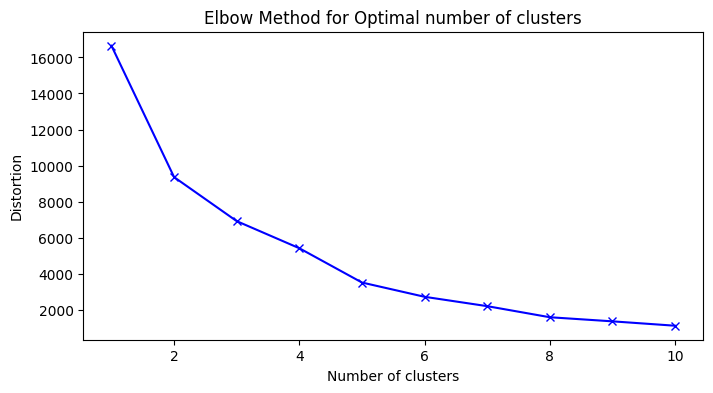

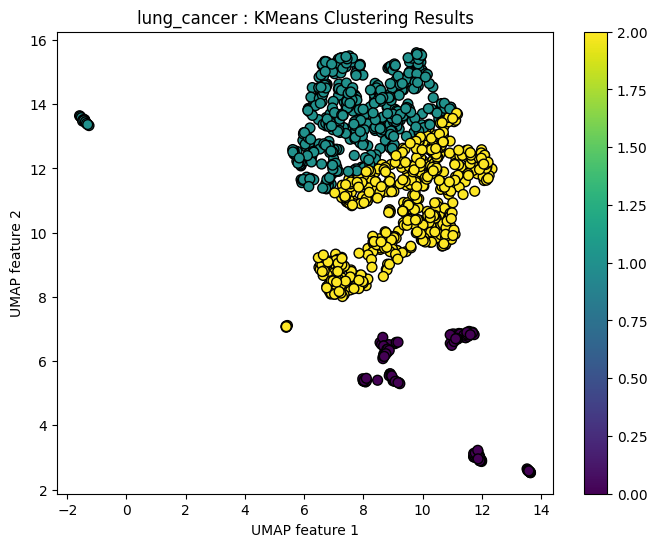

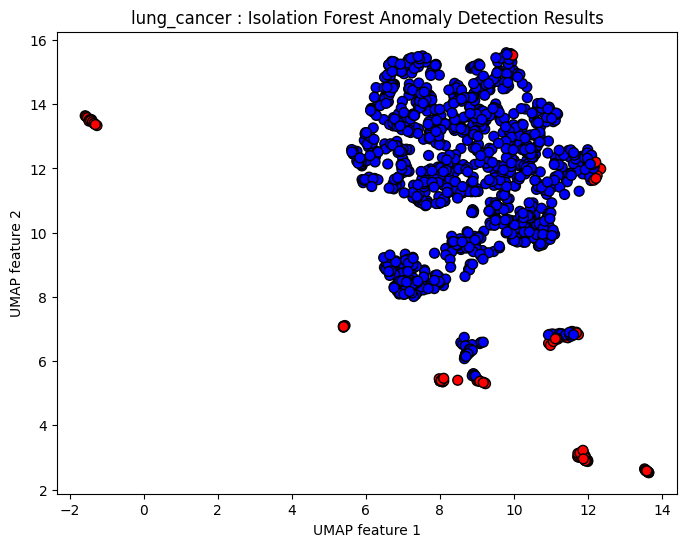

[I 2024-08-17 19:47:19,054] A new study created in memory with name: no-name-b6394e1a-b6f8-499a-8eec-f3c21b0974bf
[I 2024-08-17 19:47:19,685] Trial 0 finished with value: -106.32300122989419 and parameters: {'n_estimators': 66, 'max_depth': 7}. Best is trial 0 with value: -106.32300122989419.
[I 2024-08-17 19:47:20,945] Trial 1 finished with value: -108.4361249246214 and parameters: {'n_estimators': 76, 'max_depth': 26}. Best is trial 1 with value: -108.4361249246214.
[I 2024-08-17 19:47:22,162] Trial 2 finished with value: -108.83925962578179 and parameters: {'n_estimators': 75, 'max_depth': 18}. Best is trial 2 with value: -108.83925962578179.
[I 2024-08-17 19:47:22,901] Trial 3 finished with value: -108.74922734143776 and parameters: {'n_estimators': 45, 'max_depth': 26}. Best is trial 2 with value: -108.83925962578179.
[I 2024-08-17 19:47:23,098] Trial 4 finished with value: -114.47024880388007 and parameters: {'n_estimators': 12, 'max_depth': 20}. Best is trial 4 with value: -114.

lung_cancer - RandomForestRegressor RMSE: 4.47724224295762
lung_cancer - Ridge RMSE: 9.790586052552019
lung_cancer - Lasso RMSE: 10.523190803081633
lung_cancer - ElasticNet RMSE: 10.523190803081633
lung_cancer - XGBRegressor RMSE: 1.67337169347024


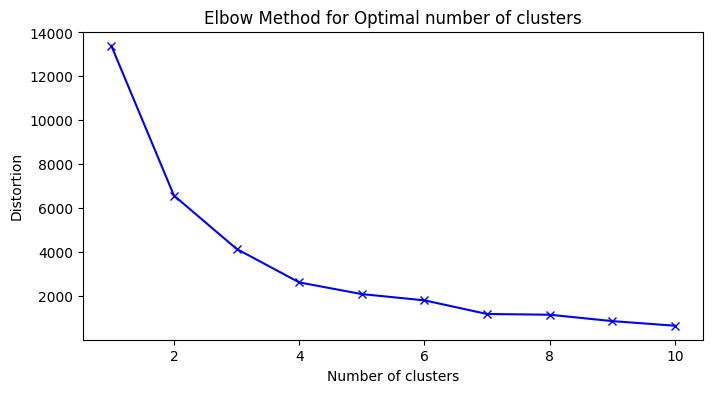

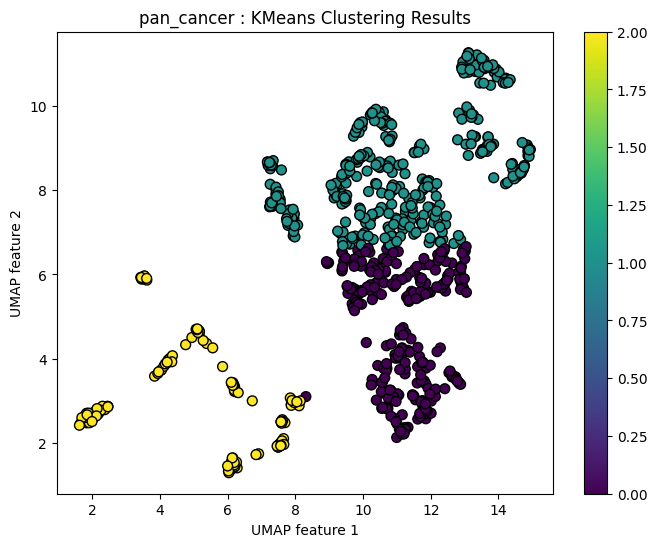

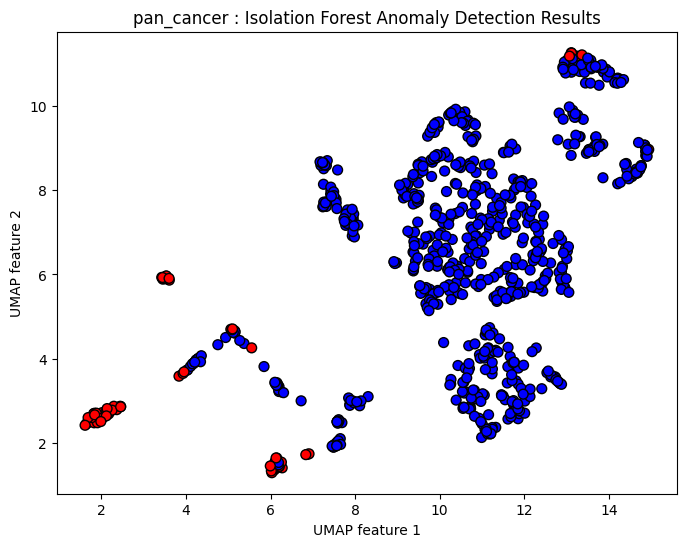

[I 2024-08-17 19:48:34,249] A new study created in memory with name: no-name-de123a43-f771-433d-8b4b-732415988f3b
[I 2024-08-17 19:48:35,075] Trial 0 finished with value: -77.88389398415309 and parameters: {'n_estimators': 79, 'max_depth': 32}. Best is trial 0 with value: -77.88389398415309.
[I 2024-08-17 19:48:36,064] Trial 1 finished with value: -77.64657665006912 and parameters: {'n_estimators': 96, 'max_depth': 27}. Best is trial 0 with value: -77.88389398415309.
[I 2024-08-17 19:48:37,089] Trial 2 finished with value: -77.44337830211381 and parameters: {'n_estimators': 100, 'max_depth': 20}. Best is trial 0 with value: -77.88389398415309.
[I 2024-08-17 19:48:37,382] Trial 3 finished with value: -72.84508463616922 and parameters: {'n_estimators': 75, 'max_depth': 3}. Best is trial 0 with value: -77.88389398415309.
[I 2024-08-17 19:48:37,796] Trial 4 finished with value: -78.72026696560786 and parameters: {'n_estimators': 40, 'max_depth': 23}. Best is trial 4 with value: -78.7202669

pan_cancer - RandomForestRegressor RMSE: 3.667215841628484
pan_cancer - Ridge RMSE: 8.129016878163776
pan_cancer - Lasso RMSE: 8.777387722477973
pan_cancer - ElasticNet RMSE: 8.777387722477973
pan_cancer - XGBRegressor RMSE: 1.026605140247781


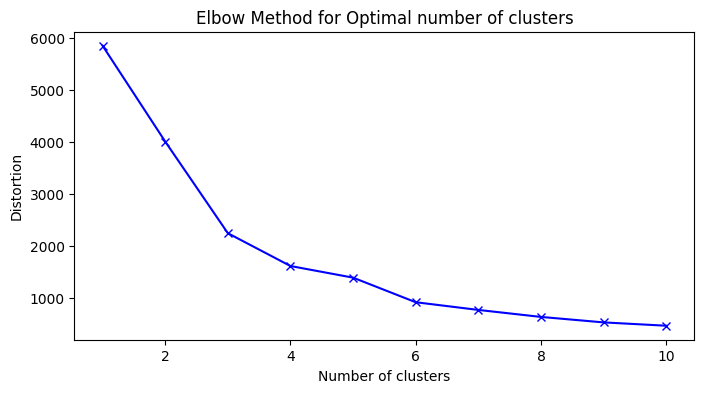

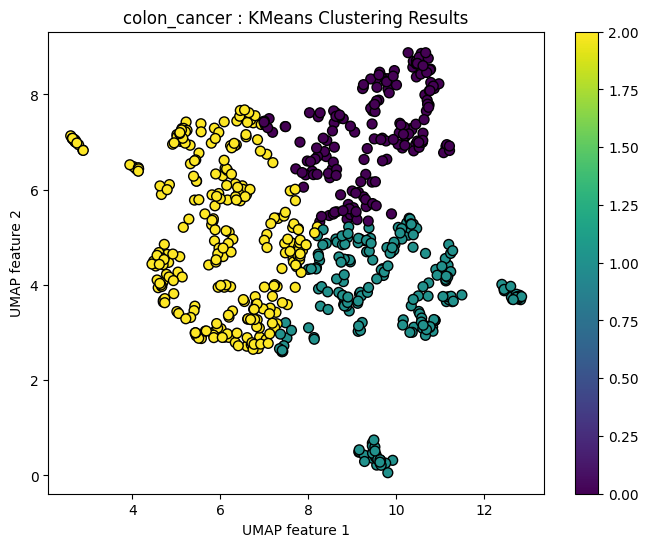

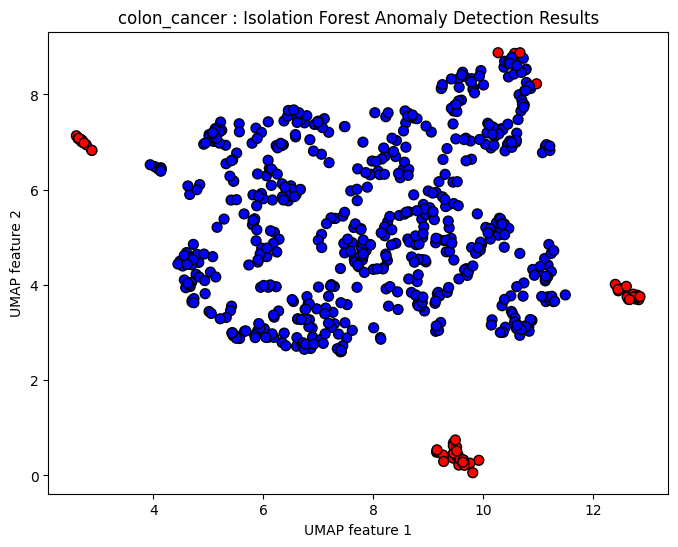

[I 2024-08-17 19:49:24,369] A new study created in memory with name: no-name-b78c1fe9-cda0-486e-ae52-417043103fda
[I 2024-08-17 19:49:24,848] Trial 0 finished with value: -112.5801374385279 and parameters: {'n_estimators': 100, 'max_depth': 5}. Best is trial 0 with value: -112.5801374385279.
[I 2024-08-17 19:49:25,725] Trial 1 finished with value: -116.53484967904282 and parameters: {'n_estimators': 96, 'max_depth': 26}. Best is trial 1 with value: -116.53484967904282.
[I 2024-08-17 19:49:26,393] Trial 2 finished with value: -117.83800280428017 and parameters: {'n_estimators': 74, 'max_depth': 17}. Best is trial 2 with value: -117.83800280428017.
[I 2024-08-17 19:49:27,085] Trial 3 finished with value: -117.73573464911779 and parameters: {'n_estimators': 76, 'max_depth': 20}. Best is trial 2 with value: -117.83800280428017.
[I 2024-08-17 19:49:27,292] Trial 4 finished with value: -120.93859517690552 and parameters: {'n_estimators': 22, 'max_depth': 16}. Best is trial 4 with value: -120

colon_cancer - RandomForestRegressor RMSE: 4.577942244610289
colon_cancer - Ridge RMSE: 10.046566834333913
colon_cancer - Lasso RMSE: 11.166785910329859
colon_cancer - ElasticNet RMSE: 11.166785910329859
colon_cancer - XGBRegressor RMSE: 1.067681402246787


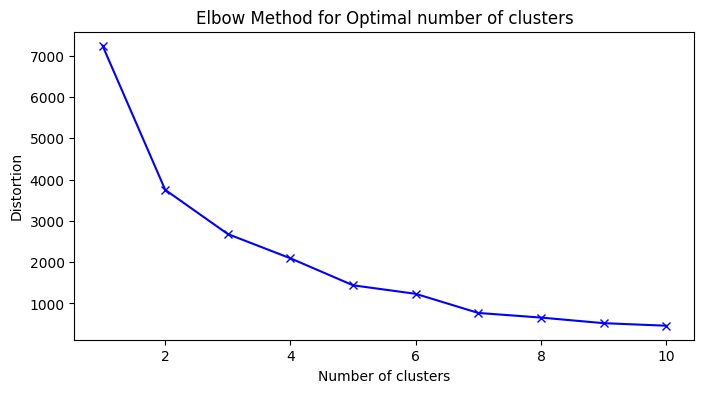

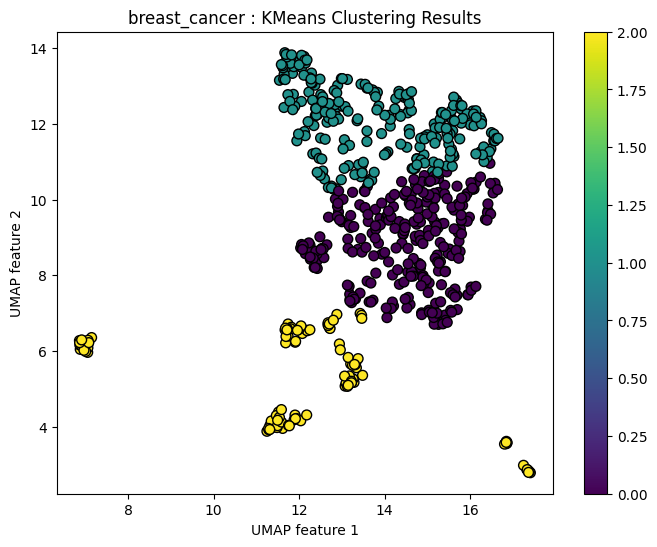

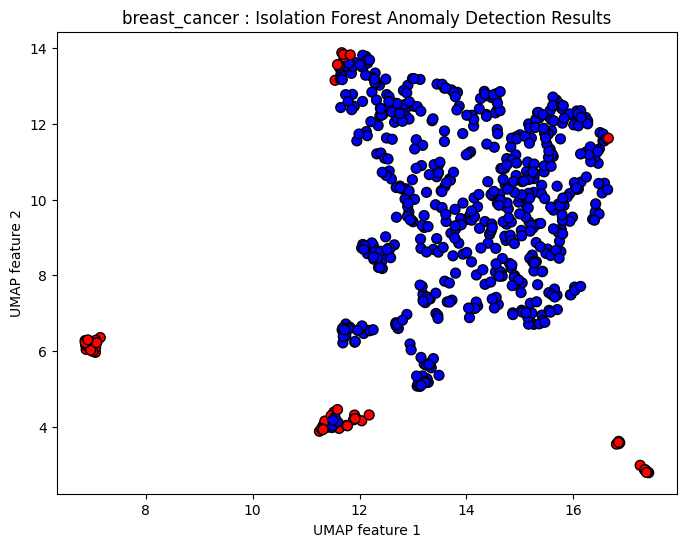

[I 2024-08-17 19:50:18,777] A new study created in memory with name: no-name-a5a28d5f-dccc-4cbb-82a9-d5095e233c2a
[I 2024-08-17 19:50:19,057] Trial 0 finished with value: -207.7451074825422 and parameters: {'n_estimators': 59, 'max_depth': 5}. Best is trial 0 with value: -207.7451074825422.
[I 2024-08-17 19:50:19,371] Trial 1 finished with value: -214.43427817411447 and parameters: {'n_estimators': 40, 'max_depth': 11}. Best is trial 1 with value: -214.43427817411447.
[I 2024-08-17 19:50:20,182] Trial 2 finished with value: -214.47266243113378 and parameters: {'n_estimators': 92, 'max_depth': 22}. Best is trial 2 with value: -214.47266243113378.
[I 2024-08-17 19:50:20,502] Trial 3 finished with value: -217.86084966171134 and parameters: {'n_estimators': 36, 'max_depth': 30}. Best is trial 3 with value: -217.86084966171134.
[I 2024-08-17 19:50:21,151] Trial 4 finished with value: -213.36196023701868 and parameters: {'n_estimators': 79, 'max_depth': 13}. Best is trial 3 with value: -217.

breast_cancer - RandomForestRegressor RMSE: 6.365025439812662
breast_cancer - Ridge RMSE: 13.594250246097861
breast_cancer - Lasso RMSE: 13.594255302622377
breast_cancer - ElasticNet RMSE: 13.594256098943024
breast_cancer - XGBRegressor RMSE: 2.617713547692515


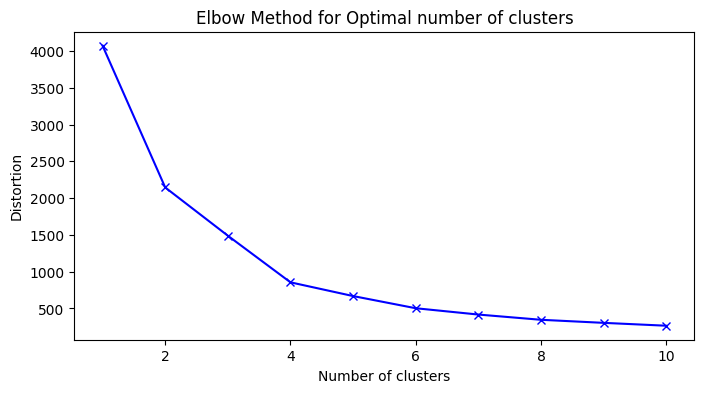

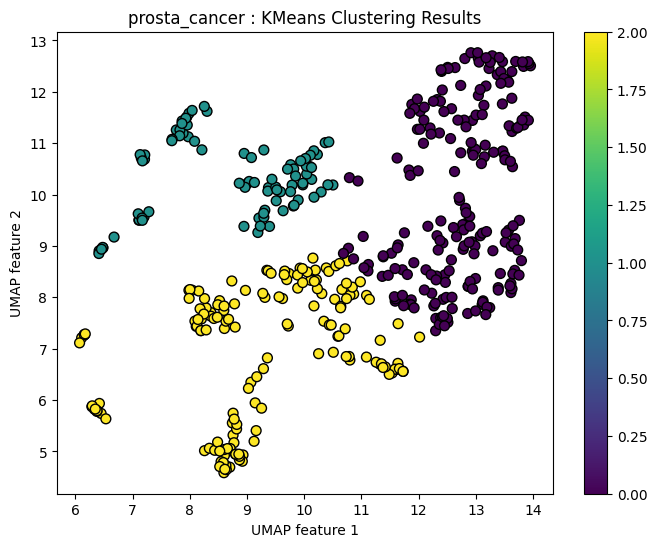

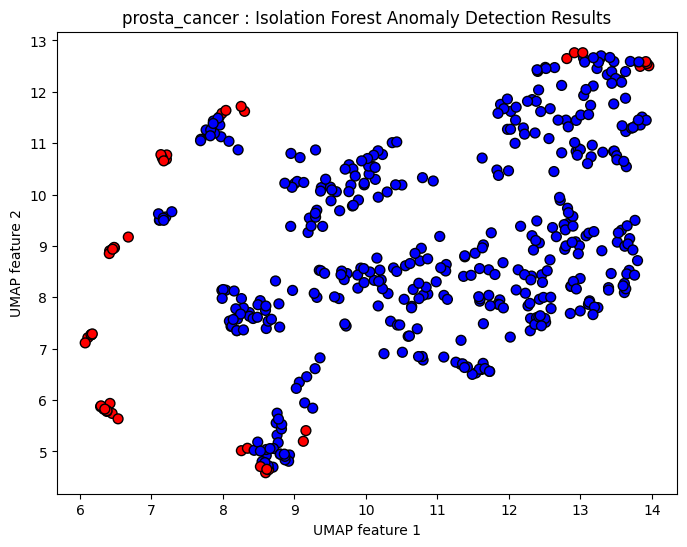

[I 2024-08-17 19:51:17,751] A new study created in memory with name: no-name-4769b812-fa22-4383-a2b4-e1614598bdf6
[I 2024-08-17 19:51:18,093] Trial 0 finished with value: -182.03398228780608 and parameters: {'n_estimators': 52, 'max_depth': 18}. Best is trial 0 with value: -182.03398228780608.
[I 2024-08-17 19:51:18,421] Trial 1 finished with value: -170.73107776044134 and parameters: {'n_estimators': 88, 'max_depth': 5}. Best is trial 0 with value: -182.03398228780608.
[I 2024-08-17 19:51:18,607] Trial 2 finished with value: -183.77111969196676 and parameters: {'n_estimators': 29, 'max_depth': 18}. Best is trial 2 with value: -183.77111969196676.
[I 2024-08-17 19:51:18,735] Trial 3 finished with value: -167.07197846775173 and parameters: {'n_estimators': 50, 'max_depth': 2}. Best is trial 2 with value: -183.77111969196676.
[I 2024-08-17 19:51:18,976] Trial 4 finished with value: -182.3564625979788 and parameters: {'n_estimators': 39, 'max_depth': 13}. Best is trial 2 with value: -183.

prosta_cancer - RandomForestRegressor RMSE: 5.75216099564941
prosta_cancer - Ridge RMSE: 12.047048342232523
prosta_cancer - Lasso RMSE: 12.04706117243749
prosta_cancer - ElasticNet RMSE: 12.04726977210893
prosta_cancer - XGBRegressor RMSE: 0.9058975399909859


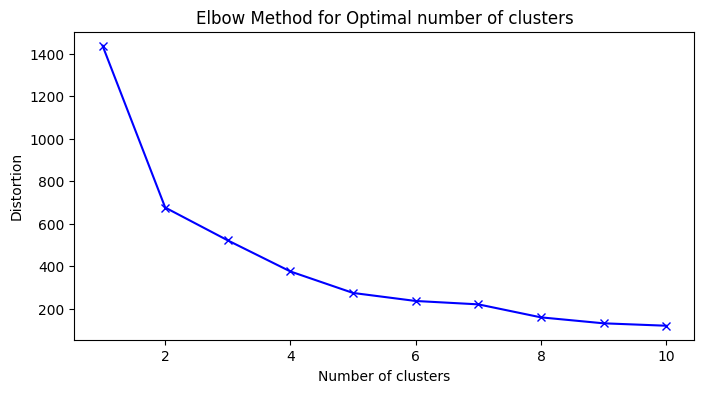

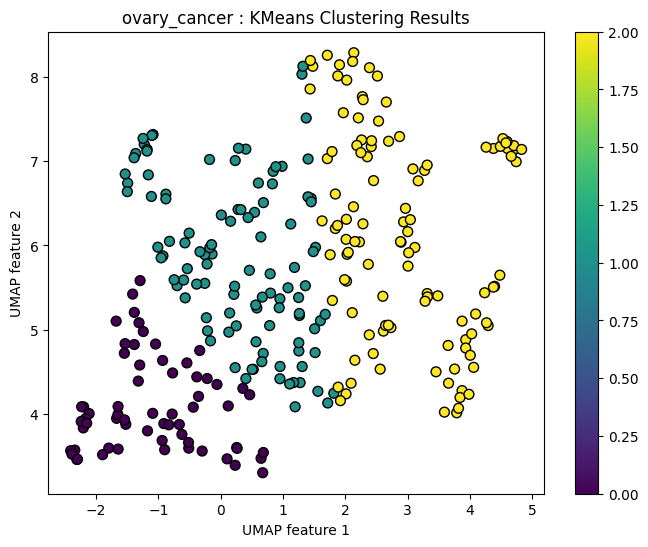

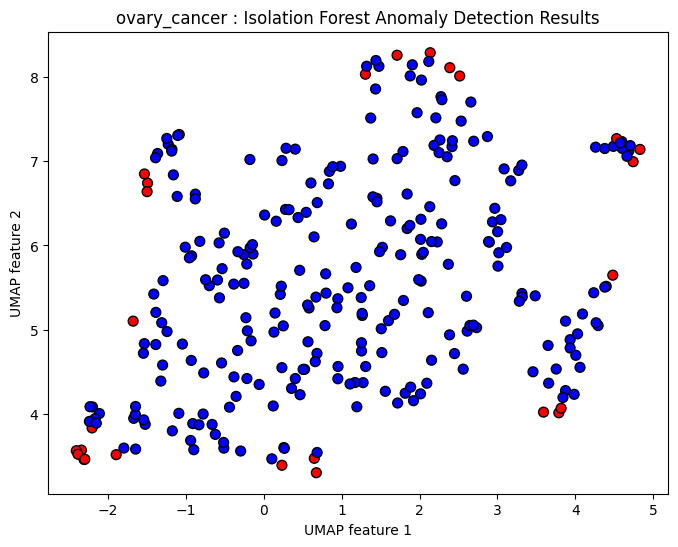

[I 2024-08-17 19:52:17,440] A new study created in memory with name: no-name-0ad9f0a2-5b75-4cfc-b7bc-7cbae8f7ff94
[I 2024-08-17 19:52:17,630] Trial 0 finished with value: -55.271855135575834 and parameters: {'n_estimators': 42, 'max_depth': 14}. Best is trial 0 with value: -55.271855135575834.
[I 2024-08-17 19:52:17,868] Trial 1 finished with value: -55.32828582022458 and parameters: {'n_estimators': 53, 'max_depth': 13}. Best is trial 1 with value: -55.32828582022458.
[I 2024-08-17 19:52:18,288] Trial 2 finished with value: -54.72645665726366 and parameters: {'n_estimators': 98, 'max_depth': 21}. Best is trial 1 with value: -55.32828582022458.
[I 2024-08-17 19:52:18,458] Trial 3 finished with value: -54.82327322454451 and parameters: {'n_estimators': 39, 'max_depth': 24}. Best is trial 1 with value: -55.32828582022458.
[I 2024-08-17 19:52:18,729] Trial 4 finished with value: -53.04757545858483 and parameters: {'n_estimators': 91, 'max_depth': 5}. Best is trial 1 with value: -55.328285

ovary_cancer - RandomForestRegressor RMSE: 3.176415826385841
ovary_cancer - Ridge RMSE: 6.723895643937567
ovary_cancer - Lasso RMSE: 6.723912605109525
ovary_cancer - ElasticNet RMSE: 6.723923585835594
ovary_cancer - XGBRegressor RMSE: 1.1880556262965714


In [99]:
from sklearn.linear_model import LinearRegression
# がん種ごとのデータセット
datasets = {
    'lung_cancer': {'X': lung_X, 'y': lung_y, "z": lun},
    'pan_cancer': {'X': pan_X, 'y': pan_y, "z": pan},
    'colon_cancer': {'X': colon_X, 'y': colon_y, "z": colon},
    'breast_cancer': {'X': breast_X, 'y': breast_y, "z": breast},
    'prosta_cancer': {'X': prosta_X, 'y': prosta_y, "z": prosta},
    'ovary_cancer': {'X': ovary_X, 'y': ovary_y, "z": ovary}
}

# モデル名のリスト
models = ['RandomForestRegressor', 'Ridge', 'Lasso', 'ElasticNet', 'XGBRegressor']

# エルボーメソッドによるクラスタリング数の決定
def plot_elbow_method(X, max_clusters=10):
    distortions = []
    K = range(1, max_clusters + 1)
    for k in K:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)

    plt.figure(figsize=(8, 4))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.title('Elbow Method for Optimal number of clusters')
    plt.show()

# クラスタリング結果の可視化
def plot_clusters(embedding, labels, title='Clustering results'):
    plt.figure(figsize=(8, 6))
    plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', marker='o', s=50, edgecolor='k')
    plt.title(title)
    plt.xlabel('UMAP feature 1')
    plt.ylabel('UMAP feature 2')
    plt.colorbar()
    plt.show()

# 異常検知結果の可視化
def plot_anomaly_detection(embedding, anomaly_scores, title='Anomaly Detection Results'):
    plt.figure(figsize=(8, 6))
    # 異常スコアに基づいて色を設定
    # -1: 異常 (赤), 1: 正常 (青)
    colors = np.where(anomaly_scores == -1, 'red', 'blue')
    plt.scatter(embedding[:, 0], embedding[:, 1], c=colors, marker='o', s=50, edgecolor='k')
    plt.title(title)
    plt.xlabel('UMAP feature 1')
    plt.ylabel('UMAP feature 2')
    plt.show()

# 各がん種ごとにハイパーパラメータチューニングとモデルの訓練を行う
results = {}
for cancer_type, data in datasets.items():
    X = data['X']
    y = data['y']
    z = data['z']

    # データフレームに変換
    df = pd.DataFrame(X, columns=[f"col{i+1}" for i in range(X.shape[1])])
    df['y'] = y.values


    # PCAによる次元削減
    pca = PCA(n_components=20, random_state=42)
    pca_results = pca.fit_transform(X)

    # UMAPによる次元削減
    reducer = umap.UMAP(n_components=2, random_state=42)
    umap_results = reducer.fit_transform(pca_results)
    df['umap_1'] = umap_results[:, 0]
    df['umap_2'] = umap_results[:, 1]

    # エルボーメソッドのプロット
    plot_elbow_method(umap_results)

    # KMeansクラスタリング
    kmeans = KMeans(n_clusters=3, random_state=42)
    kmeans_labels = kmeans.fit_predict(umap_results)
    df['kmeans_cluster'] = kmeans_labels

    # クラスタリング結果のプロット
    plot_clusters(umap_results, kmeans_labels, title=f'{cancer_type} : KMeans Clustering Results')

    # Isolation Forestによる異常検知
    iso_forest = IsolationForest(contamination=0.1, random_state=42)
    iso_scores = iso_forest.fit_predict(umap_results)
    df['anomaly_score'] = iso_scores

    # 異常検知結果のプロット
    plot_anomaly_detection(umap_results, iso_scores, title=f'{cancer_type} : Isolation Forest Anomaly Detection Results')

    # PCA、UMAP、KMeans、Isolation Forestモデルの保存
    joblib.dump(pca, f'{cancer_type}_pca_model.pkl')
    joblib.dump(reducer, f'{cancer_type}_umap_model.pkl')
    joblib.dump(kmeans, f'{cancer_type}_kmeans_model.pkl')
    joblib.dump(iso_forest, f'{cancer_type}_iso_forest_model.pkl')


    # 追加した特徴量を含むデータセット
    X_extended = np.hstack([X, umap_results, kmeans_labels.reshape(-1, 1), iso_scores.reshape(-1, 1)])

    study_dict = {}
    for model_name in models:
        study = optuna.create_study(direction='minimize')
        study.optimize(lambda trial: objective(trial, model_name, X_extended, y), n_trials=50)
        study_dict[model_name] = study

    # 各モデルの最適なパラメータで学習と予測
    predictions = {}
    rmse_box = []
    for model_name, study in study_dict.items():
        best_params = study.best_params
        if model_name == 'RandomForestRegressor':
            model = RandomForestRegressor(**best_params, random_state=42)
        elif model_name == 'Ridge':
            model = Ridge(**best_params, random_state=42)
        elif model_name == 'Lasso':
            model = Lasso(**best_params, random_state=42)
        elif model_name == 'ElasticNet':
            model = ElasticNet(**best_params, random_state=42)
        elif model_name == 'XGBRegressor':
            model = XGBRegressor(**best_params, random_state=42)

        # 特徴量を含むデータセットでモデルを訓練
        model.fit(X_extended, y)
        preds = model.predict(X_extended)
        predictions[model_name] = preds

        # すべてのモデルを保存
        joblib.dump(model, f'{cancer_type}_{model_name.lower()}_model.pkl')

        # モデルの性能評価
        rmse = np.sqrt(mean_squared_error(y, preds))
        print(f'{cancer_type} - {model_name} RMSE: {rmse}')
        rmse_box.append(rmse)

    results[cancer_type] = {
        'study_dict': study_dict,
        'predictions': predictions,
        'RMSE': rmse_box
    }

In [100]:
# 結果を格納するためのリスト
results_list = []

# results辞書をループしてデータを収集
for cancer_type, info in results.items():
    for i, model_name in enumerate(models):
        # 各がん種とモデルごとのRMSEを取得
        rmse = info['RMSE'][i]
        # リストに辞書形式で追加
        results_list.append({'Cancer Type': cancer_type, 'Model': model_name, 'RMSE': rmse})

# リストからデータフレームを作成
results_df = pd.DataFrame(results_list)

# 結果のデータフレームを表示
print(results_df)

# オプション: より整理された形で表示するためにピボットテーブルを使用
pivot_df = results_df.pivot(index='Cancer Type', columns='Model', values='RMSE')
print(pivot_df)

      Cancer Type                  Model       RMSE
0     lung_cancer  RandomForestRegressor   4.477242
1     lung_cancer                  Ridge   9.790586
2     lung_cancer                  Lasso  10.523191
3     lung_cancer             ElasticNet  10.523191
4     lung_cancer           XGBRegressor   1.673372
5      pan_cancer  RandomForestRegressor   3.667216
6      pan_cancer                  Ridge   8.129017
7      pan_cancer                  Lasso   8.777388
8      pan_cancer             ElasticNet   8.777388
9      pan_cancer           XGBRegressor   1.026605
10   colon_cancer  RandomForestRegressor   4.577942
11   colon_cancer                  Ridge  10.046567
12   colon_cancer                  Lasso  11.166786
13   colon_cancer             ElasticNet  11.166786
14   colon_cancer           XGBRegressor   1.067681
15  breast_cancer  RandomForestRegressor   6.365025
16  breast_cancer                  Ridge  13.594250
17  breast_cancer                  Lasso  13.594255
18  breast_c

In [101]:
pivot_df

Model,ElasticNet,Lasso,RandomForestRegressor,Ridge,XGBRegressor
Cancer Type,,,,,
breast_cancer,13.594256,13.594255,6.365025,13.594250,2.617714
colon_cancer,11.166786,11.166786,4.577942,10.046567,1.067681
lung_cancer,10.523191,10.523191,4.477242,9.790586,1.673372
ovary_cancer,6.723924,6.723913,3.176416,6.723896,1.188056
pan_cancer,8.777388,8.777388,3.667216,8.129017,1.026605
prosta_cancer,12.047270,12.047061,5.752161,12.047048,0.905898


###残差分析

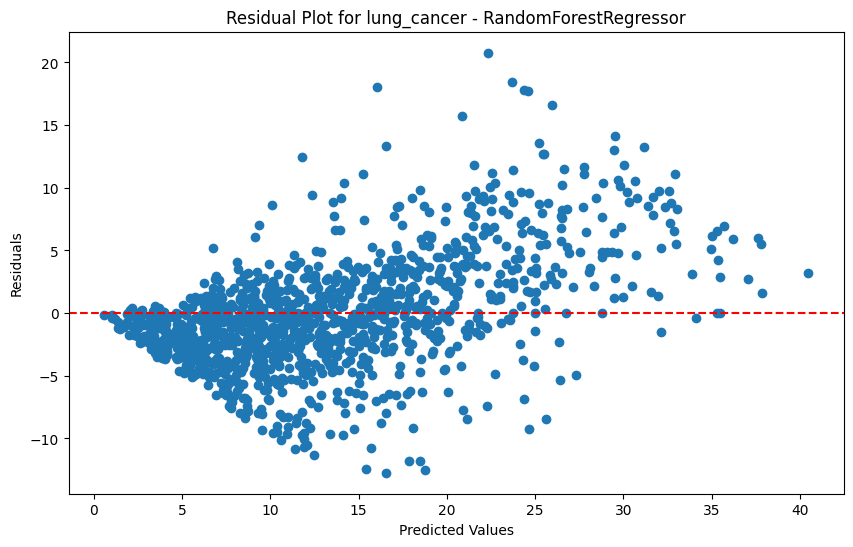

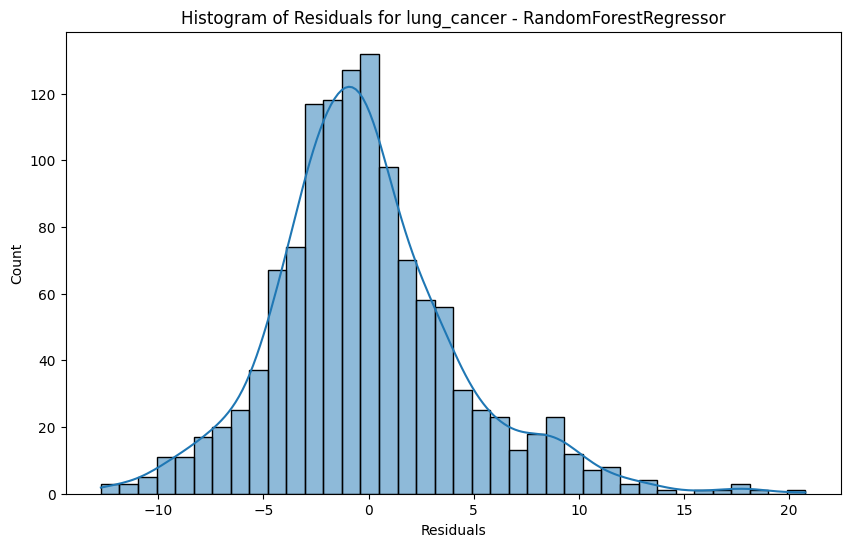

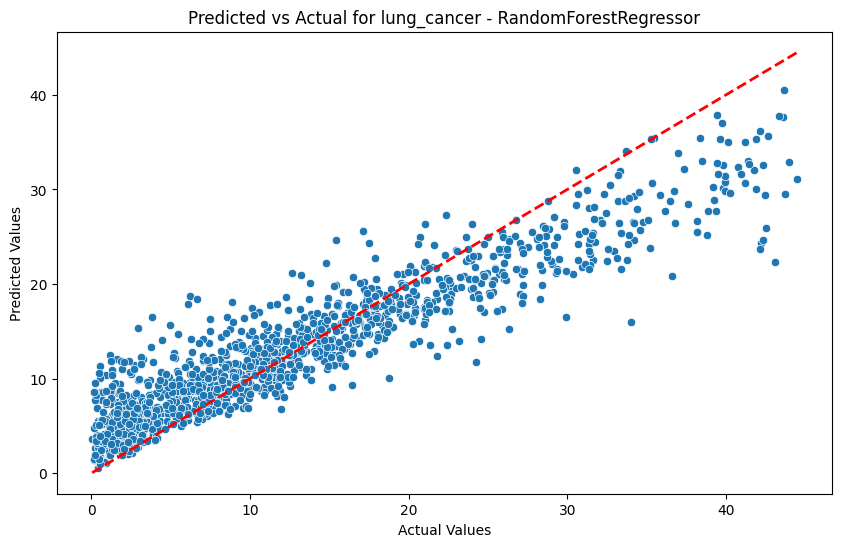

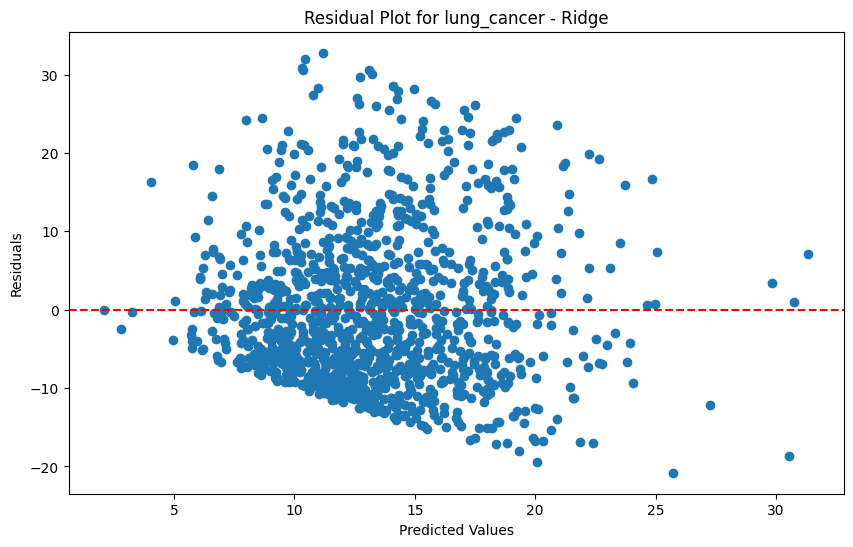

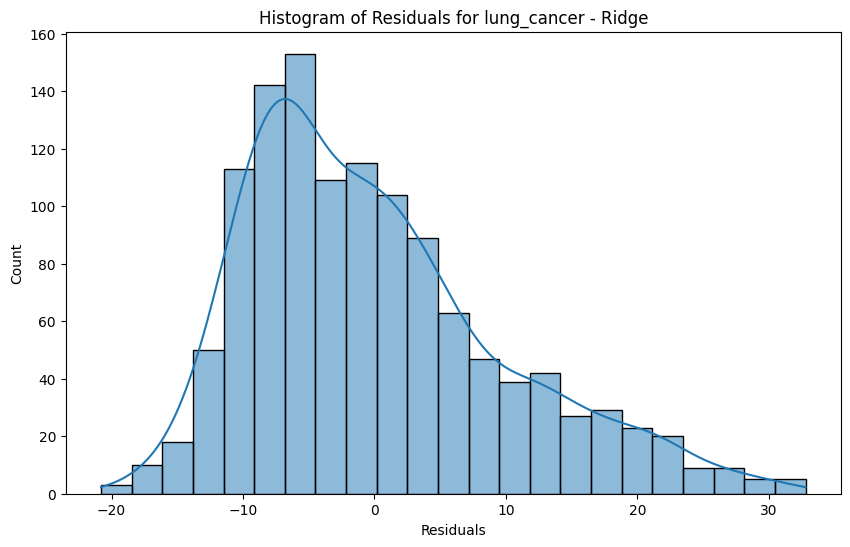

...

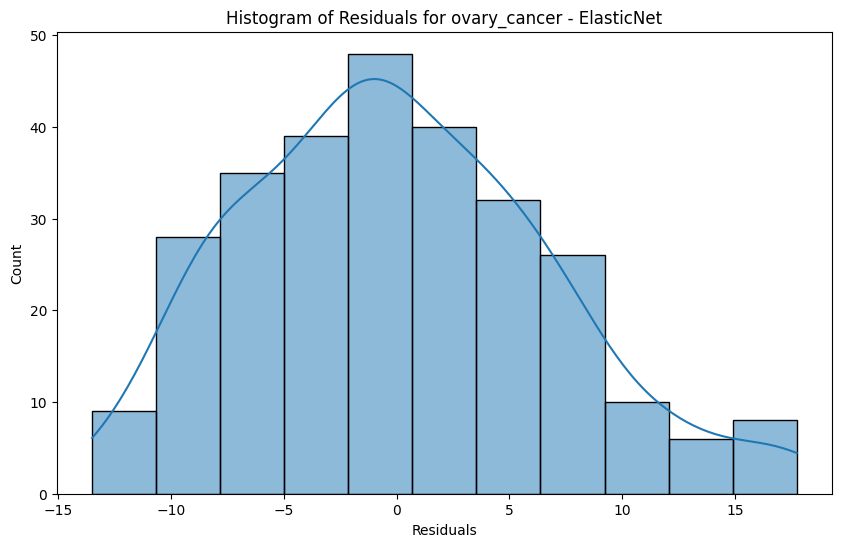

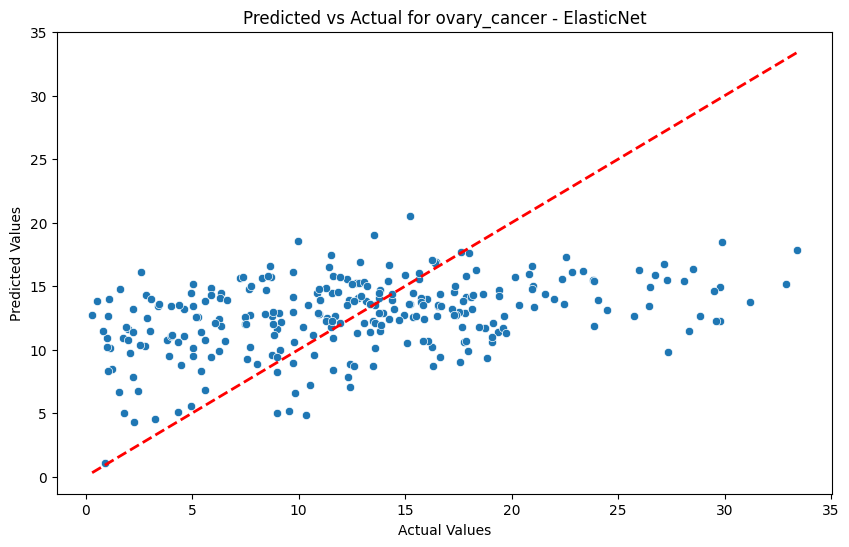

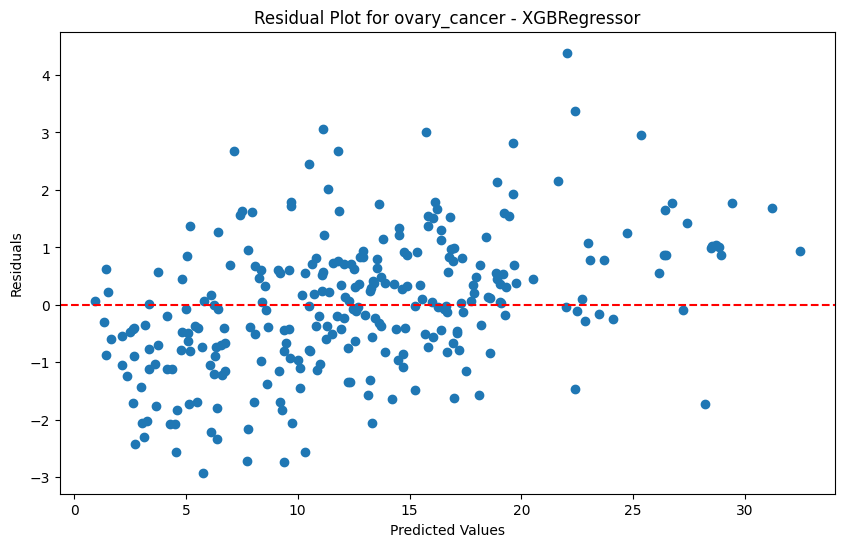

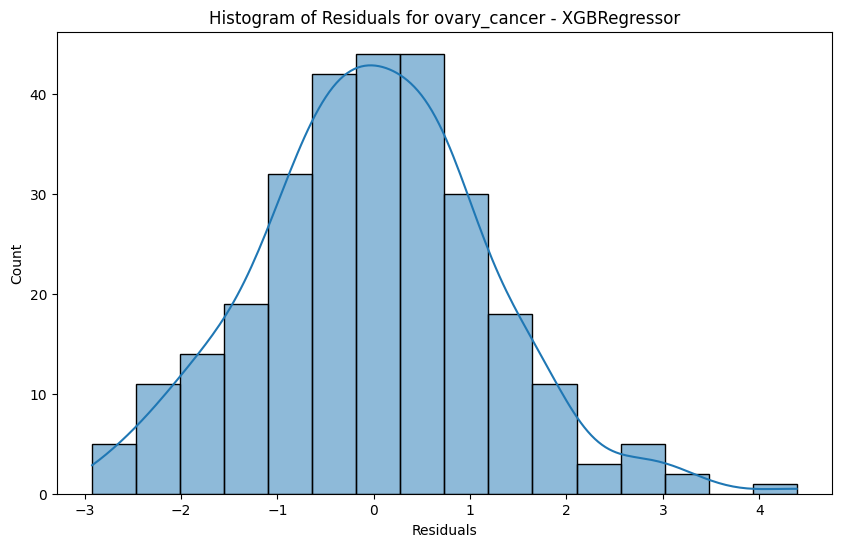

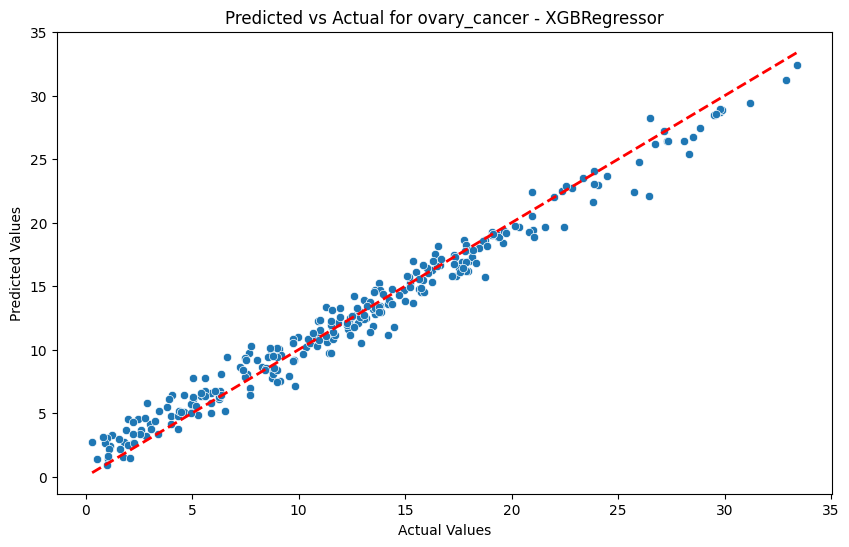

In [102]:
# 残差プロットと予測値vs実測値のプロットを描画する関数
def plot_model_results(results, datasets):
    for cancer_type, result in results.items():
        y_actual = datasets[cancer_type]['y']  # 実測値
        for model_name, preds in result['predictions'].items():
            # 残差の計算
            residuals = y_actual - preds

            # 残差プロット
            plt.figure(figsize=(10, 6))
            plt.scatter(preds, residuals)
            plt.axhline(y=0, color='r', linestyle='--')
            plt.xlabel('Predicted Values')
            plt.ylabel('Residuals')
            plt.title(f'Residual Plot for {cancer_type} - {model_name}')
            plt.show()

            # 残差のヒストグラム
            plt.figure(figsize=(10, 6))
            sns.histplot(residuals, kde=True)
            plt.xlabel('Residuals')
            plt.title(f'Histogram of Residuals for {cancer_type} - {model_name}')
            plt.show()

            # 予測値と実測値の散布図
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=y_actual, y=preds)
            plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
            plt.xlabel('Actual Values')
            plt.ylabel('Predicted Values')
            plt.title(f'Predicted vs Actual for {cancer_type} - {model_name}')
            plt.show()


# resultsとdatasetsを使用してプロットを描画
plot_model_results(results, datasets)

lung_cancer


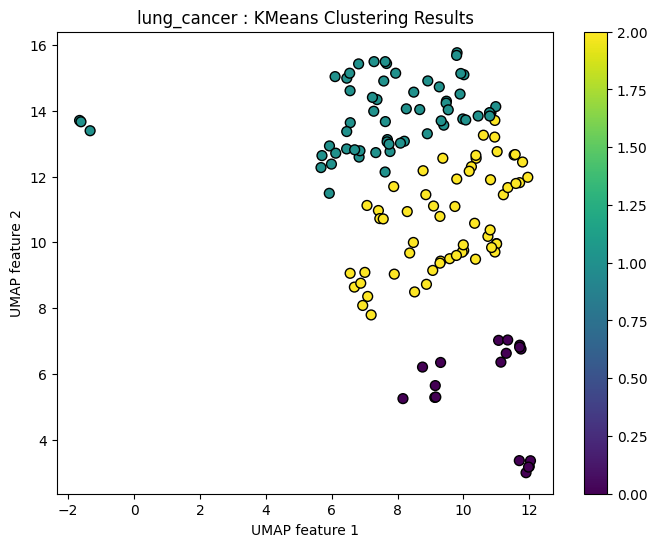

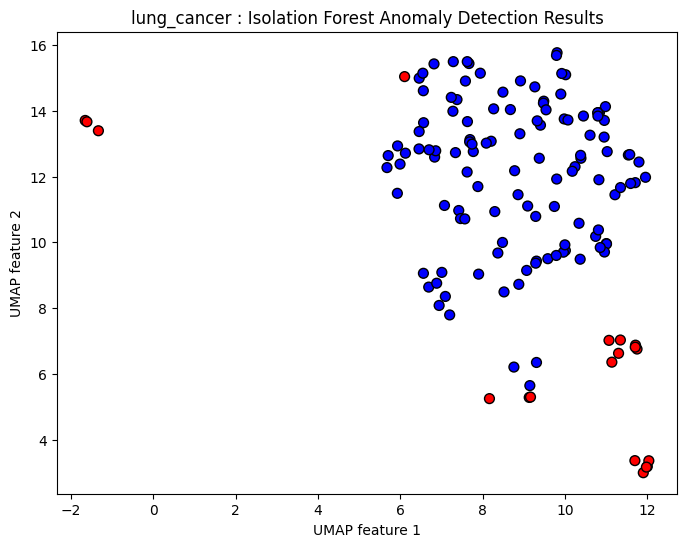

lung_cancer - RandomForestRegressor RMSE: 11.352524923178406
lung_cancer - Ridge RMSE: 10.47741003114126
lung_cancer - Lasso RMSE: 10.809816549912517
lung_cancer - ElasticNet RMSE: 10.809816549912517
lung_cancer - XGBRegressor RMSE: 12.65730387297988


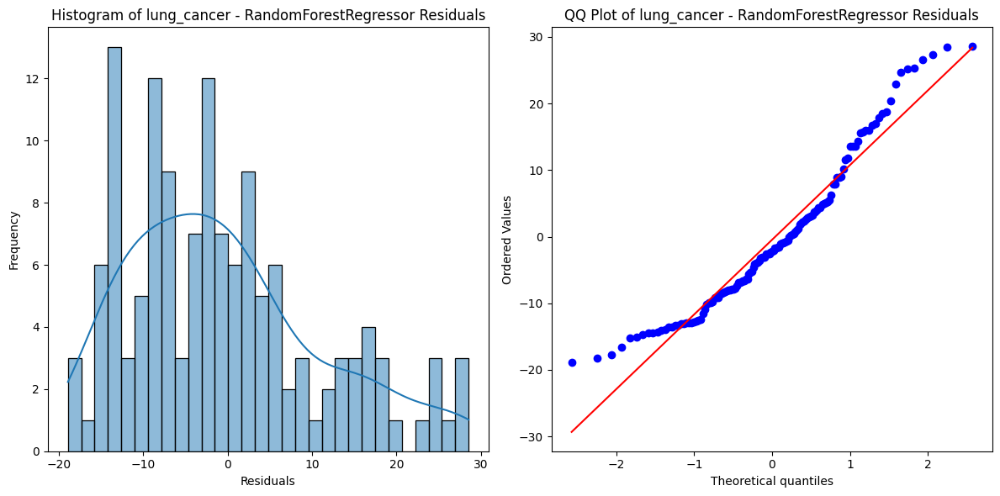

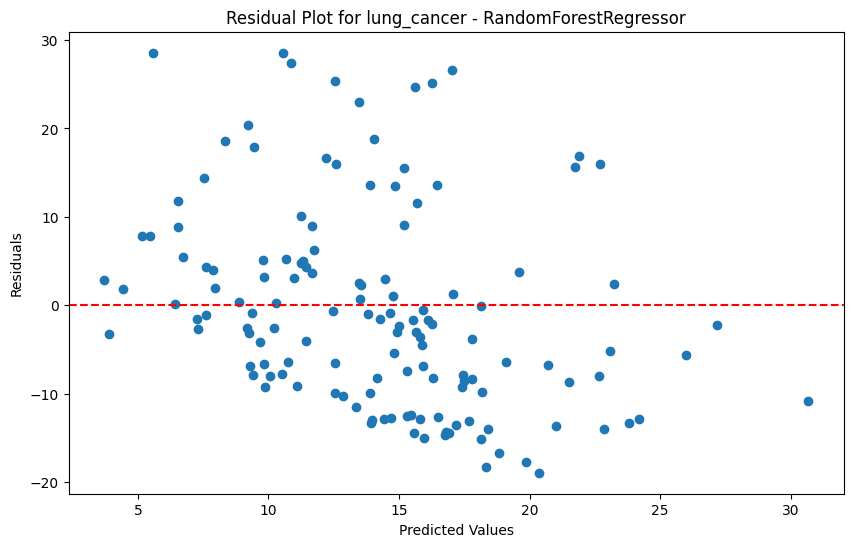

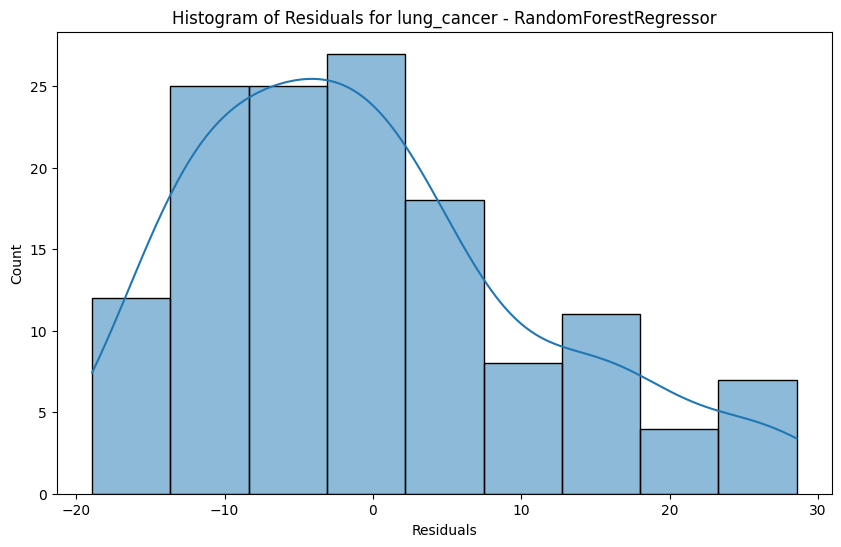

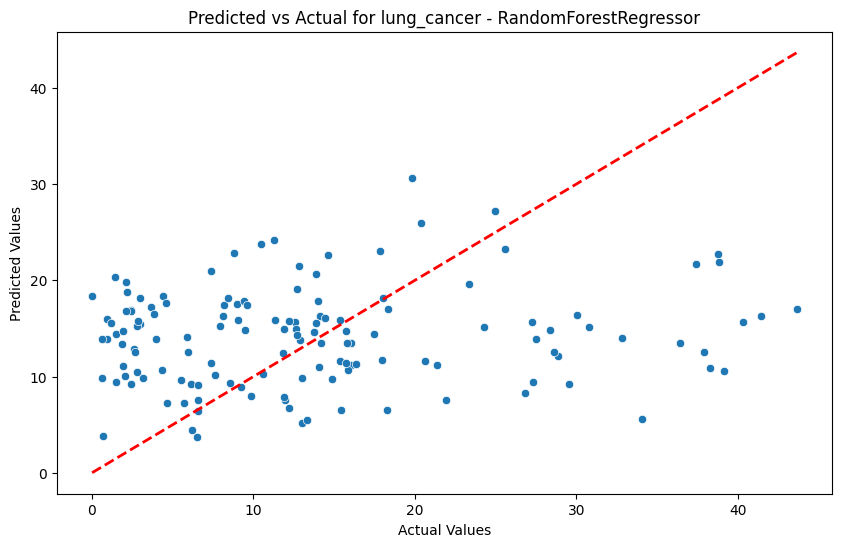

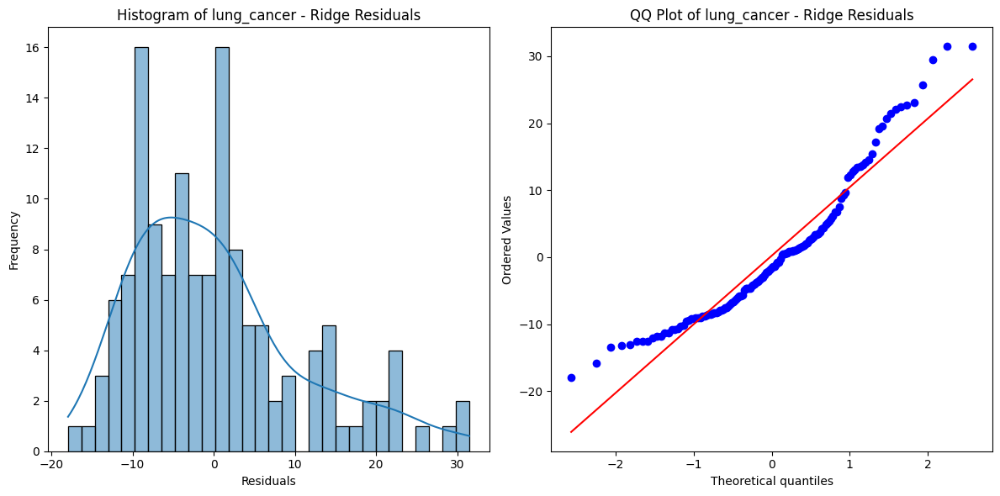

...

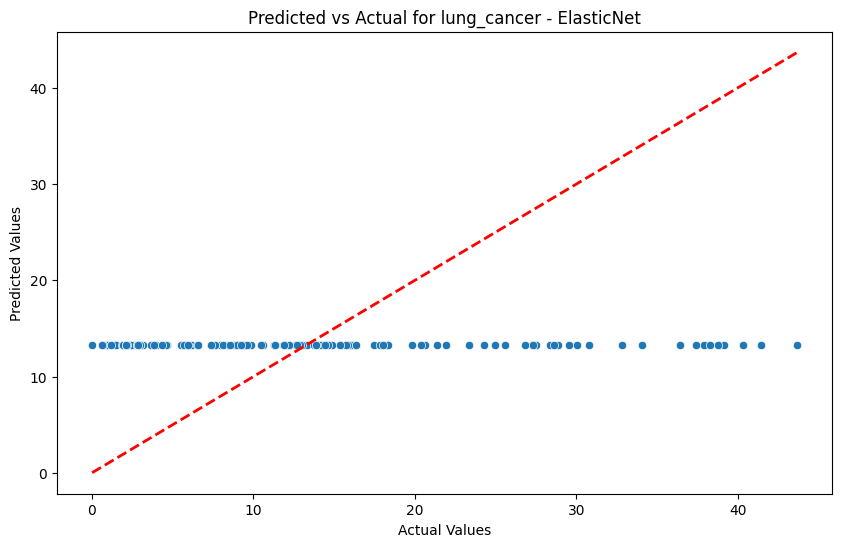

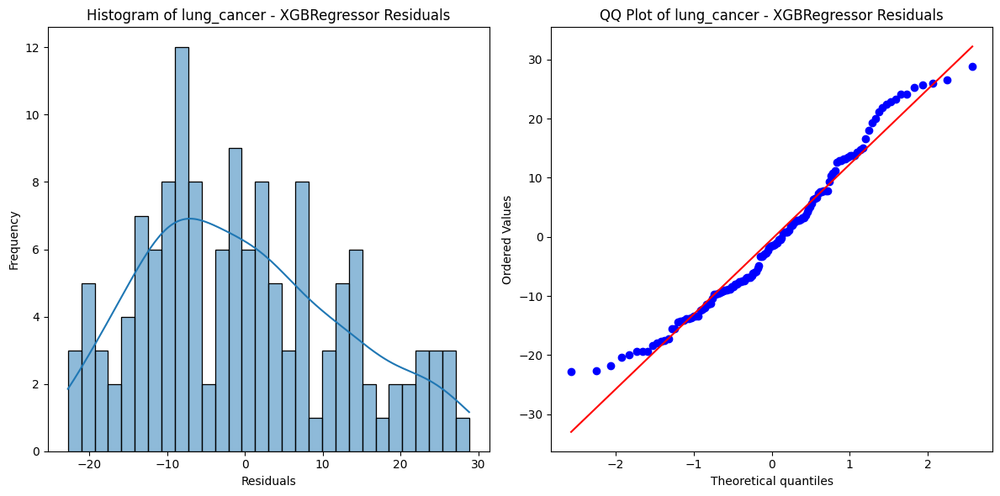

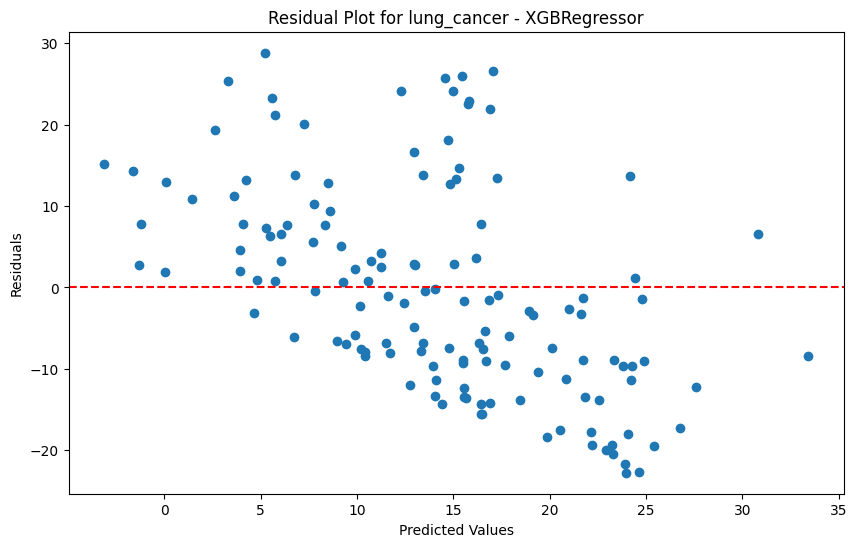

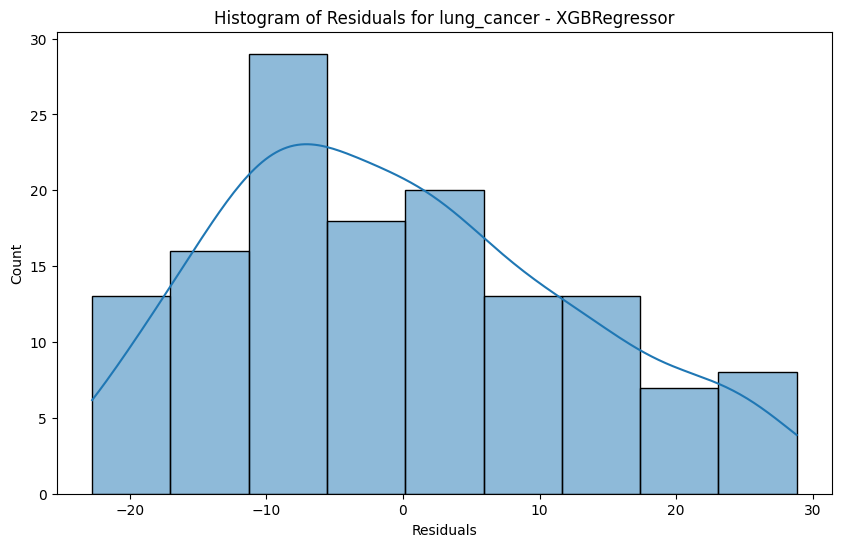

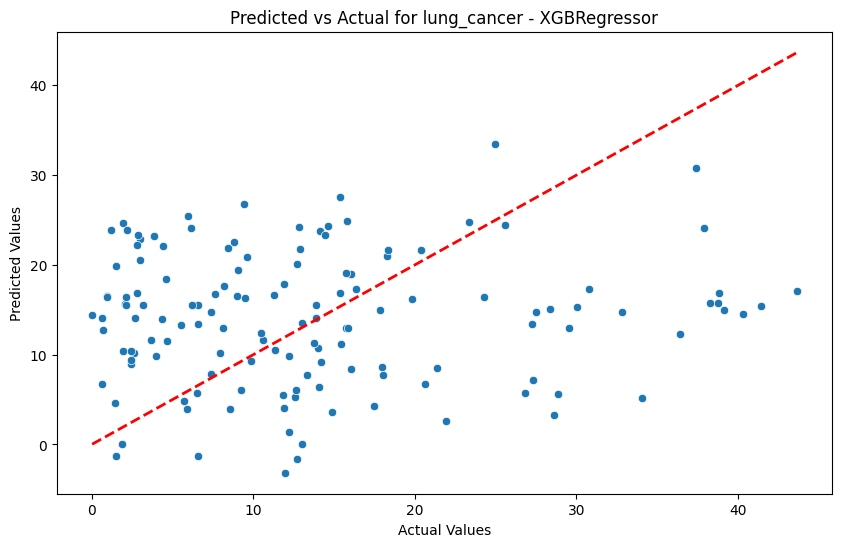

pan_cancer


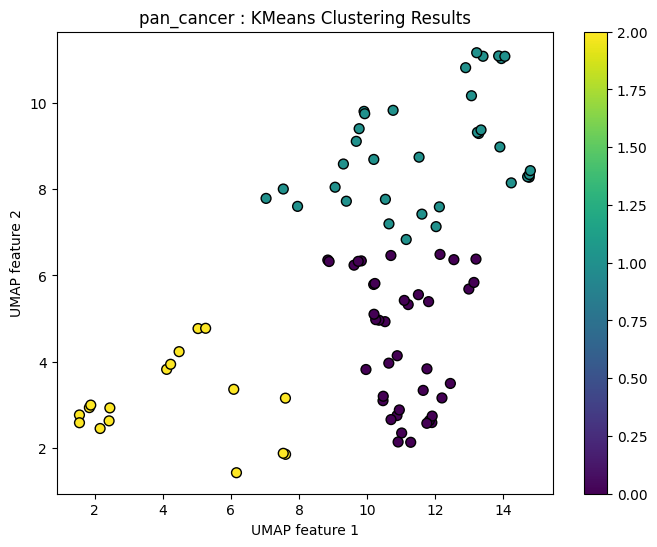

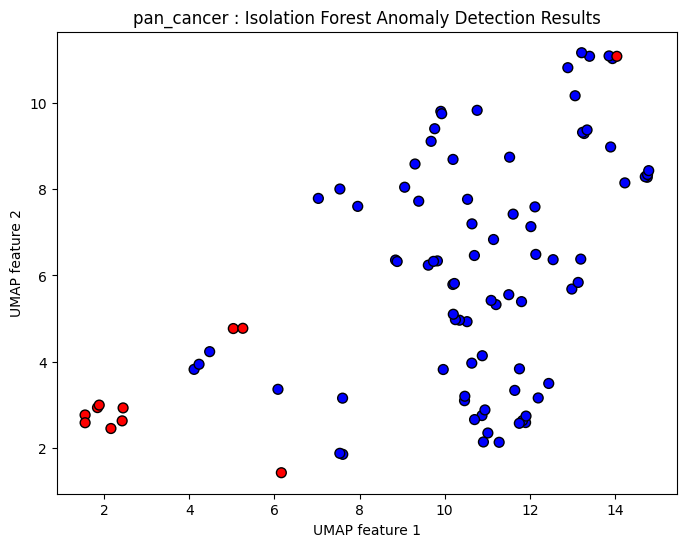

pan_cancer - RandomForestRegressor RMSE: 9.0397787541462
pan_cancer - Ridge RMSE: 9.083871717309266
pan_cancer - Lasso RMSE: 9.272456464100943
pan_cancer - ElasticNet RMSE: 9.272456464100943
pan_cancer - XGBRegressor RMSE: 10.704745888322146


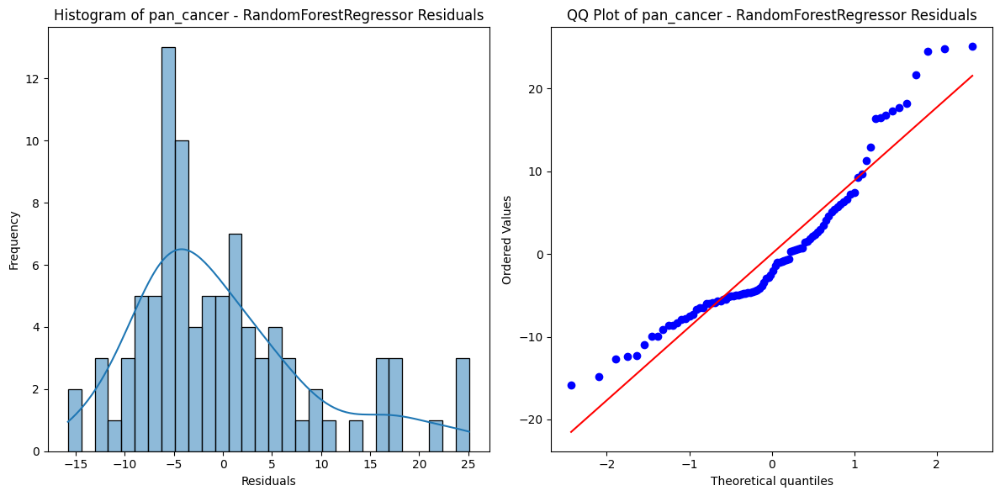

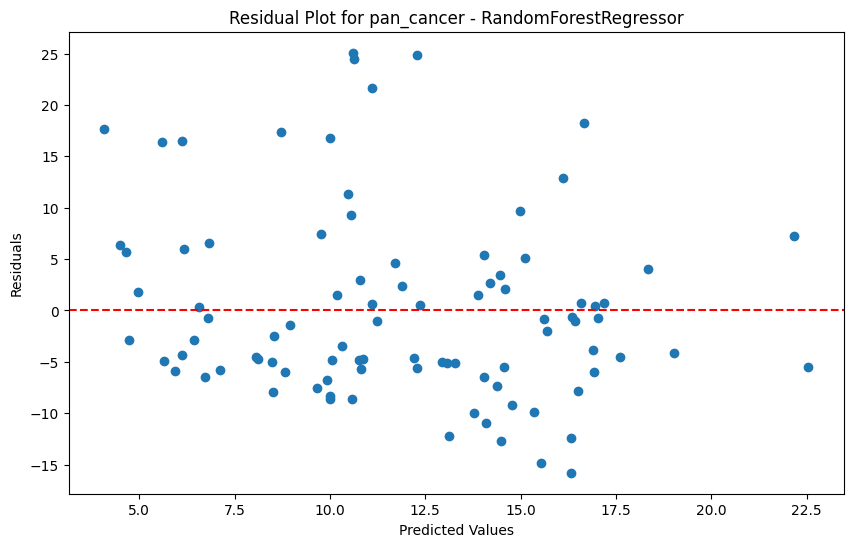

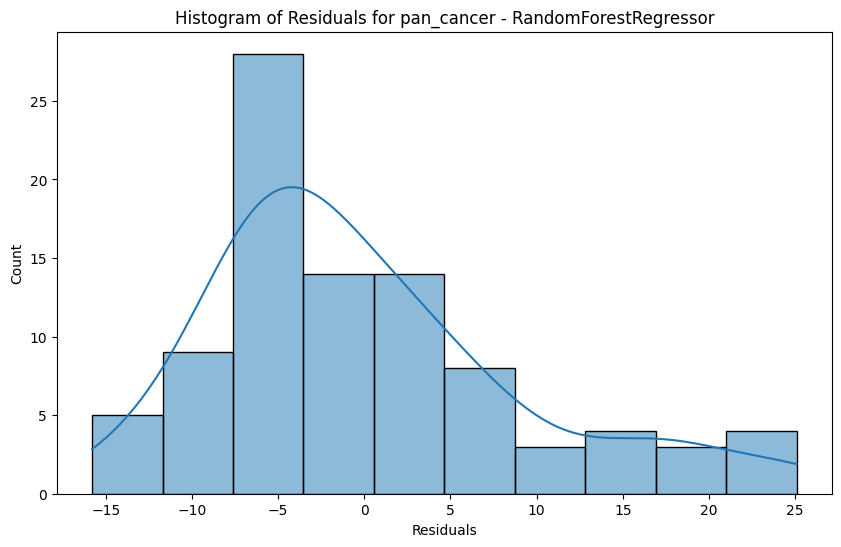

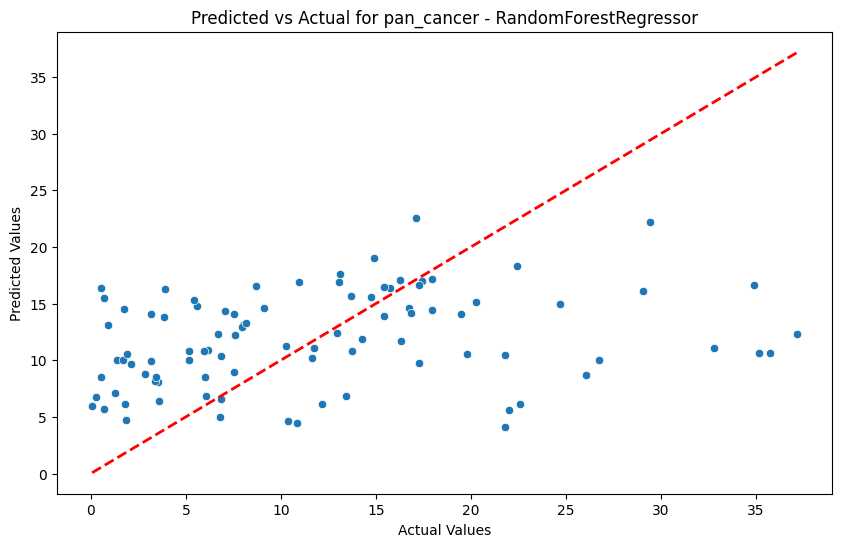

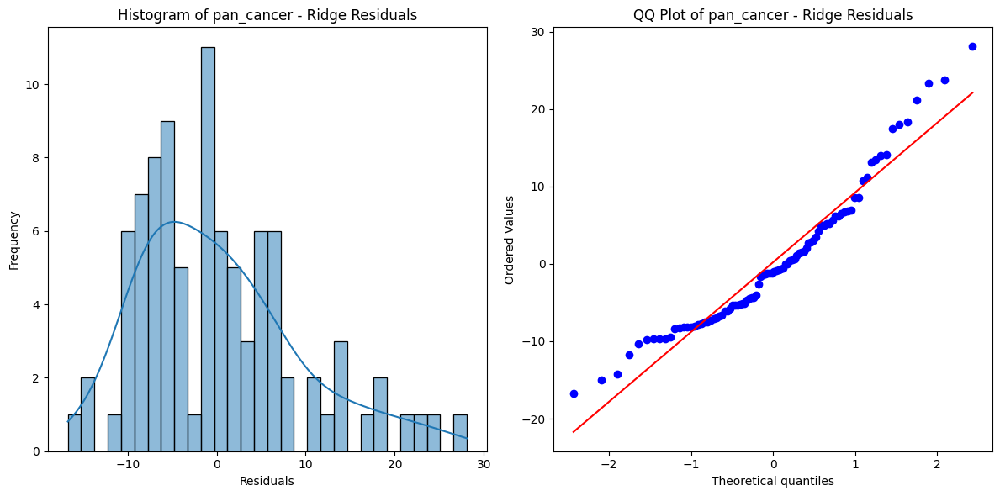

...

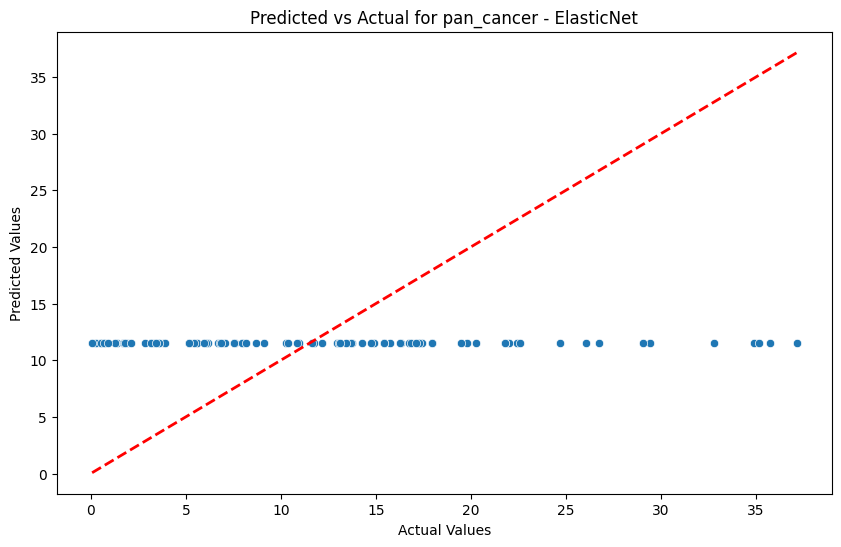

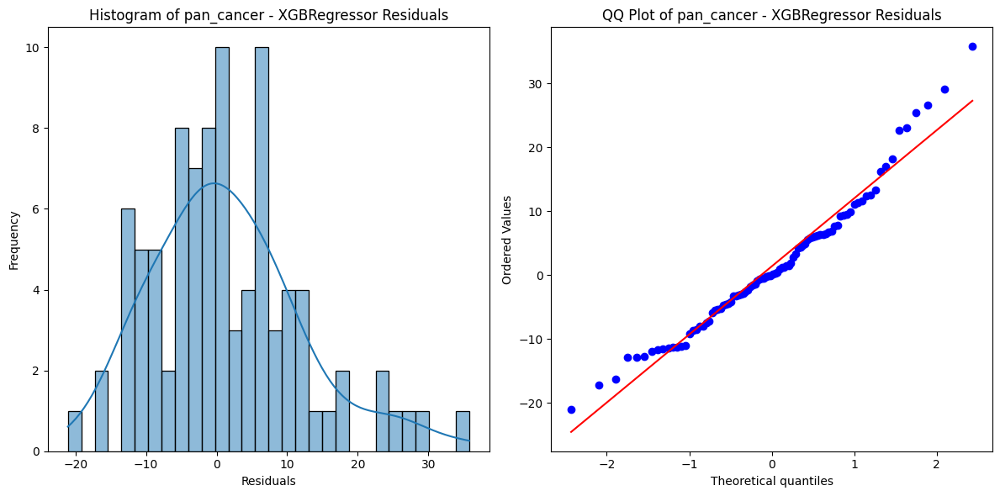

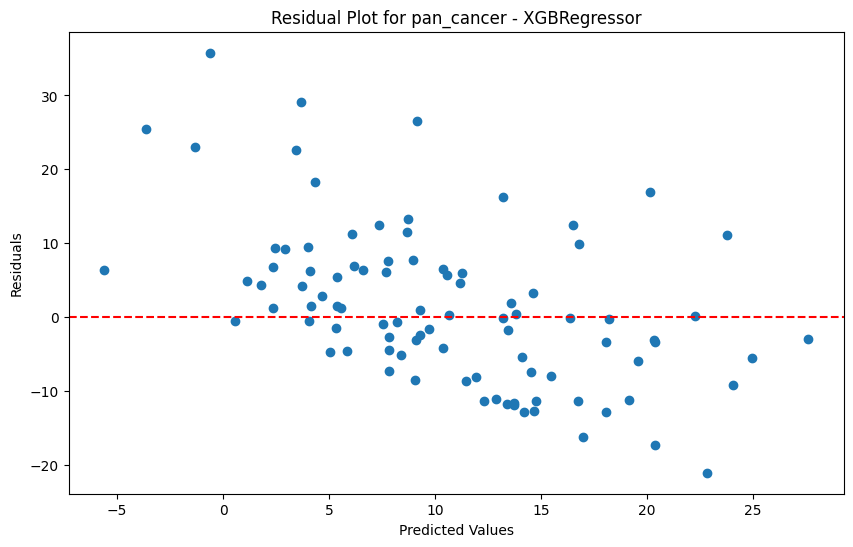

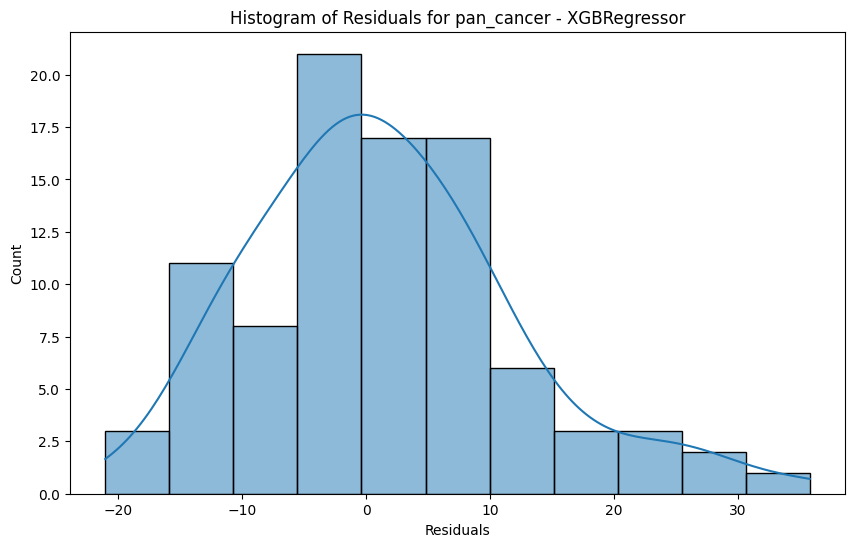

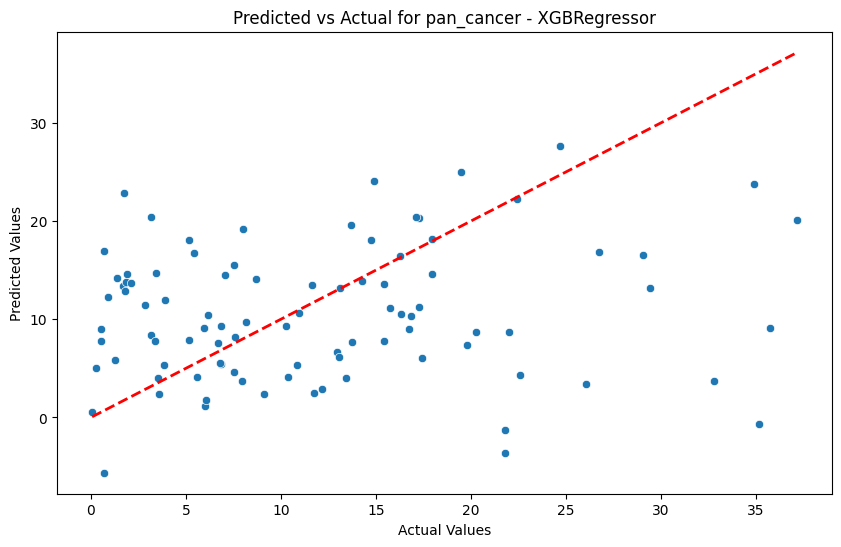

colon_cancer


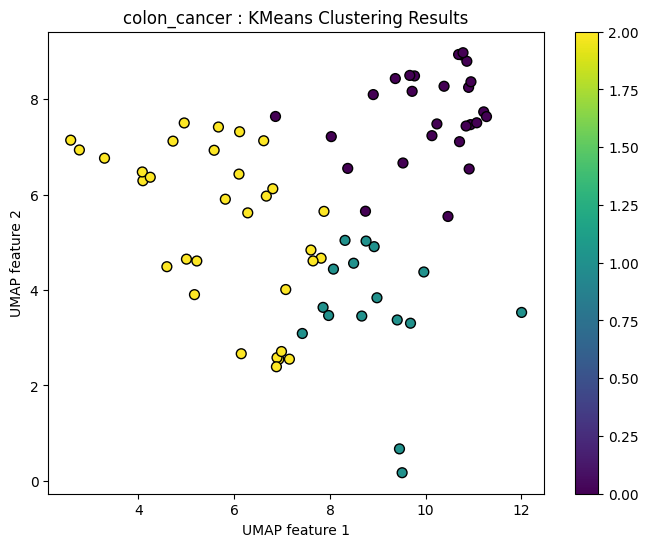

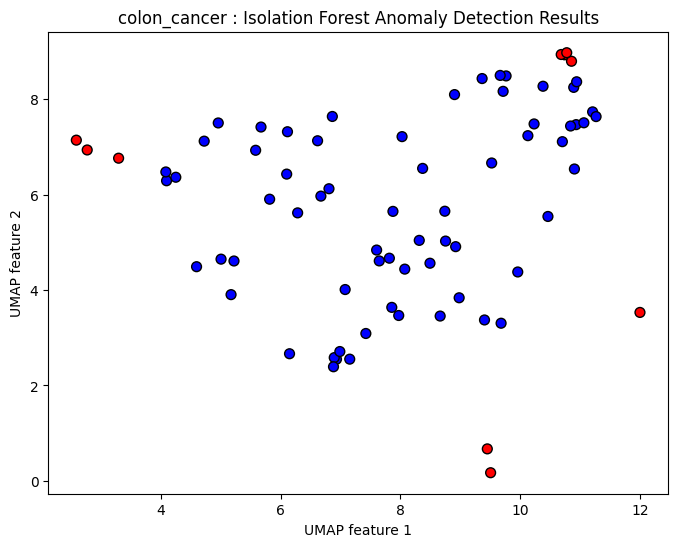

colon_cancer - RandomForestRegressor RMSE: 11.653351705085049
colon_cancer - Ridge RMSE: 10.33952155526685
colon_cancer - Lasso RMSE: 11.324074354595792
colon_cancer - ElasticNet RMSE: 11.324074354595792
colon_cancer - XGBRegressor RMSE: 12.992816252934851


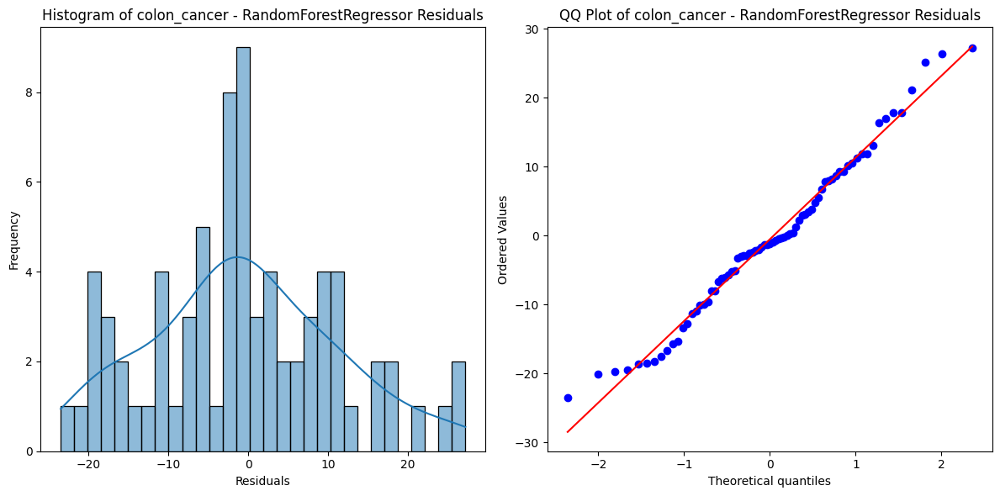

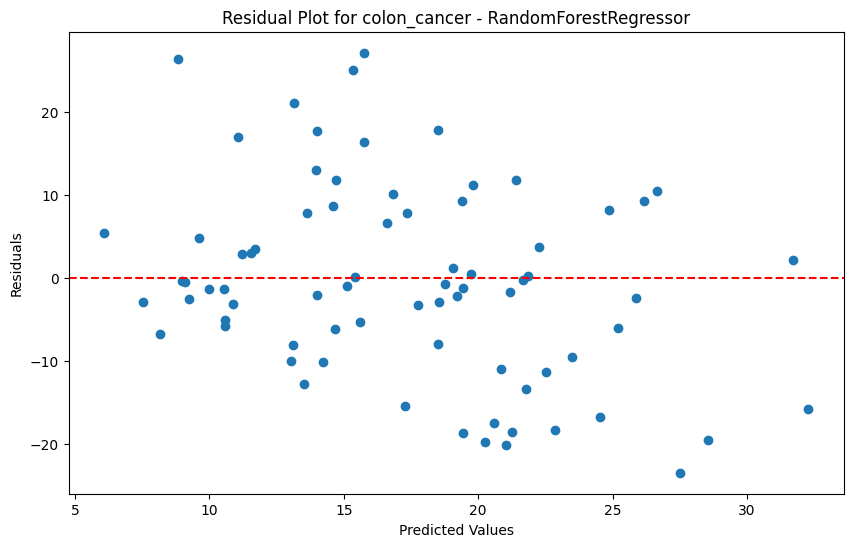

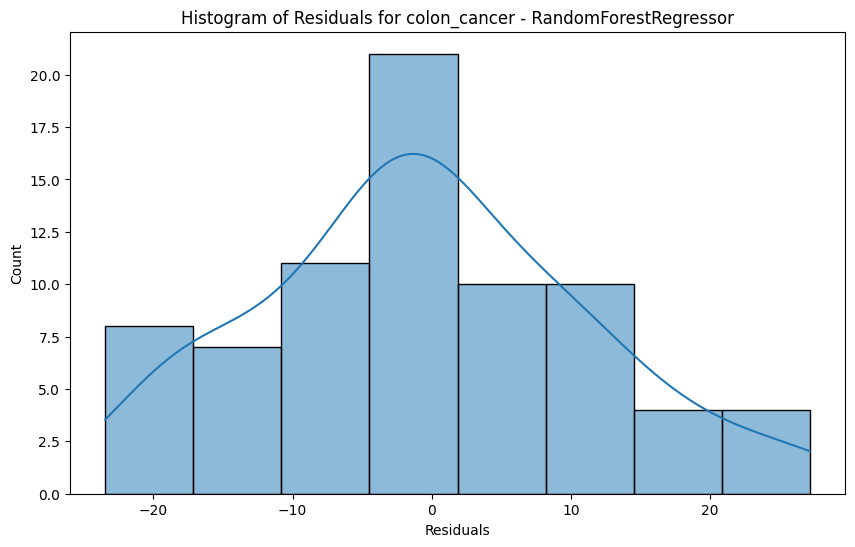

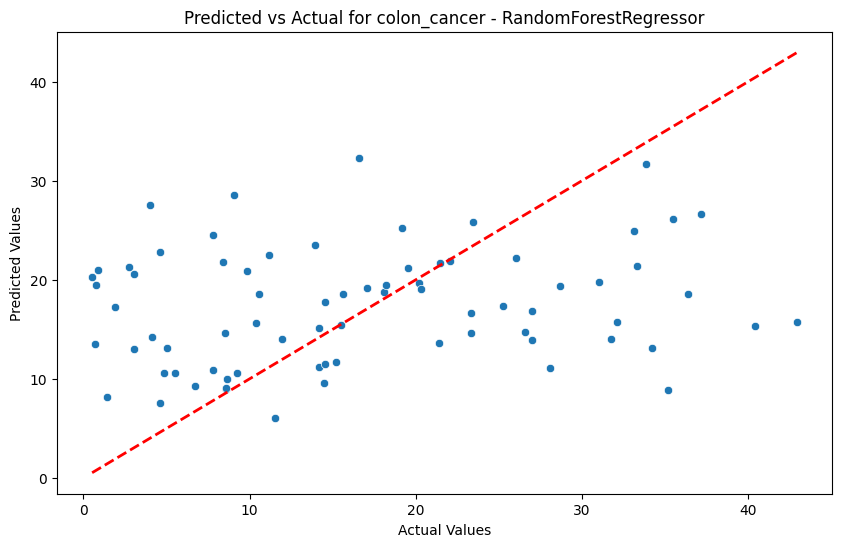

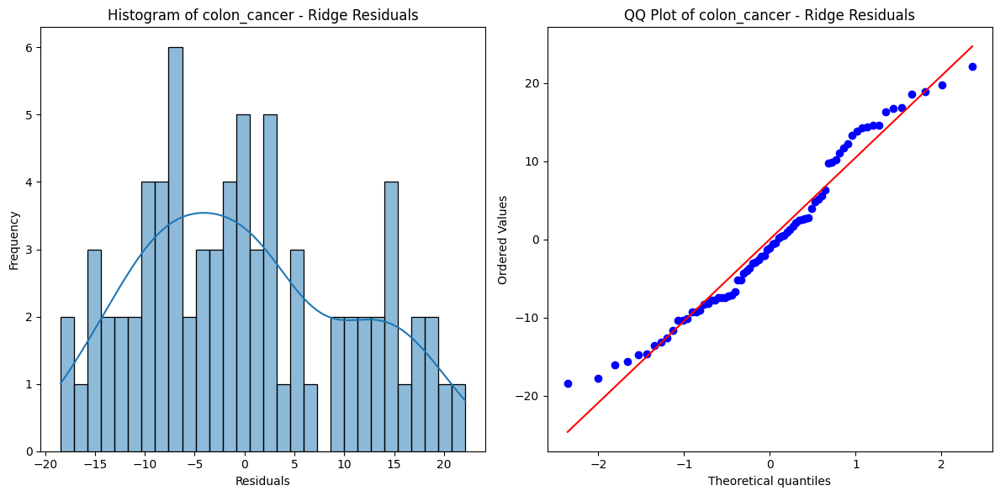

...

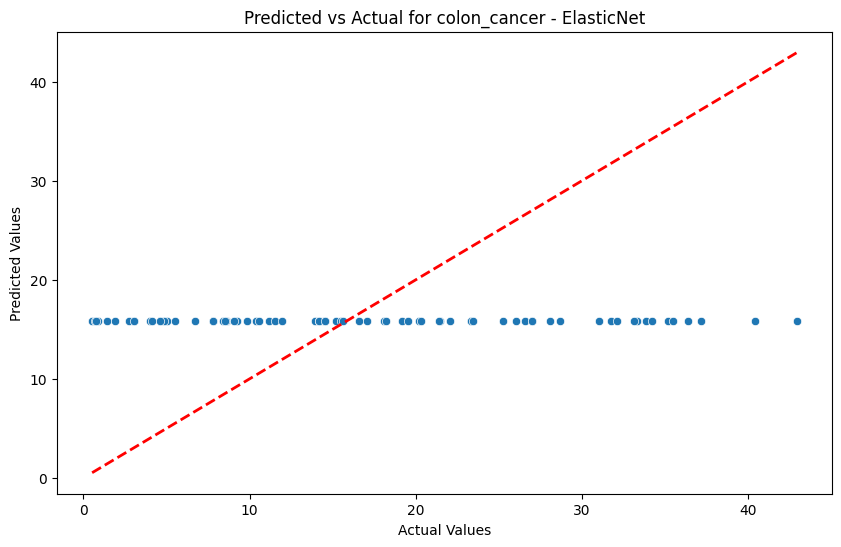

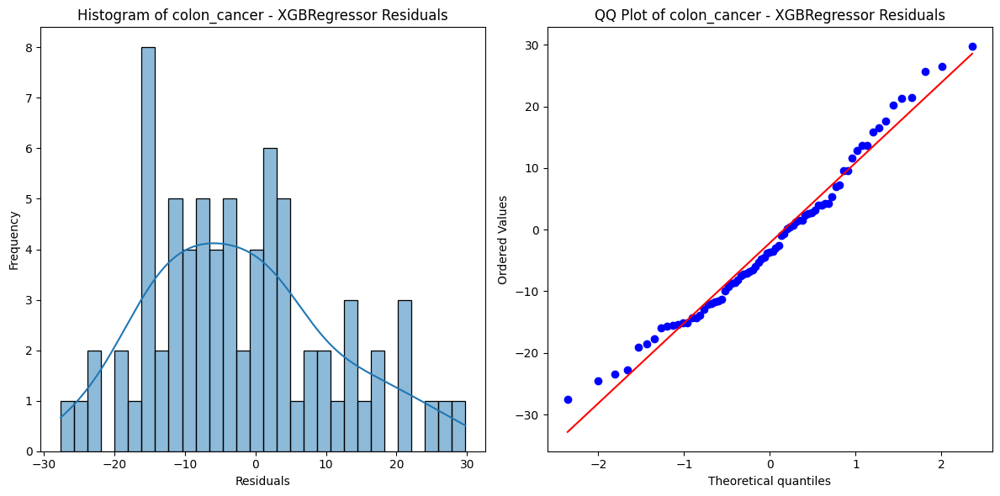

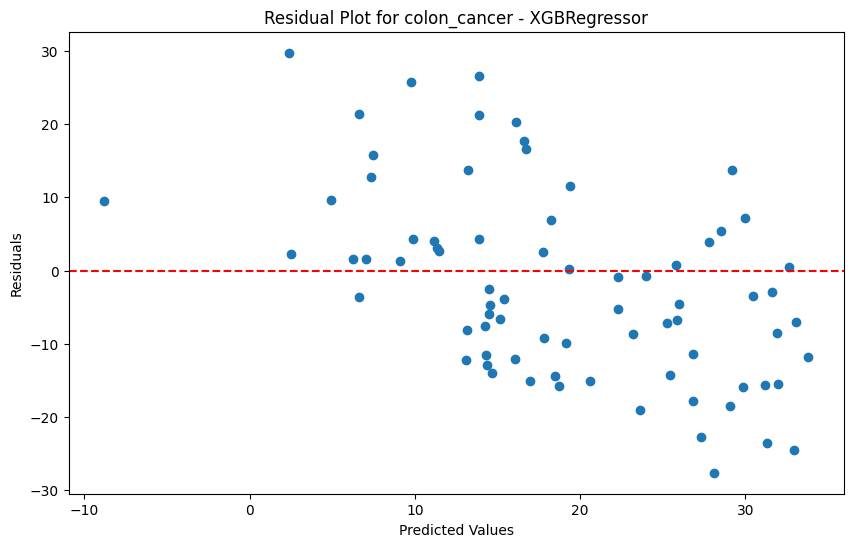

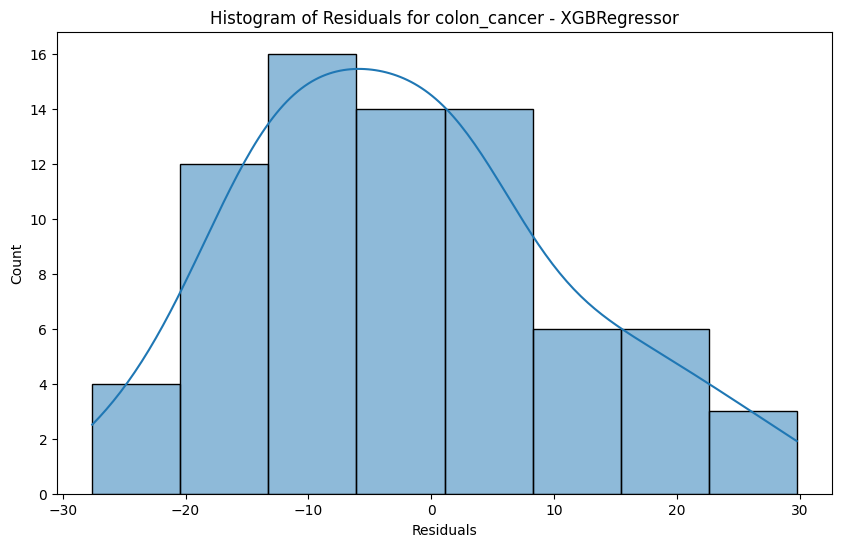

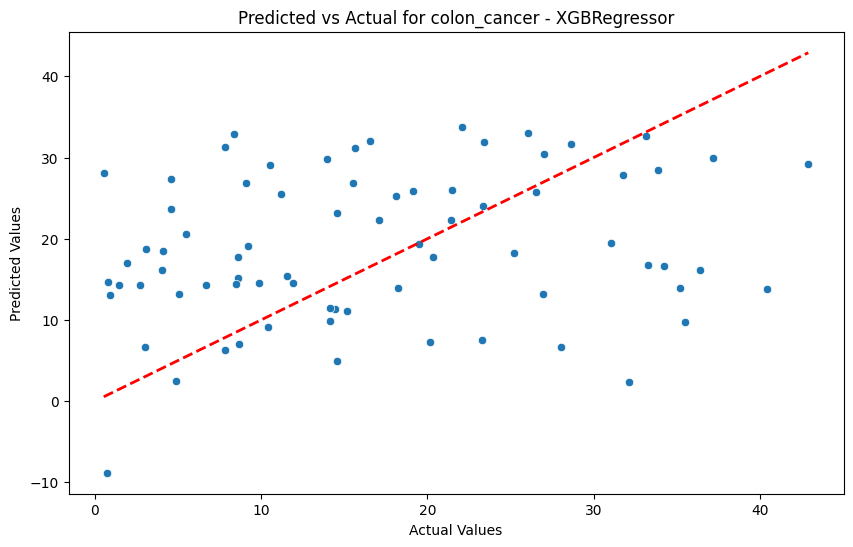

breast_cancer


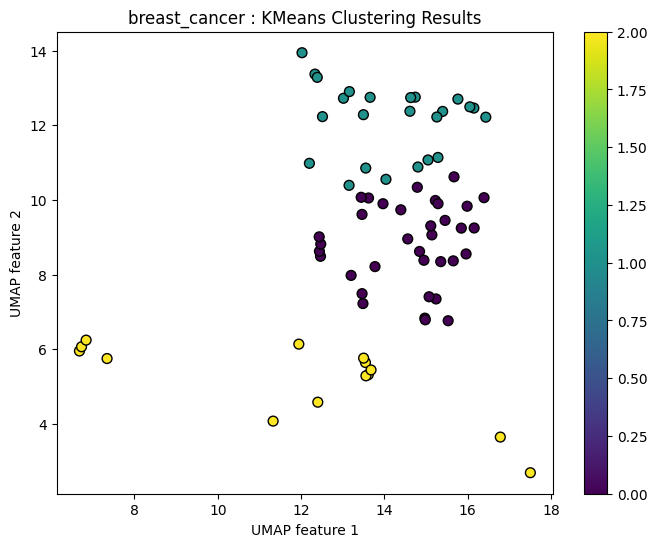

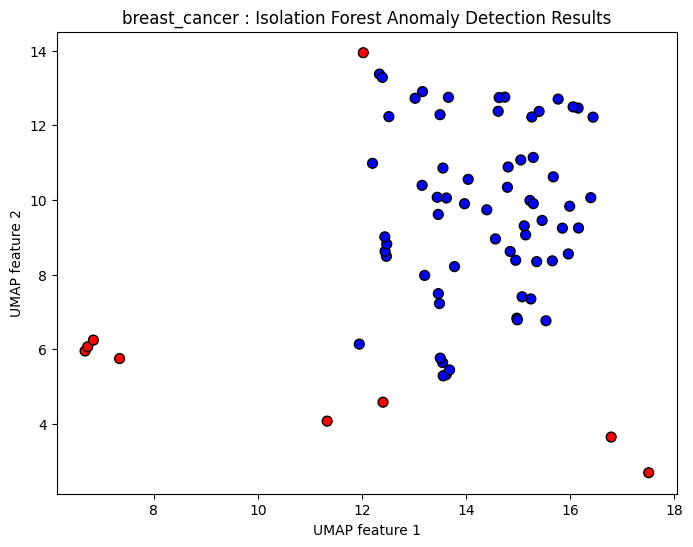

breast_cancer - RandomForestRegressor RMSE: 15.07962335336835
breast_cancer - Ridge RMSE: 14.786301122275315
breast_cancer - Lasso RMSE: 14.781839554392734
breast_cancer - ElasticNet RMSE: 14.781717108330408
breast_cancer - XGBRegressor RMSE: 18.797475533438114


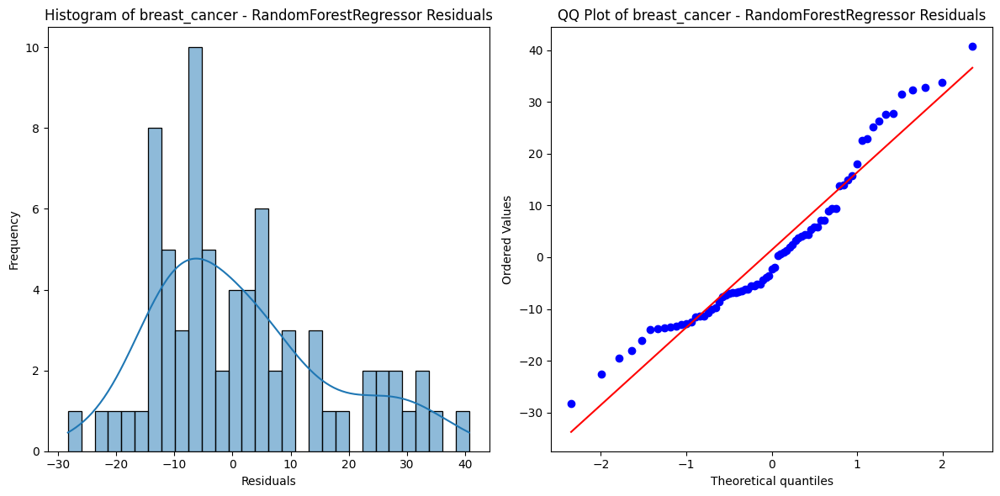

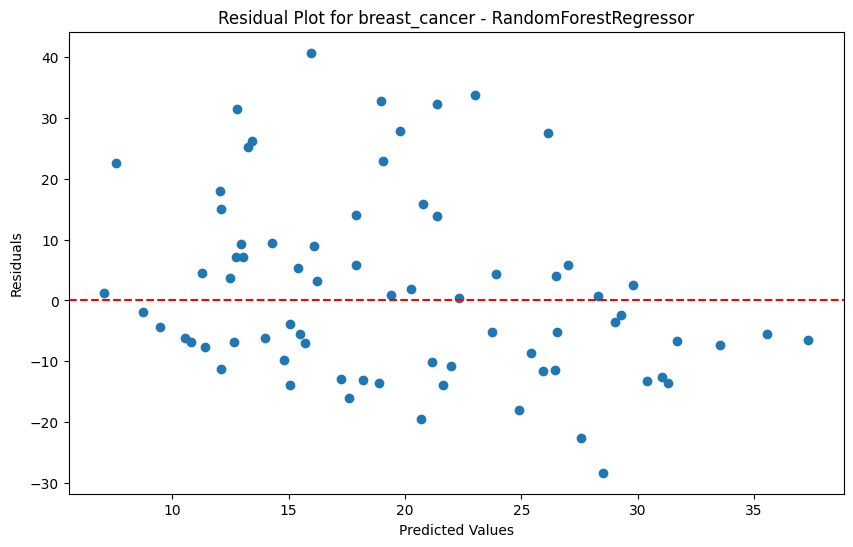

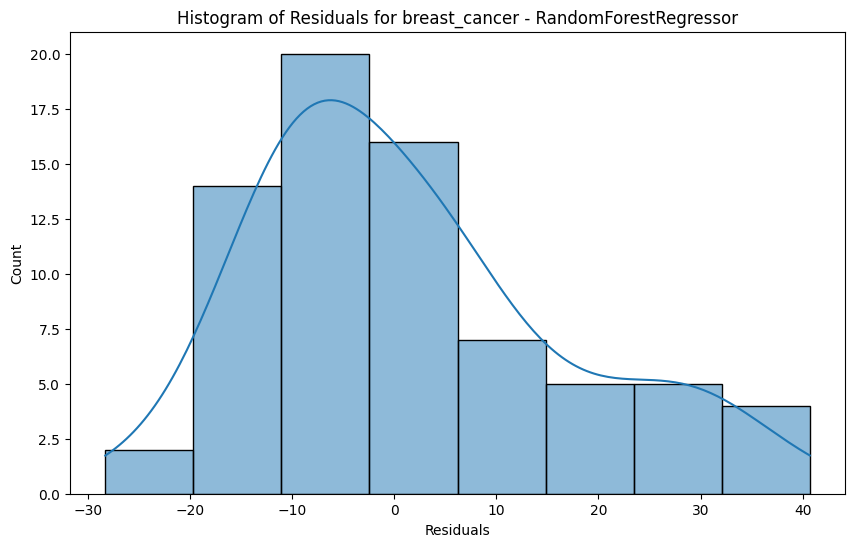

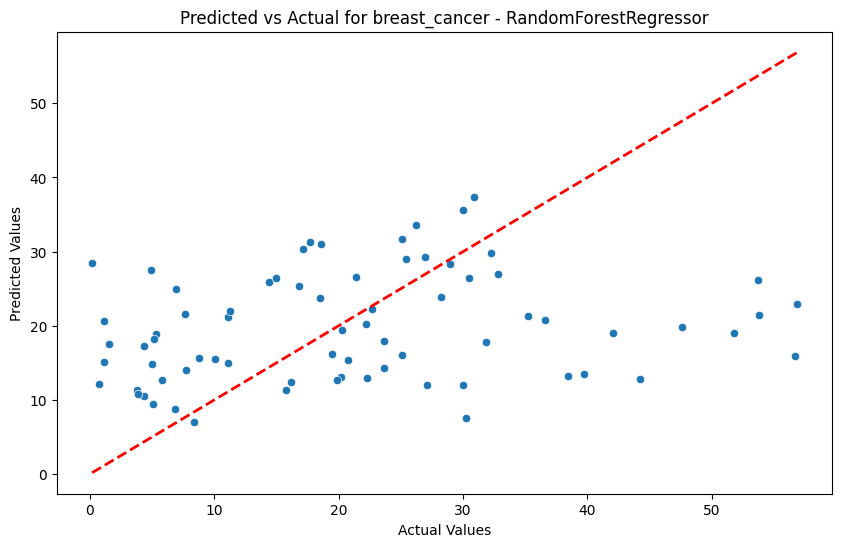

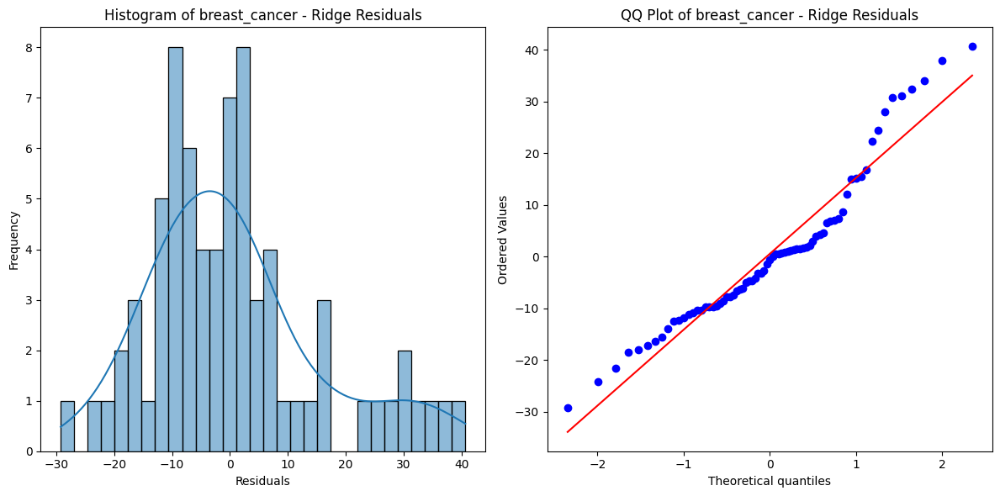

...

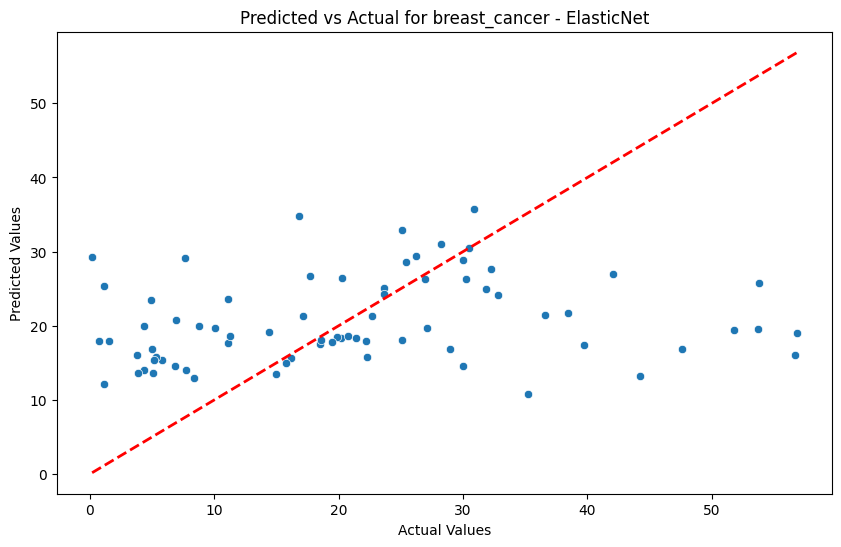

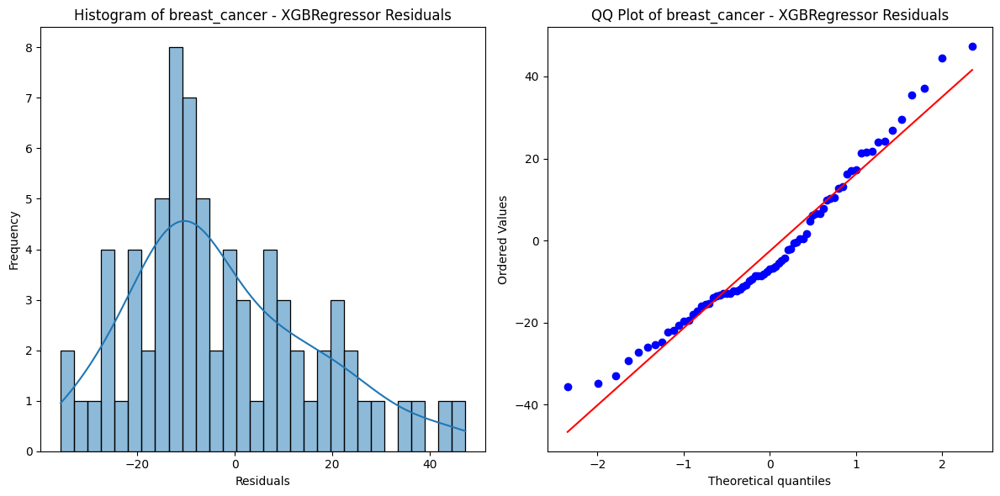

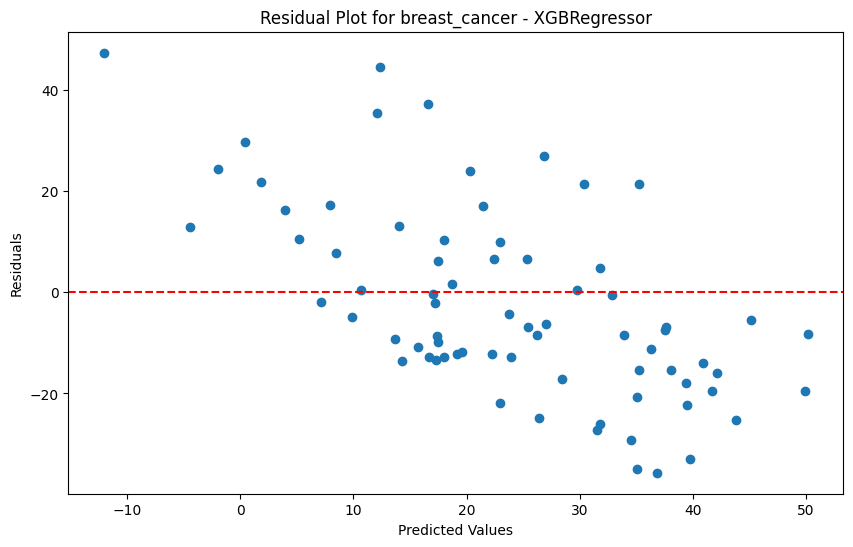

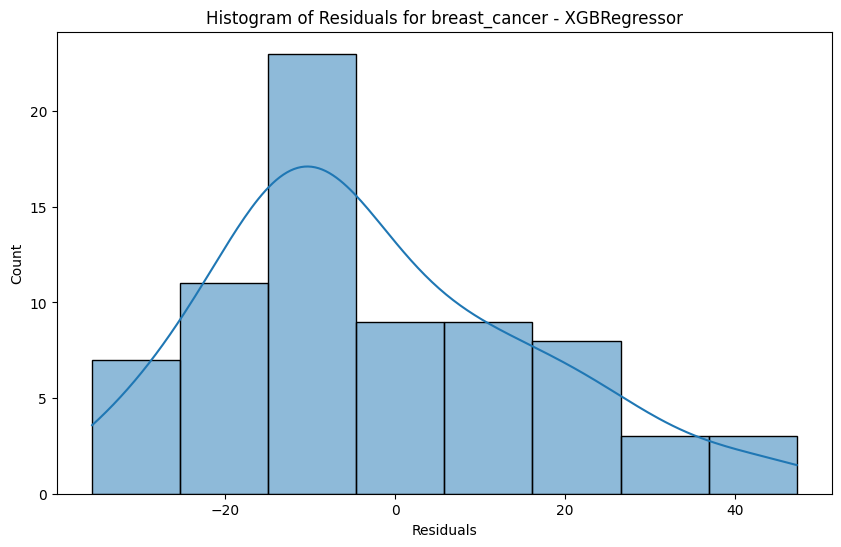

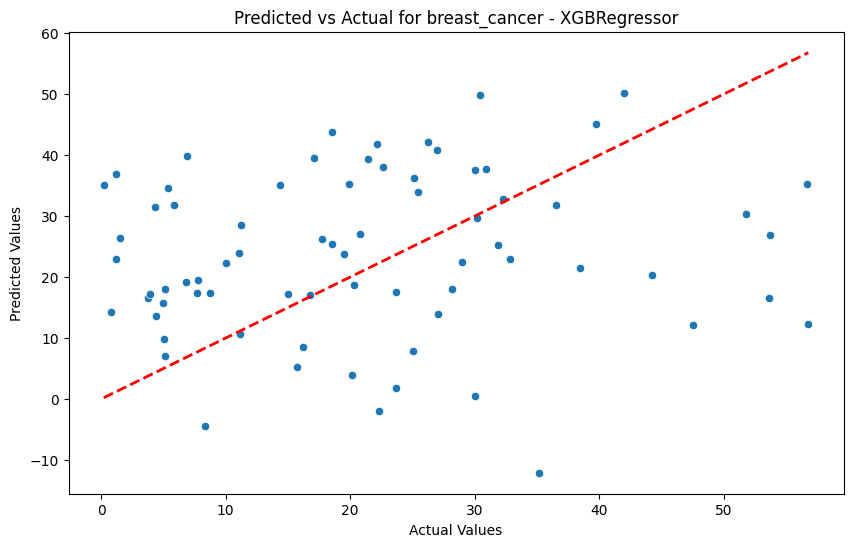

prosta_cancer


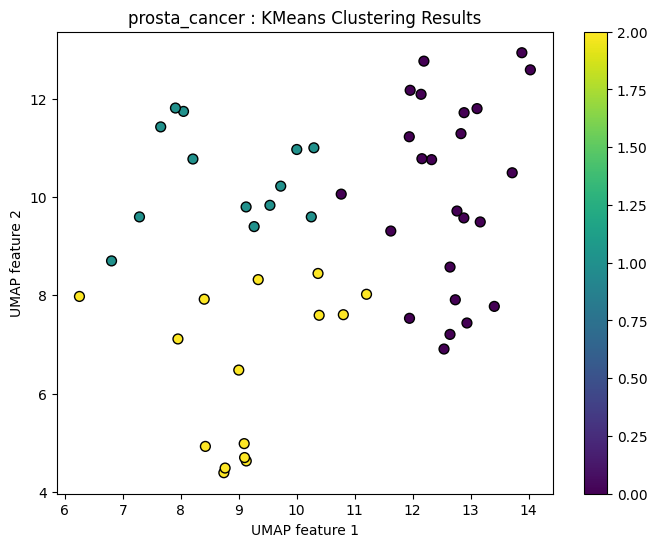

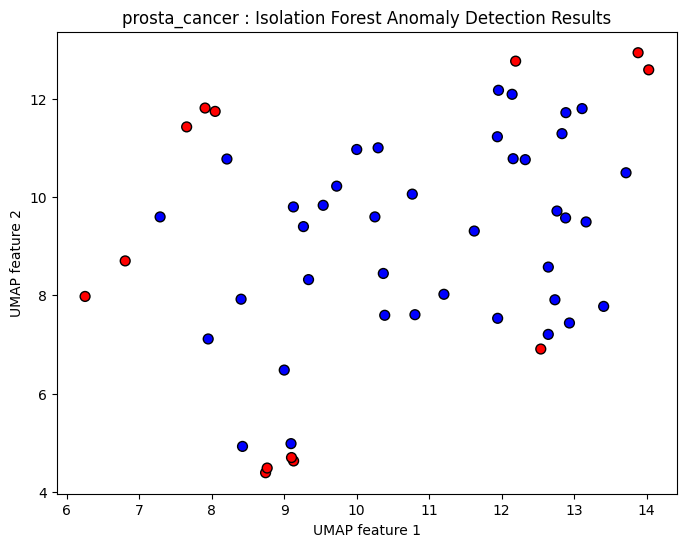

prosta_cancer - RandomForestRegressor RMSE: 15.763703483611673
prosta_cancer - Ridge RMSE: 14.6305514807186
prosta_cancer - Lasso RMSE: 14.630679677613358
prosta_cancer - ElasticNet RMSE: 14.635947901257085
prosta_cancer - XGBRegressor RMSE: 16.805601179147615


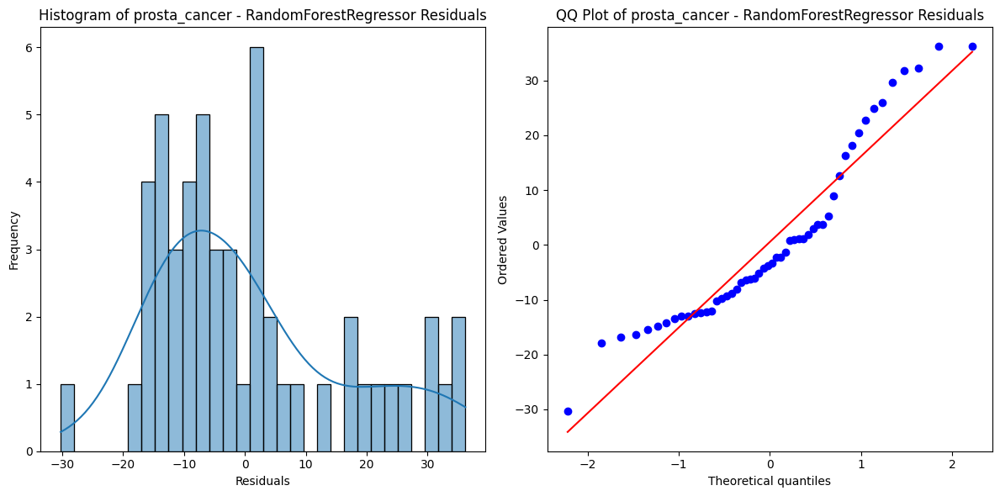

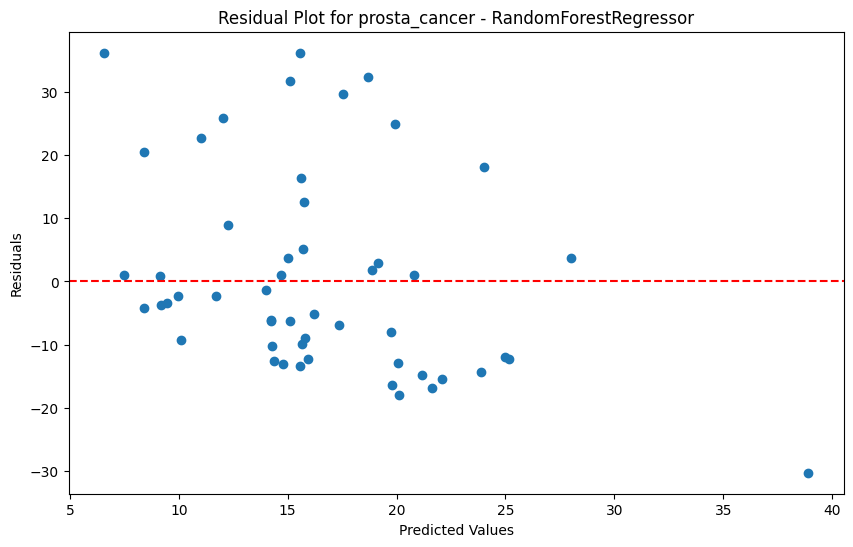

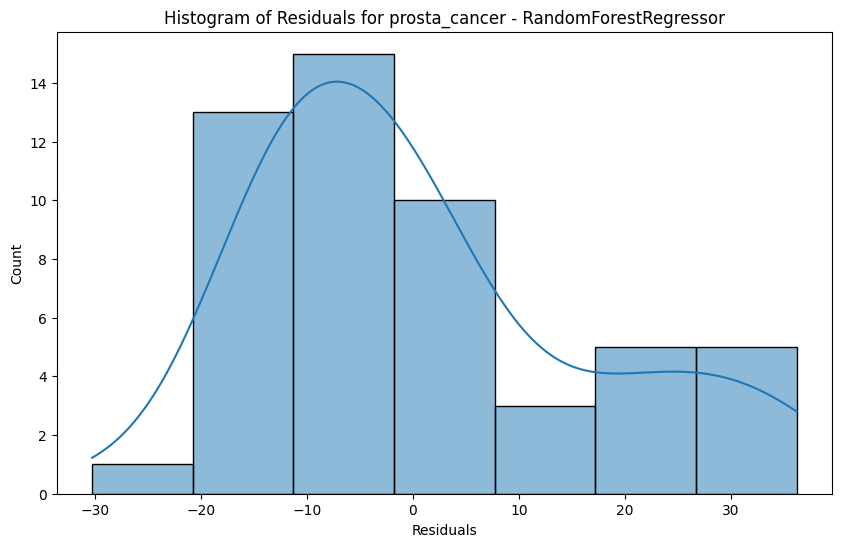

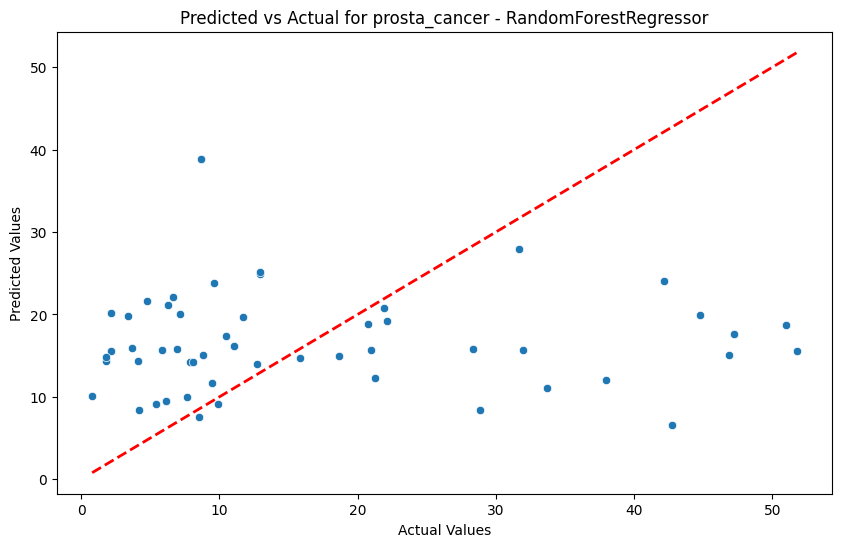

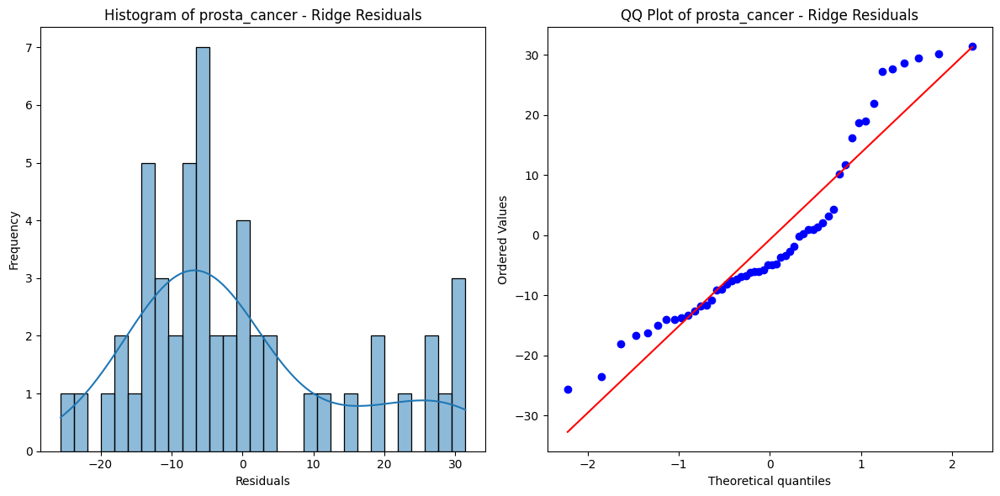

...

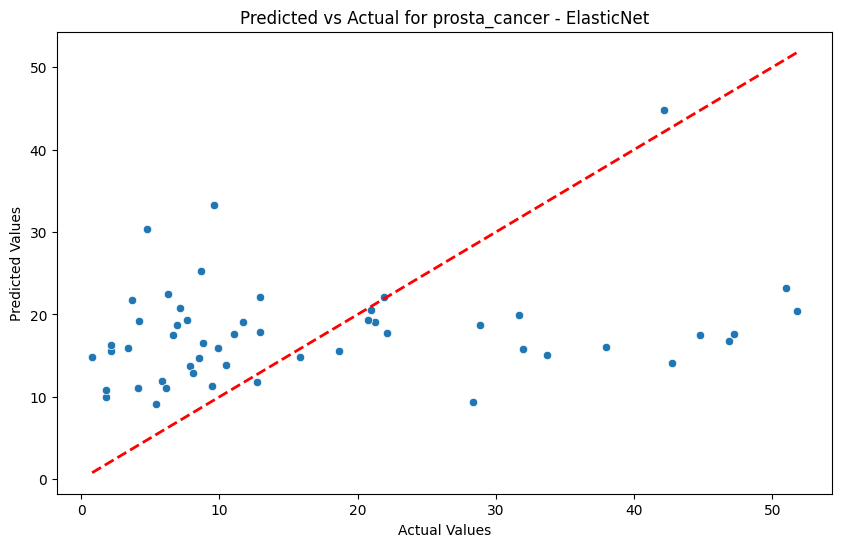

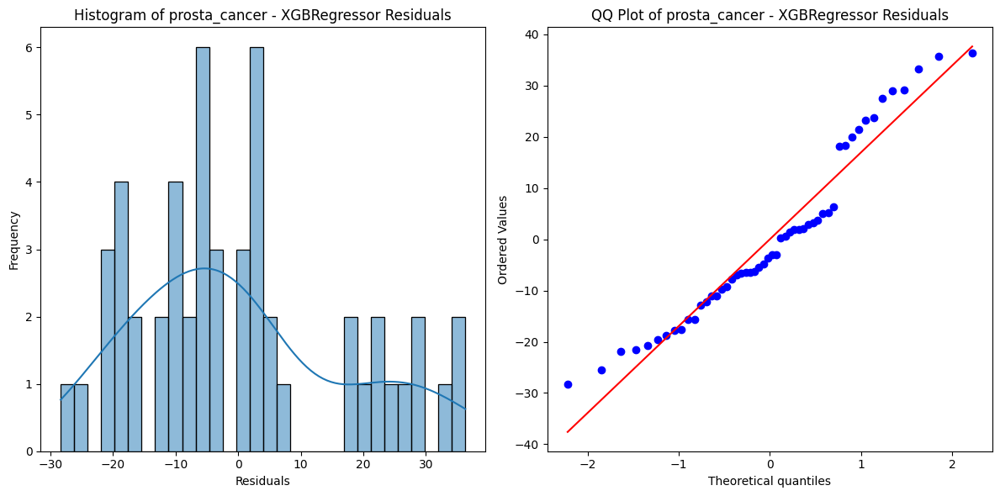

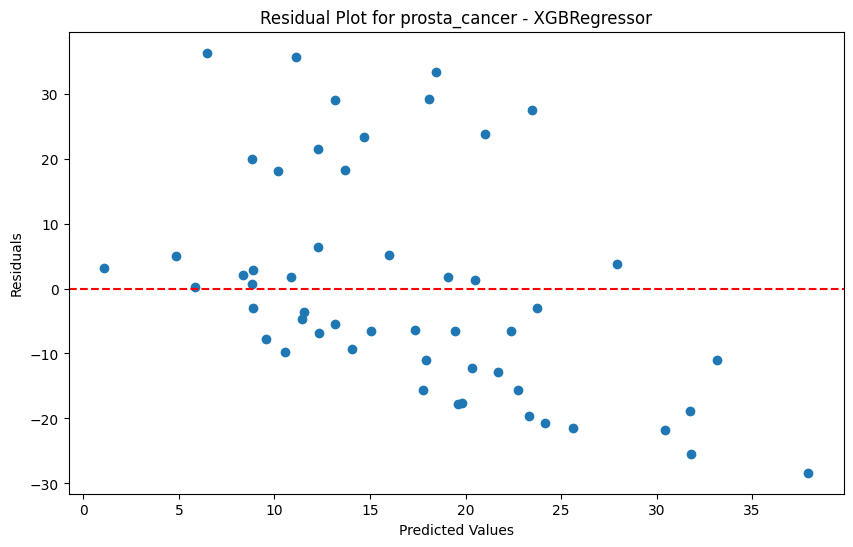

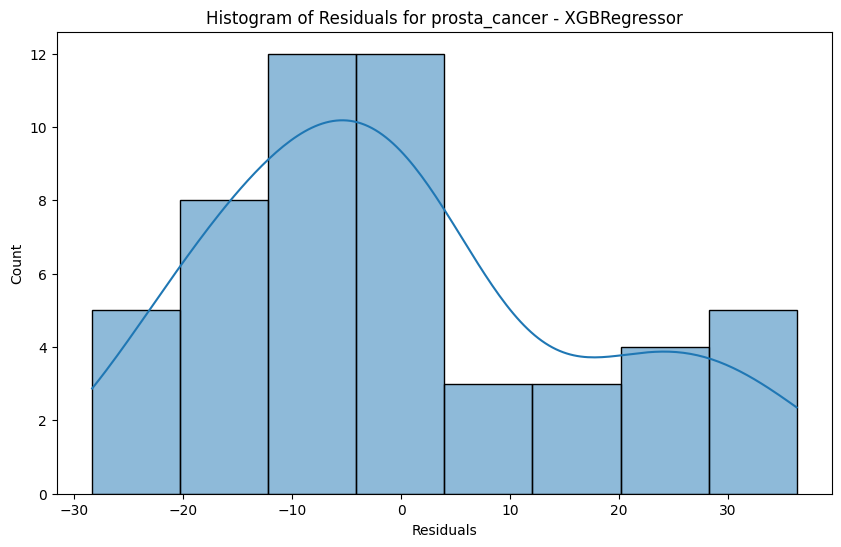

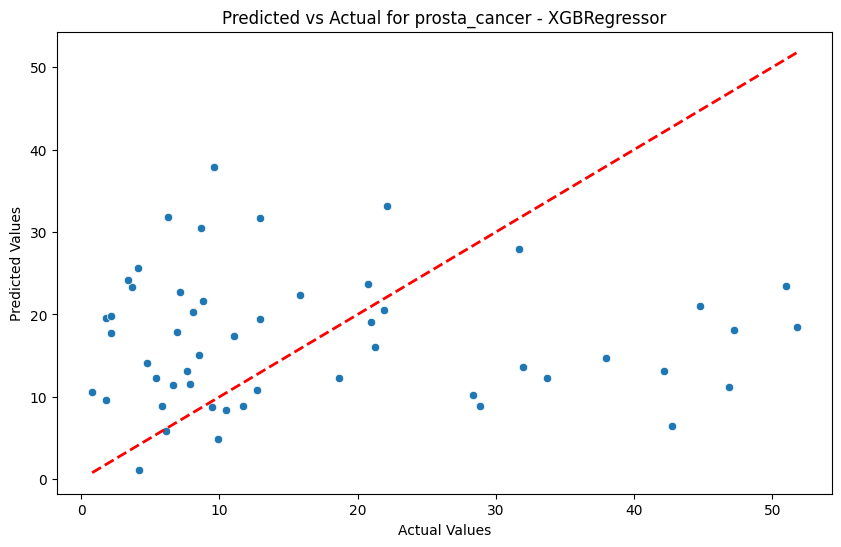

ovary_cancer


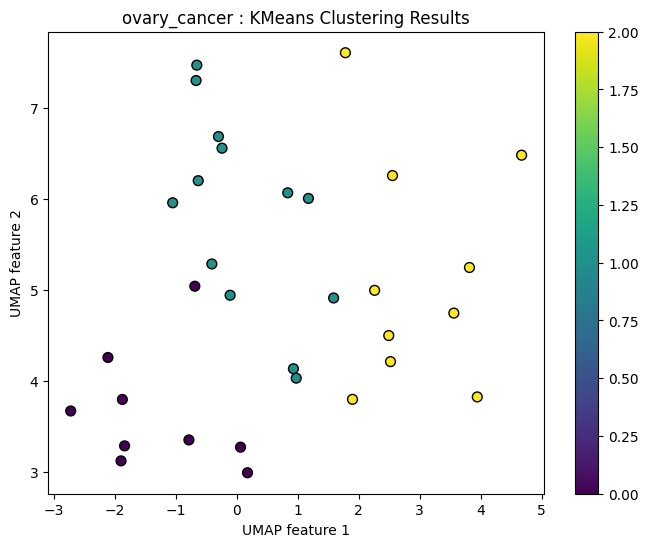

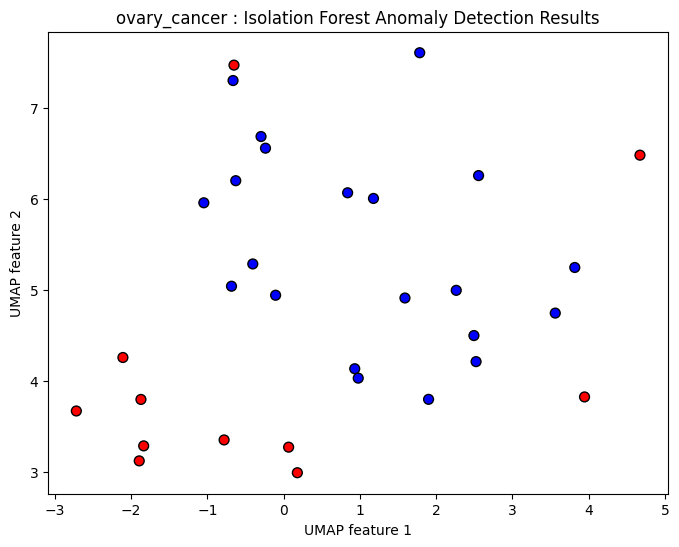

ovary_cancer - RandomForestRegressor RMSE: 9.631808200475756
ovary_cancer - Ridge RMSE: 9.069597334018866
ovary_cancer - Lasso RMSE: 9.066649286504408
ovary_cancer - ElasticNet RMSE: 9.066232587928736
ovary_cancer - XGBRegressor RMSE: 11.117483020316502


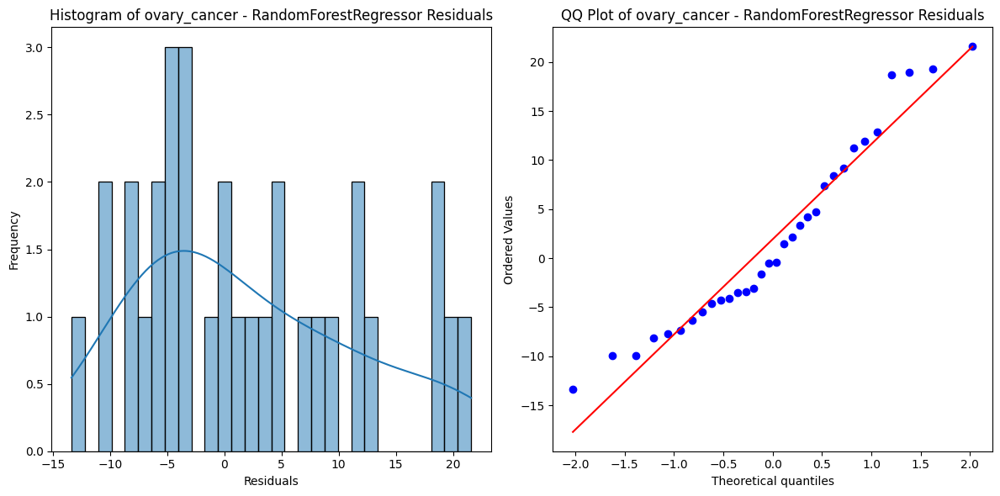

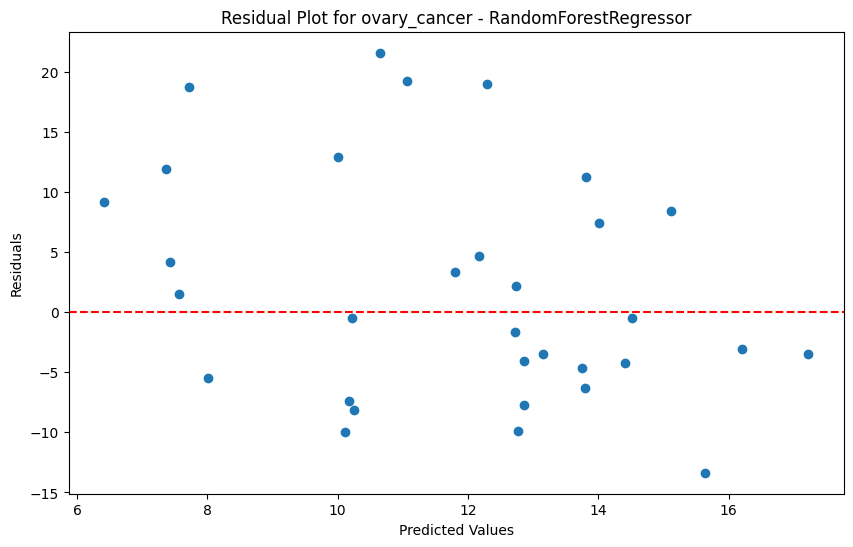

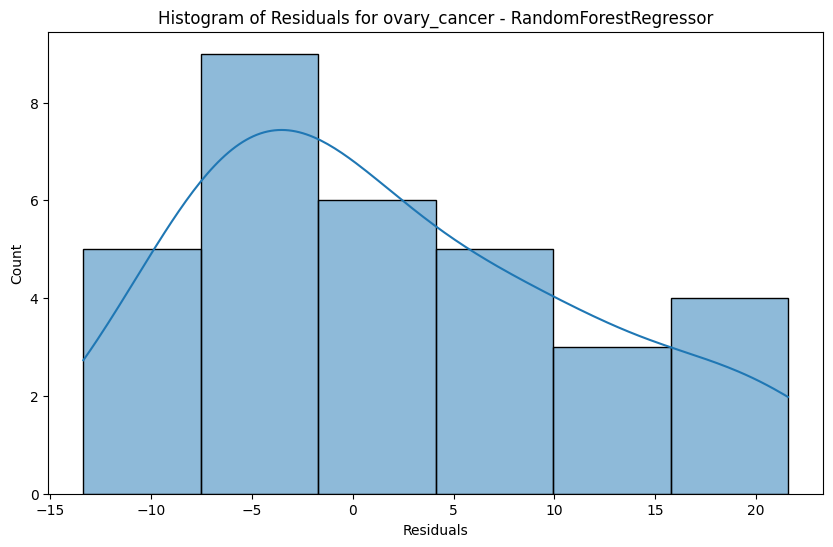

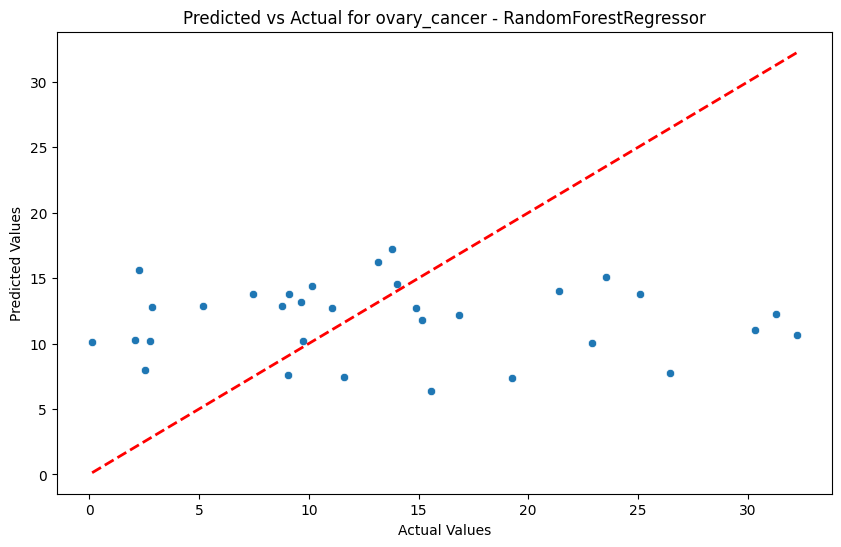

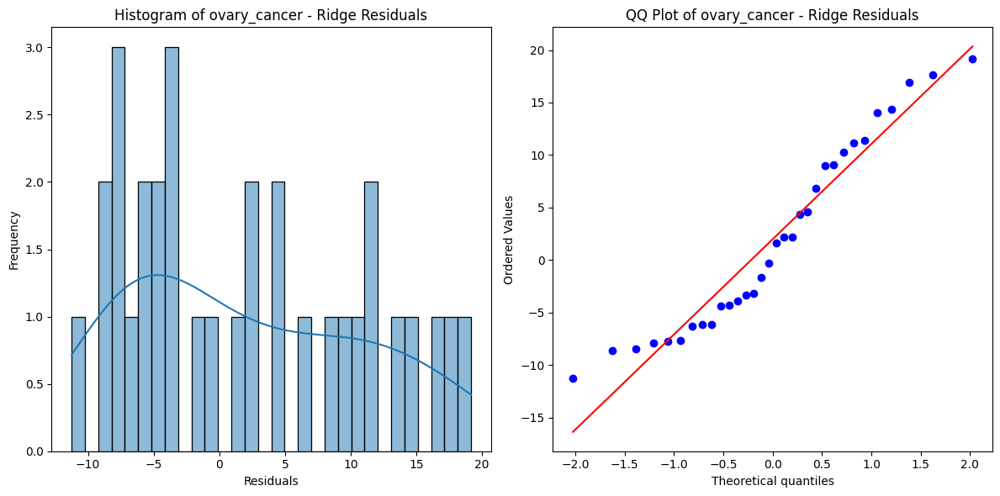

...

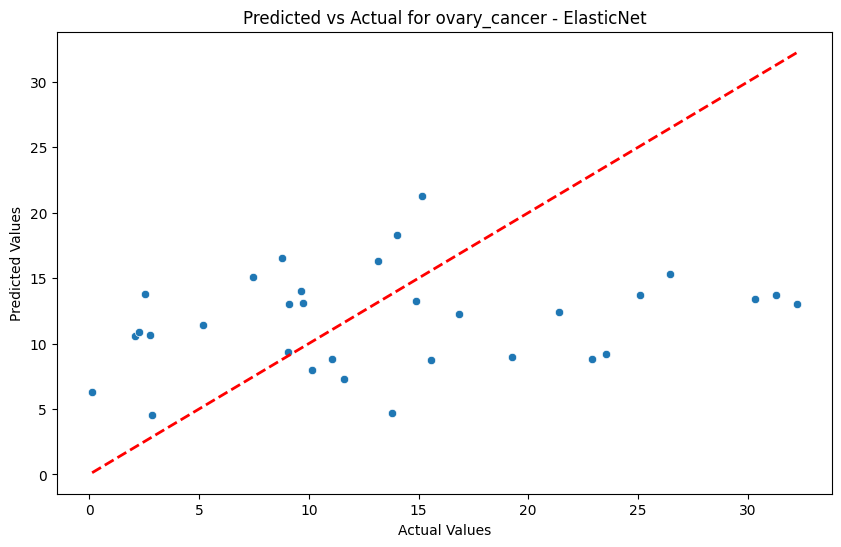

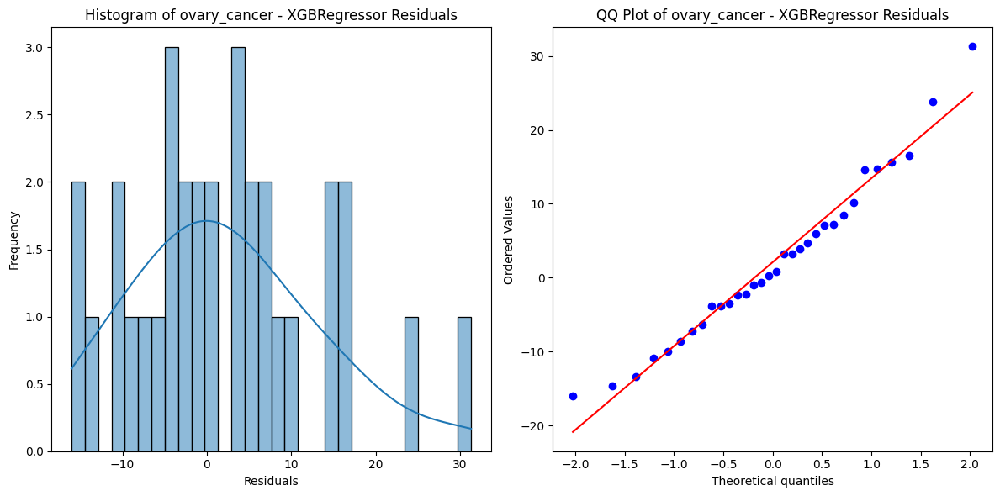

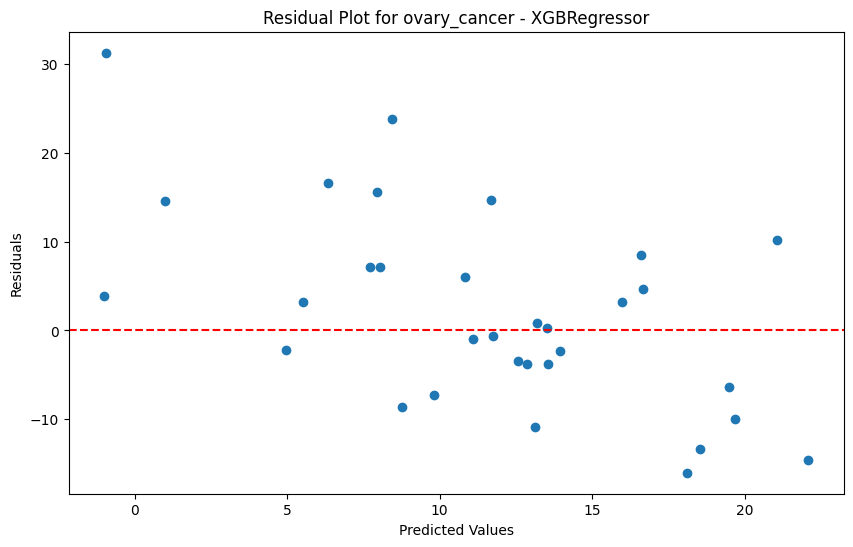

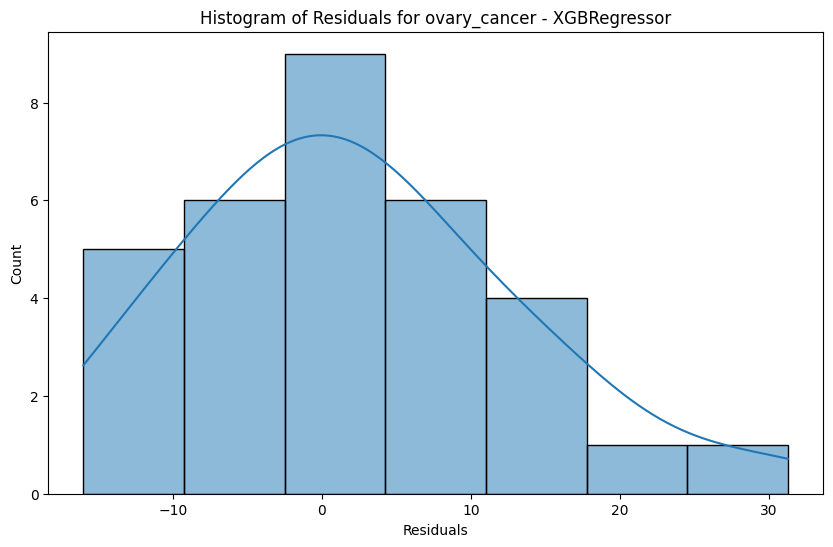

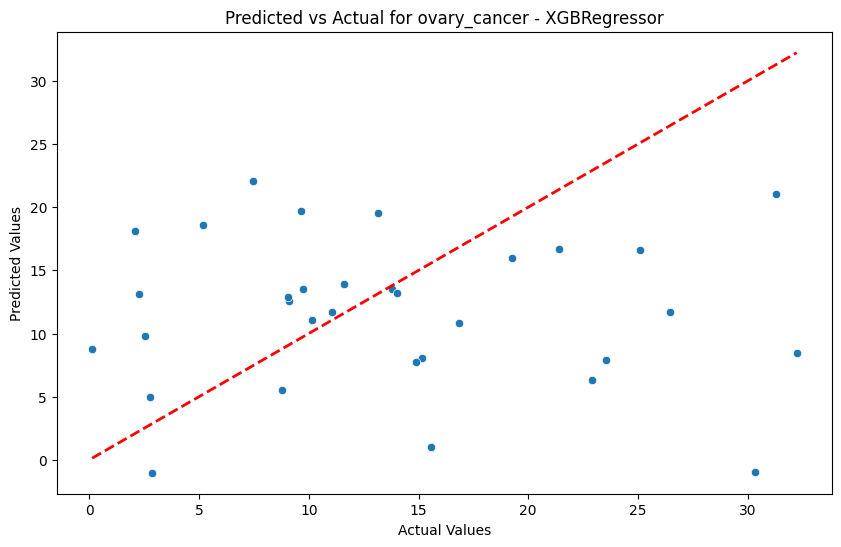

In [103]:
# 学習済みモデルでの予測
def predict_with_trained_model(X, y, cancer_type):
    # PCA、UMAP、KMeans、Isolation Forestモデルをロード
    pca = joblib.load(f'{cancer_type}_pca_model.pkl')
    umap_model = joblib.load(f'{cancer_type}_umap_model.pkl')
    kmeans = joblib.load(f'{cancer_type}_kmeans_model.pkl')
    iso_forest = joblib.load(f'{cancer_type}_iso_forest_model.pkl')

    # データフレームに変換
    df = pd.DataFrame(X, columns=[f"col{i+1}" for i in range(X.shape[1])])

    # PCAによる次元削減
    pca_results = pca.transform(X)

    # UMAPによる次元削減
    umap_results = umap_model.transform(pca_results)
    df['umap_1'] = umap_results[:, 0]
    df['umap_2'] = umap_results[:, 1]

    # UMAPの結果に基づいてKMeansクラスタリングを実行
    kmeans_labels = kmeans.predict(umap_results)
    df['kmeans_cluster'] = kmeans_labels

    # UMAPの結果に基づいてIsolation Forestによる異常検知を実行
    iso_scores = iso_forest.predict(umap_results)
    df['anomaly_score'] = iso_scores

    # クラスタリング結果のプロット
    plot_clusters(umap_results, kmeans_labels, title=f'{cancer_type} : KMeans Clustering Results')

    # 異常検知結果のプロット
    plot_anomaly_detection(umap_results, iso_scores, title=f'{cancer_type} : Isolation Forest Anomaly Detection Results')

    # 追加した特徴量を含むデータセット
    X_extended = np.hstack([X, umap_results, kmeans_labels.reshape(-1, 1), iso_scores.reshape(-1, 1)])

    # すべての学習済みモデルで予測
    predictions = {}
    for model_name in models:
        best_model = joblib.load(f'{cancer_type}_{model_name.lower()}_model.pkl')
        predictions[model_name] = best_model.predict(X_extended)
        rmse = np.sqrt(mean_squared_error(y, predictions[model_name]))
        print(f'{cancer_type} - {model_name} RMSE: {rmse}')

    return predictions


def plot_histogram_and_qq(residuals, preds, y_actual, cancer_type, model_name):
    # numpy array に変換
    if not isinstance(residuals, (np.ndarray, pd.Series)):
        try:
            residuals = np.array(residuals)
        except Exception as e:
            print(f"Error converting residuals to numpy array: {e}")
            return

    plt.figure(figsize=(12, 6))

    # ヒストグラム
    plt.subplot(1, 2, 1)
    sns.histplot(residuals, bins=30, kde=True)
    plt.title(f'Histogram of {cancer_type} - {model_name} Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')

    # QQプロット
    plt.subplot(1, 2, 2)
    stats.probplot(residuals, dist="norm", plot=plt)
    plt.title(f'QQ Plot of {cancer_type} - {model_name} Residuals')

    plt.tight_layout()
    plt.show()

    # 残差プロット
    plt.figure(figsize=(10, 6))
    plt.scatter(preds, residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residual Plot for {cancer_type} - {model_name}')
    plt.show()

    # 残差のヒストグラム
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True)
    plt.xlabel('Residuals')
    plt.title(f'Histogram of Residuals for {cancer_type} - {model_name}')
    plt.show()

    # 予測値と実測値の散布図
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_actual, y=preds)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Predicted vs Actual for {cancer_type} - {model_name}')
    plt.show()

# テストデータでの予測と評価
for cancer_type, data in datasets.items():
    print(cancer_type)
    if cancer_type == 'lung_cancer':
        X_test = lung_test_X
        y_test = lung_test_y
    elif cancer_type == 'pan_cancer':
        X_test = pan_test_X
        y_test = pan_test_y
    elif cancer_type == 'colon_cancer':
        X_test = colon_test_X
        y_test = colon_test_y
    elif cancer_type == 'breast_cancer':
        X_test = breast_test_X
        y_test = breast_test_y
    elif cancer_type == 'prosta_cancer':
        X_test = prosta_test_X
        y_test = prosta_test_y
    elif cancer_type == 'ovary_cancer':
        X_test = ovary_test_X
        y_test = ovary_test_y

    # 予測
    preds = predict_with_trained_model(X_test, y_test, cancer_type)

    # 残差の計算とプロット
    for model_name in models:
        residuals = y_test - preds[model_name]
        plot_histogram_and_qq(residuals, preds[model_name], y_test, cancer_type, model_name)

In [104]:
"""
条件 X+umap+isoforest+cluster
lung_cancer - Ridge RMSE: 12.627416469855605

条件 umap+isoforest+cluster
lung_cancer - Ridge RMSE: 12.592671977309195

条件 tsne+isoforest+残差モデル
lung_cancer - RandomForestRegressor RMSE: 14.286471553981423

条件 X+umap+isoforest+cluster 多重共線性：閾値0.8→0.95
lung_cancer - Ridge RMSE: 12.419489131487726

条件 target_encoding + X+umap+isoforest+cluster 多重共線性：閾値0.8→0.95 + 外れ値除去
lung_cancer - RandomForestRegressor RMSE: 11.924796595393408
lung_cancer - Ridge RMSE: 10.472832654433875
lung_cancer - Lasso RMSE: 10.809816549912517
lung_cancer - ElasticNet RMSE: 10.809816549912517
lung_cancer - XGBRegressor RMSE: 12.112114262227852

pan_cancer - RandomForestRegressor RMSE: 8.928988976973612
pan_cancer - Ridge RMSE: 9.052002525897581
pan_cancer - Lasso RMSE: 9.272456464100943
pan_cancer - ElasticNet RMSE: 9.272456464100943
pan_cancer - XGBRegressor RMSE: 10.237550432634425

colon_cancer - RandomForestRegressor RMSE: 11.592213982957125
colon_cancer - Ridge RMSE: 10.263340122263903
colon_cancer - Lasso RMSE: 11.324074354595792
colon_cancer - ElasticNet RMSE: 11.324074354595792
colon_cancer - XGBRegressor RMSE: 12.828598811433604

breast_cancer - RandomForestRegressor RMSE: 14.625846258391764
breast_cancer - Ridge RMSE: 14.336854990011282
breast_cancer - Lasso RMSE: 14.33576856661793
breast_cancer - ElasticNet RMSE: 14.33547863549166
breast_cancer - XGBRegressor RMSE: 18.392539950429608

prosta_cancer - RandomForestRegressor RMSE: 15.360047227853185
prosta_cancer - Ridge RMSE: 15.094371543487378
prosta_cancer - Lasso RMSE: 15.093694808717299
prosta_cancer - ElasticNet RMSE: 15.093825762044299
prosta_cancer - XGBRegressor RMSE: 16.76202551352131

ovary_cancer - RandomForestRegressor RMSE: 10.199940915542381
ovary_cancer - Ridge RMSE: 8.894781592445153
ovary_cancer - Lasso RMSE: 8.890928789427255
ovary_cancer - ElasticNet RMSE: 8.89075807521461
ovary_cancer - XGBRegressor RMSE: 10.5318185679946

条件 one_hot_encoding + X+umap+isoforest+cluster 多重共線性：閾値0.8→0.95 + 外れ値除去
lung_cancer - RandomForestRegressor RMSE: 12.859331537665051
lung_cancer - Ridge RMSE: 11.879168569859457
lung_cancer - Lasso RMSE: 12.025548057890209
lung_cancer - ElasticNet RMSE: 12.025548057890209
lung_cancer - XGBRegressor RMSE: 14.432178751683374

pan_cancer - RandomForestRegressor RMSE: 9.14108294280245
pan_cancer - Ridge RMSE: 8.596903877701761
pan_cancer - Lasso RMSE: 8.653119678955429
pan_cancer - ElasticNet RMSE: 8.653119678955429
pan_cancer - XGBRegressor RMSE: 12.636752237843597

colon_cancer - RandomForestRegressor RMSE: 11.880291009349524
colon_cancer - Ridge RMSE: 10.820183962122087
colon_cancer - Lasso RMSE: 10.946033306942814
colon_cancer - ElasticNet RMSE: 10.946033306942814
colon_cancer - XGBRegressor RMSE: 15.382100632853746

breast_cancer - RandomForestRegressor RMSE: 19.162602520250978
breast_cancer - Ridge RMSE: 14.956629970971804
breast_cancer - Lasso RMSE: 15.208813415725034
breast_cancer - ElasticNet RMSE: 15.20936328138688
breast_cancer - XGBRegressor RMSE: 21.487123430177416

prosta_cancer - RandomForestRegressor RMSE: 15.665166148869858
prosta_cancer - Ridge RMSE: 13.287040173578278
prosta_cancer - Lasso RMSE: 13.2873694263274
prosta_cancer - ElasticNet RMSE: 13.287377852630543
prosta_cancer - XGBRegressor RMSE: 16.28646961811209

ovary_cancer - RandomForestRegressor RMSE: 8.964736354337353
ovary_cancer - Ridge RMSE: 8.17810296044994
ovary_cancer - Lasso RMSE: 8.342305546121269
ovary_cancer - ElasticNet RMSE: 8.342305546121269
ovary_cancer - XGBRegressor RMSE: 8.934726314178304

"""

'\n条件 X+umap+isoforest+cluster\nlung_cancer - Ridge RMSE: 12.627416469855605\n\n条件 umap+isoforest+cluster\nlung_cancer - Ridge RMSE: 12.592671977309195\n\n条件 tsne+isoforest+残差モデル\nlung_cancer - RandomForestRegressor RMSE: 14.286471553981423\n\n条件 X+umap+isoforest+cluster 多重共線性：閾値0.8→0.95\nlung_cancer - Ridge RMSE: 12.419489131487726\n\n条件 target_encoding + X+umap+isoforest+cluster 多重共線性：閾値0.8→0.95 + 外れ値除去\nlung_cancer - RandomForestRegressor RMSE: 11.924796595393408\nlung_cancer - Ridge RMSE: 10.472832654433875\nlung_cancer - Lasso RMSE: 10.809816549912517\nlung_cancer - ElasticNet RMSE: 10.809816549912517\nlung_cancer - XGBRegressor RMSE: 12.112114262227852\n\npan_cancer - RandomForestRegressor RMSE: 8.928988976973612\npan_cancer - Ridge RMSE: 9.052002525897581\npan_cancer - Lasso RMSE: 9.272456464100943\npan_cancer - ElasticNet RMSE: 9.272456464100943\npan_cancer - XGBRegressor RMSE: 10.237550432634425\n\ncolon_cancer - RandomForestRegressor RMSE: 11.592213982957125\ncolon_cancer - R

In [105]:
lung2.columns

Index(['Distant Mets: Biliary tract', 'Distant Mets: Bladder/UT',
       'Distant Mets: Bone', 'Distant Mets: Bowel', 'Distant Mets: Breast',
       'Distant Mets: CNS/Brain', 'Distant Mets: Distant LN',
       'Distant Mets: Female Genital', 'Distant Mets: Head and Neck',
       'Distant Mets: Intra-Abdominal', 'Distant Mets: Kidney',
       'Distant Mets: Liver', 'Distant Mets: Lung',
       'Distant Mets: Male Genital', 'Distant Mets: Mediastinum',
       'Distant Mets: Ovary', 'Distant Mets: Pleura', 'Distant Mets: PNS',
       'Distant Mets: Skin', 'Distant Mets: Unspecified', 'FGA', 'Gene Panel',
       'Metastatic patient', 'Met Count', 'Met Site Count', 'Mutation Count',
       'Overall Survival (Months)', 'Primary Tumor Site', 'Race Category',
       'Number of Samples Per Patient', 'Sample coverage', 'Sex',
       'Tumor Purity'],
      dtype='object')

In [106]:
# 重要な特徴量を選択
important_features = ['Distant Mets: Biliary tract', 'Distant Mets: Bladder/UT',
       'Distant Mets: Bone', 'Distant Mets: Bowel', 'Distant Mets: Breast',
       'Distant Mets: CNS/Brain', 'Distant Mets: Distant LN',
       'Distant Mets: Female Genital', 'Distant Mets: Head and Neck',
       'Distant Mets: Intra-Abdominal', 'Distant Mets: Kidney',
       'Distant Mets: Liver', 'Distant Mets: Lung',
       'Distant Mets: Male Genital', 'Distant Mets: Mediastinum',
       'Distant Mets: Ovary', 'Distant Mets: Pleura', 'Distant Mets: PNS',
       'Distant Mets: Skin', 'Distant Mets: Unspecified', 'Gene Panel',
       'Metastatic patient', 'Met Site Count',
       'Primary Tumor Site', 'Race Category', 'Number of Samples Per Patient',
       'Sex', 'Tumor Purity']

# 目的変数と説明変数の分割
X = lung2[important_features]
y = lung2['Overall Survival (Months)']


# 目的変数を説明変数に追加して新しいデータフレームを作成
data_with_target = X.copy()
data_with_target['Overall Survival (Months)'] = y

# 特徴量の組み合わせに基づいてグループ化し、目的変数の分散を計算
grouped = data_with_target.groupby(important_features).agg({'Overall Survival (Months)': ['var', 'count']})
grouped.columns = ['variance', 'count']
grouped = grouped.reset_index()

# グループ内のサンプル数が2以上のグループのみを対象に分散を計算
# grouped = grouped[grouped['count'] >= 2]

# 目的変数の分散が大きいグループを抽出
threshold = grouped['variance'].quantile(0.95)  # 上位5%の分散を持つグループを抽出
high_variance_groups = grouped[grouped['variance'] > threshold]

# 高分散グループのデータを元のデータから抽出
high_variance_data = pd.merge(data_with_target, high_variance_groups, on=important_features)

# 結果の表示
print("高分散グループのデータ:")
display(high_variance_data)

高分散グループのデータ:


,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,Gene Panel,Metastatic patient,Met Site Count,Primary Tumor Site,Race Category,Number of Samples Per Patient,Sex,Tumor Purity,Overall Survival (Months),variance,count
0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,17.601753,1.0,3,15.309474,14.613387,1,0,30.0,15.41,474.936200,2
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,17.601753,1.0,1,15.309474,14.613387,1,1,40.0,5.32,825.762133,3
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,17.601753,1.0,1,15.309474,14.613387,1,1,40.0,55.72,825.762133,3
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,17.601753,1.0,1,15.309474,14.613387,1,1,20.0,13.90,696.391200,2
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,17.601753,1.0,1,15.309474,14.613387,1,1,40.0,54.44,825.762133,3
5,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,17.601753,1.0,3,15.309474,14.613387,1,0,30.0,46.23,474.936200,2
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,17.601753,1.0,1,15.309474,14.613387,1,1,20.0,51.22,696.391200,2
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,13.536099,1.0,2,15.309474,14.613387,1,0,40.0,45.47,470.938050,2
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,13.536099,1.0,2,15.309474,14.613387,1,0,40.0,14.78,470.938050,2


In [107]:
important_features

['Distant Mets: Biliary tract',
 'Distant Mets: Bladder/UT',
 'Distant Mets: Bone',
 'Distant Mets: Bowel',
 'Distant Mets: Breast',
 'Distant Mets: CNS/Brain',
 'Distant Mets: Distant LN',
 'Distant Mets: Female Genital',
 'Distant Mets: Head and Neck',
 'Distant Mets: Intra-Abdominal',
 'Distant Mets: Kidney',
 'Distant Mets: Liver',
 'Distant Mets: Lung',
 'Distant Mets: Male Genital',
 'Distant Mets: Mediastinum',
 'Distant Mets: Ovary',
 'Distant Mets: Pleura',
 'Distant Mets: PNS',
 'Distant Mets: Skin',
 'Distant Mets: Unspecified',
 'Gene Panel',
 'Metastatic patient',
 'Met Site Count',
 'Primary Tumor Site',
 'Race Category',
 'Number of Samples Per Patient',
 'Sex',
 'Tumor Purity']

In [108]:
data_with_target

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,Gene Panel,Metastatic patient,Met Site Count,Primary Tumor Site,Race Category,Number of Samples Per Patient,Sex,Tumor Purity,Overall Survival (Months)
44,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,16.733835,1.0,4,15.309474,14.613387,1,1,50.0,47.90
60,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,1,16.733835,1.0,7,15.309474,14.613387,1,0,30.0,19.58
69,1,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,1,16.733835,1.0,8,15.309474,16.680078,1,0,50.0,18.73
105,0,0,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,17.601753,1.0,7,15.309474,14.613387,1,0,40.0,13.21
128,0,0,1,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,16.733835,1.0,7,15.309474,14.613387,1,1,30.0,39.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25485,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,13.536099,1.0,4,15.309474,14.130863,1,0,20.0,1.31
25508,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.536099,1.0,1,15.309474,14.613387,1,0,50.0,0.66
25535,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,1,13.536099,1.0,8,15.309474,14.130863,1,1,30.0,8.51
25536,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,13.536099,1.0,3,15.309474,14.613387,1,1,30.0,10.87


In [109]:
grouped

,Distant Mets: Biliary tract,Distant Mets: Bladder/UT,Distant Mets: Bone,Distant Mets: Bowel,Distant Mets: Breast,Distant Mets: CNS/Brain,Distant Mets: Distant LN,Distant Mets: Female Genital,Distant Mets: Head and Neck,Distant Mets: Intra-Abdominal,Distant Mets: Kidney,Distant Mets: Liver,Distant Mets: Lung,Distant Mets: Male Genital,Distant Mets: Mediastinum,Distant Mets: Ovary,Distant Mets: Pleura,Distant Mets: PNS,Distant Mets: Skin,Distant Mets: Unspecified,Gene Panel,Metastatic patient,Met Site Count,Primary Tumor Site,Race Category,Number of Samples Per Patient,Sex,Tumor Purity,variance,count
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.536099,1.0,1,15.309474,14.613387,1,0,10.0,NaN,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.536099,1.0,1,15.309474,14.613387,1,0,20.0,NaN,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.536099,1.0,1,15.309474,14.613387,1,0,60.0,NaN,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.536099,1.0,1,15.309474,14.613387,1,1,10.0,NaN,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16.733835,1.0,1,15.309474,14.613387,1,0,30.0,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,1,1,1,0,0,1,0,0,0,0,1,1,1,0,0,0,0,1,0,1,13.536099,1.0,10,15.309474,16.680078,1,1,10.0,NaN,1
1322,1,1,1,0,0,1,1,0,0,1,1,1,1,0,0,0,1,0,0,1,17.601753,1.0,11,15.309474,21.974885,1,1,40.0,NaN,1
1323,1,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,16.733835,1.0,9,15.309474,14.613387,1,1,20.0,NaN,1
1324,1,1,1,1,0,1,1,0,0,1,0,1,1,0,0,0,0,0,1,1,17.601753,1.0,11,15.309474,14.613387,1,0,30.0,NaN,1


In [110]:
lung2.to_csv('lung2.csv', index=False)

線形回帰モデルでデータを予測し、残差を算出。  
残差を目的変数としてガウス回帰モデルを学習。  
新しいデータに対して、線形回帰モデルで予測を行い、ガウス回帰モデルで残差を予測。  
最終予測は線形回帰モデルの予測値にガウス回帰モデルの予測残差を加える。  

In [111]:
# from google.colab import files
# import re

# uploaded = files.upload()

# for fn in uploaded.keys():
#   fn_s = re.escape(fn)
#   output_fn = fn.split('.', 1)[0]+'.html'
#   output_fn_s = re.escape(output_fn)
#   !jupyter nbconvert --to html $fn_s
#   files.download(output_fn)
#   !rm $fn_s